# Measuring emission line fluxes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import lmfit
from lmfit import minimize, Parameters
from astropy.io import fits

import uncertainties.umath as uum
from uncertainties import ufloat
from uncertainties import unumpy as upy

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

from magE.directMethod import directT, run_all
from magE.functions import mergeSpec, gaussian, to_vel, FWHM, dV, save_catalog
from magE.plotutils import * 
from magE.constutils import *

PATH = '/home/benjamin/Documents/analogs/specs/final_spec/'
os.chdir(PATH)
os.getcwd()

'/home/benjamin/Documents/analogs/specs/final_spec'

In [2]:
# For intrinsic broadening
# J0136 merged specs in 4826

wcal_red = fits.open('/home/benjamin/Documents/pypeit19b/redux_J0136/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')
wcal_blue = fits.open('/home/benjamin/Documents/pypeit19b/redux_J0136/blue/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits')

In [3]:
# read the data
import pandas as pd
galname = 'J0136'
j0136 = pd.read_csv(galname + '.csv')

wave = j0136['wave'].to_numpy()
flux = j0136['flux'].to_numpy()
err = j0136['noise'].to_numpy()
igal = np.argmax(np.array(galnames) == galname)

class SpecPiece(object):
    
    def __init__(self, name, wavelength, flux, noise):
        self.name = name
        self.wavelength = wavelength
        self.flux = flux
        self.noise = noise
        
# Main lines

# [NII]6548 + Ha + [NII]6584
select = (wave > 6925) * (wave < 6990)
ha_nii = SpecPiece('ha+nii', wave[select], flux[select], err[select])

# Hb + [OIII]4959 + [OIII]5007
select = (wave > 5290) * (wave < 5325)
oiii_hei = SpecPiece('oiii+hei', wave[select], flux[select], err[select])


# Low ionization lines

# [OII]7319 + [OII]7330
select = (wave > 7725) * (wave < 7800)
oii_7320 = SpecPiece('oii7330', wave[select], flux[select], err[select])

# [SII]6716 + [SII]6731
select = (wave > 7090) * (wave < 7160)
sii = SpecPiece('sii', wave[select], flux[select], err[select])

# [NII]5755
select = (wave > 6080) * (wave < 6120)
nii_5755 = SpecPiece('nii5755', wave[select], flux[select], err[select])

# Hb
select = (wave > 5135) * (wave < 5170)
hbeta = SpecPiece('hb', wave[select], flux[select], err[select])

# Hg
select = (wave > 4585) * (wave < 4615)
hgamma = SpecPiece('hg', wave[select], flux[select], err[select])

# Hd
select = (wave > 4330) * (wave < 4365)
hdelta = SpecPiece('hd', wave[select], flux[select], err[select])

# [SII]4068 + [SII]4076
select = (wave > 4300) * (wave < 4330)
sii2 = SpecPiece('sii2', wave[select], flux[select], err[select])

# [OII]3726 + [OII]3729
select = (wave > 3940) * (wave < 3960)
oii_3727 = SpecPiece('oii3727', wave[select], flux[select], err[select])


# High ionization lines

# [SIII]9532
select = (wave > 10050) * (wave < 10150)
siii_9532 = SpecPiece('siiia', wave[select], flux[select], err[select])

# [SIII]9069
select = (wave > 9560) * (wave < 9660)
siii_9069 = SpecPiece('siiib', wave[select], flux[select], err[select])

# [OI]6300 + [SIII]6312
select = (wave > 6650) * (wave < 6720)
oi_siii = SpecPiece('oi+siiic', wave[select], flux[select], err[select])

# [OIII]4959
select = (wave > 5230) * (wave < 5280)
oiii_4959 = SpecPiece('oiiib', wave[select], flux[select], err[select])

# HeII4686
select = (wave > 4920) * (wave < 5000)
heii_4686 = SpecPiece('heii4686', wave[select], flux[select], err[select])

# [OIII]4363
select = (wave > 4610) * (wave < 4640)
oiii_4363 = SpecPiece('oiiic', wave[select], flux[select], err[select])

# [NeIII]3868
select = (wave > 4090) * (wave < 4110)
neiii_3868 = SpecPiece('neiiia', wave[select], flux[select], err[select])

Text(0.5, 0, 'Obs wavelength ($\\AA$)')

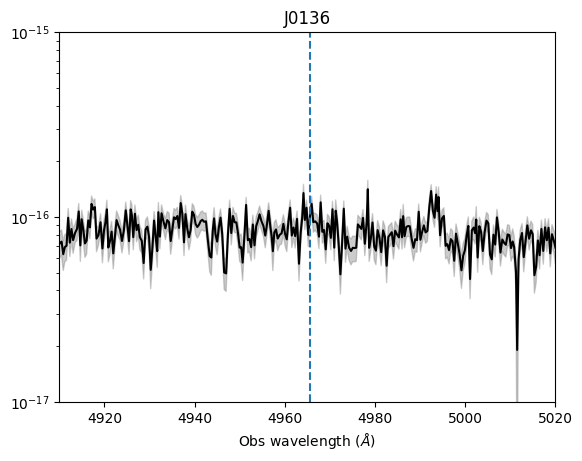

In [4]:
plt.plot(wave, flux, color='black')
plt.xlim(4910, 5020)
plt.ylim(1e-17, 1e-15)
plt.axvline((1 + z_BN[igal])*wave_cat['HeII4685'], ls='--')
plt.fill_between(wave, flux-err, flux+err, alpha=0.4, color='gray')
plt.yscale('log')
plt.title('J0136')
plt.xlabel('Obs wavelength ($\AA$)')
#plt.savefig('/home/benjamin/Documents/analogs/HeIIJ0136.pdf', bbox_inches='tight')

----

# Two component model fit for [OIII] 4959

In [5]:
wcal_blue.info()

Filename: /home/benjamin/Documents/pypeit19b/redux_J0136/blue/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SPAT_IDS      1 ImageHDU        26   (11,)   int64   
  2  SPAT_ID-323_WAVEFIT    1 BinTableHDU     40   1R x 6C   [43D, 43D, 43J, 2048D, 2048D, 45D]   
  3  SPAT_ID-323_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [43D, 43D, 1K, 43D, 5D, 43K]   
  4  SPAT_ID-408_WAVEFIT    1 BinTableHDU     40   1R x 6C   [41D, 41D, 41J, 2048D, 2048D, 46D]   
  5  SPAT_ID-408_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [41D, 41D, 1K, 41D, 5D, 41K]   
  6  SPAT_ID-485_WAVEFIT    1 BinTableHDU     40   1R x 6C   [49D, 49D, 49J, 2048D, 2048D, 50D]   
  7  SPAT_ID-485_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [49D, 49D, 1K, 49D, 5D, 49K]   
  8  SPAT_ID-557_WAVEFIT    1 BinTableHDU     40   1R x 6C   [60D, 60D, 60J, 2048D, 2048D, 60D]   
  9  SPAT_ID-557_PYPEITFIT    1

In [6]:
wcal_red.info()

Filename: /home/benjamin/Documents/pypeit19b/redux_J0136/red/magellan_mage_A/Calibrations/WaveCalib_A_0_DET01.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SPAT_IDS      1 ImageHDU        26   (8,)   int64   
  2  SPAT_ID-623_WAVEFIT    1 BinTableHDU     40   1R x 6C   [50D, 50D, 50J, 2048D, 2048D, 51D]   
  3  SPAT_ID-623_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [50D, 50D, 1K, 50D, 5D, 50K]   
  4  SPAT_ID-684_WAVEFIT    1 BinTableHDU     40   1R x 6C   [50D, 50D, 50J, 2048D, 2048D, 52D]   
  5  SPAT_ID-684_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [50D, 50D, 1K, 50D, 5D, 50K]   
  6  SPAT_ID-740_WAVEFIT    1 BinTableHDU     40   1R x 6C   [62D, 62D, 62J, 2048D, 2048D, 65D]   
  7  SPAT_ID-740_PYPEITFIT    1 BinTableHDU     36   1R x 6C   [62D, 62D, 1K, 62D, 5D, 62K]   
  8  SPAT_ID-793_WAVEFIT    1 BinTableHDU     40   1R x 6C   [69D, 69D, 69J, 2048D, 2048D, 71D]   
  9  SPAT_ID-793_PYPEITFIT    1 B

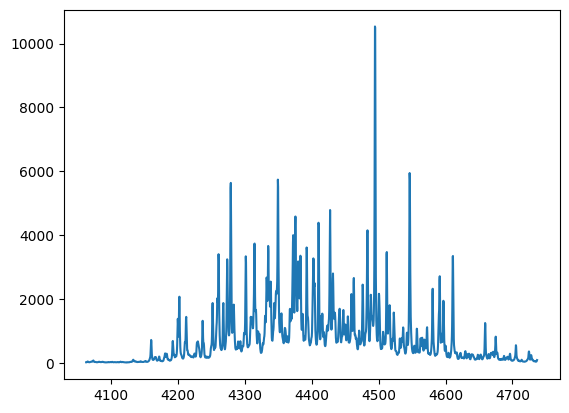

In [7]:
plt.plot(wcal_blue[8].data['wave_soln'][0], wcal_blue[25].data[:, 3])

# [OIII]4959

### Arc lines

In [8]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4959 = [wave_cat['[OIII]4959']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]4959']*(1 + z_BN[igal]) + 10]
mask_arc_4959 = (wcal_red[4].data['wave_soln'][0] >= wlims_4959[0]) & (wcal_red[4].data['wave_soln'][0] < wlims_4959[1])

# Arc spectra around the fitted line
x_arc_4959 = wcal_red[4].data['wave_soln'][0][mask_arc_4959]
y_arc_4959 = wcal_red[19].data[:, 1][mask_arc_4959]

100%|██████████████████████████████████████| 2500/2500 [00:15<00:00, 165.40it/s]


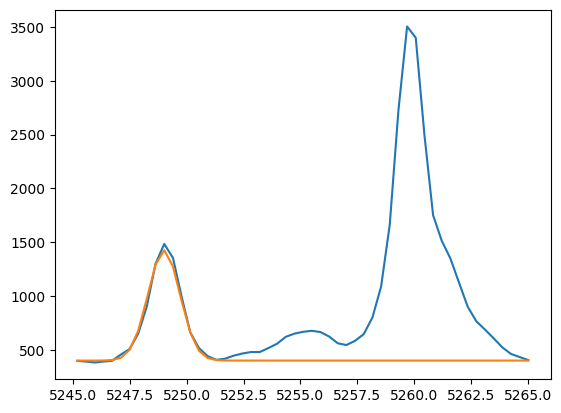

In [9]:
plt.plot(x_arc_4959, y_arc_4959)
plt.plot(x_arc_4959, 400 + gaussian(x_arc_4959, 1800, 5249, 0, 0.7))

params_arc_4959 = Parameters()
params_arc_4959.add('z', value=0.0, vary=False)
params_arc_4959.add('mu', value=5249, vary=False)
params_arc_4959.add('arc', value=1800, min=0.)
params_arc_4959.add('sigma', value=0.7, min=0.)
params_arc_4959.add('bkg', value=400, vary=False)

def residual_arc_4959(params_arc_4959, x, data, uncertainty):
    
    z = params_arc_4959['z']
    mu = params_arc_4959['mu']
    flux = params_arc_4959['arc']
    sigma = params_arc_4959['sigma']
    bkg = params_arc_4959['bkg']
    
    x = x_arc_4959
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_4959) / 10

np.random.seed(136)
out_arc_4959 = minimize(residual_arc_4959, params_arc_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

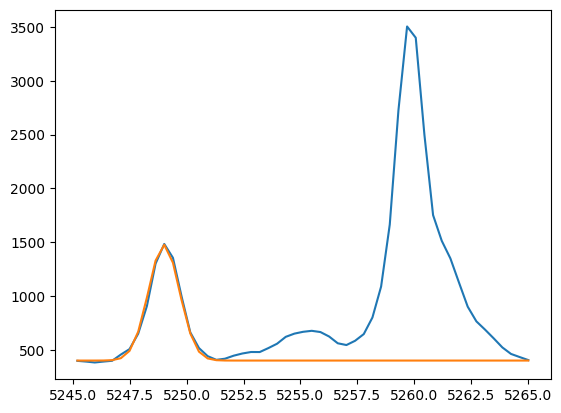

In [10]:
arc_4959 = out_arc_4959.flatchain.arc.mean()
sigma_arc_4959 = out_arc_4959.flatchain.sigma.mean()

plt.plot(x_arc_4959, y_arc_4959)

plt.plot(x_arc_4959, 400 + gaussian(x_arc_4959, arc_4959, 5249, 0, sigma_arc_4959))

### Line fitting

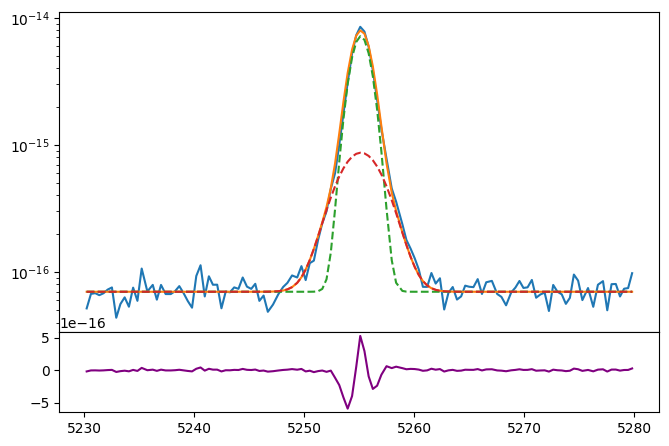

In [11]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4959.wavelength, oiii_4959.flux)
bkg = 7e-17

oiiib_nar = gaussian(oiii_4959.wavelength, 1600e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=0.9)
oiiib_brd = gaussian(oiii_4959.wavelength, 400e-17, wave_cat['[OIII]4959'], z=z_BN[igal], sigma=2.0)

ax.plot(oiii_4959.wavelength, bkg + oiiib_nar + oiiib_brd)
ax.plot(oiii_4959.wavelength, bkg + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_nar - oiiib_brd, color='purple')
ax.set_yscale('log')

In [12]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal])
params_oiii_4959.add('z_brd', value=z_BN[igal])
params_oiii_4959.add('sigma_nar', value=0.9, min=0.)
params_oiii_4959.add('sigma_brd', value=2.0, min=0.)
params_oiii_4959.add('Oiiib_nar', value=1600e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=400e-17, min=0.)
params_oiii_4959.add('bkg', value=7e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [13]:
np.random.seed(136)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 125.72it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 78.28637461  65.27530917 197.93638053 207.64619689 218.79873043
 219.56407049  56.95150384]


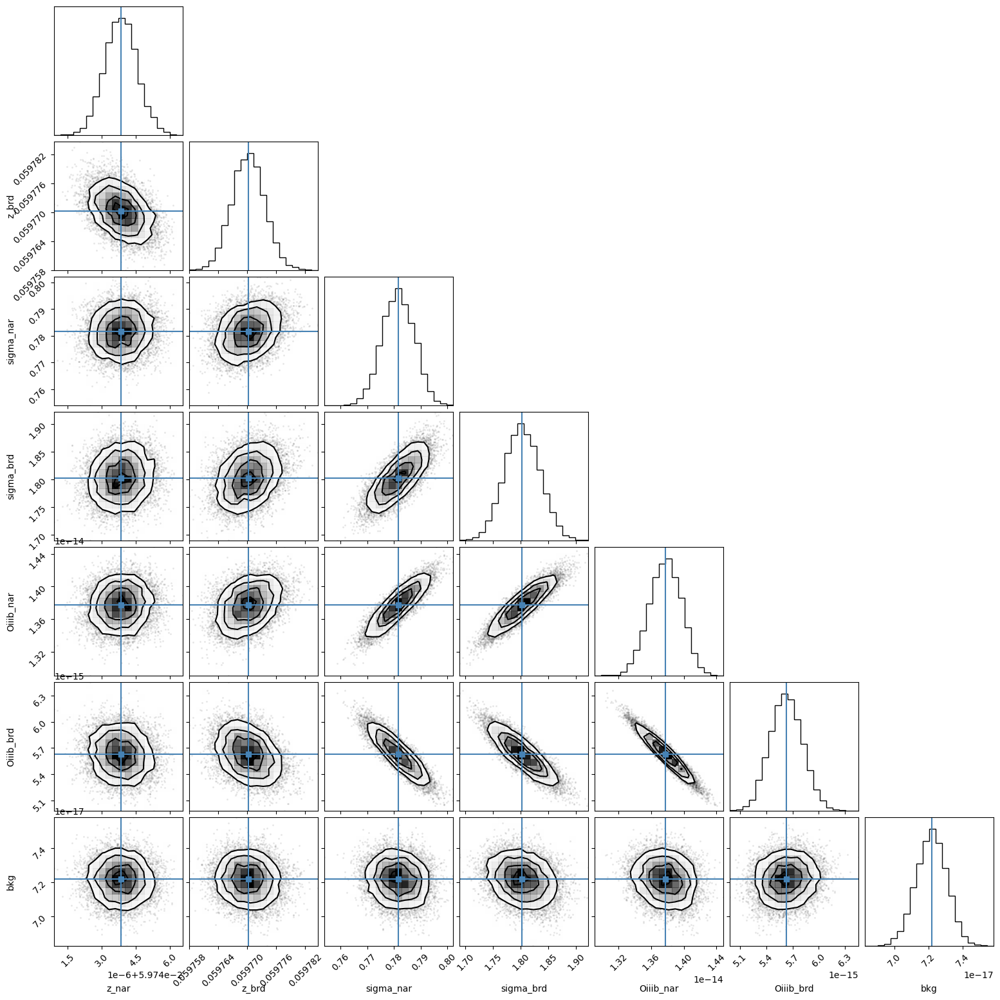

In [14]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig('/home/benjamin/Desktop/corner_oiiib.png')

In [15]:
out_oiii_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05974384,7.0637e-07,(0.00%),0.05974,-inf,inf,True
z_brd,0.05977019,3.3830e-06,(0.01%),0.05974,-inf,inf,True
sigma_nar,0.78158109,0.00606707,(0.78%),0.9,0.00000000,inf,True
sigma_brd,1.80241860,0.03211007,(1.78%),2.0,0.00000000,inf,True
Oiiib_nar,1.3778e-14,1.9803e-16,(1.44%),1.6e-14,0.00000000,inf,True
Oiiib_brd,5.6275e-15,1.8717e-16,(3.33%),4e-15,0.00000000,inf,True
bkg,7.2179e-17,9.1418e-19,(1.27%),7e-17,0.00000000,inf,True


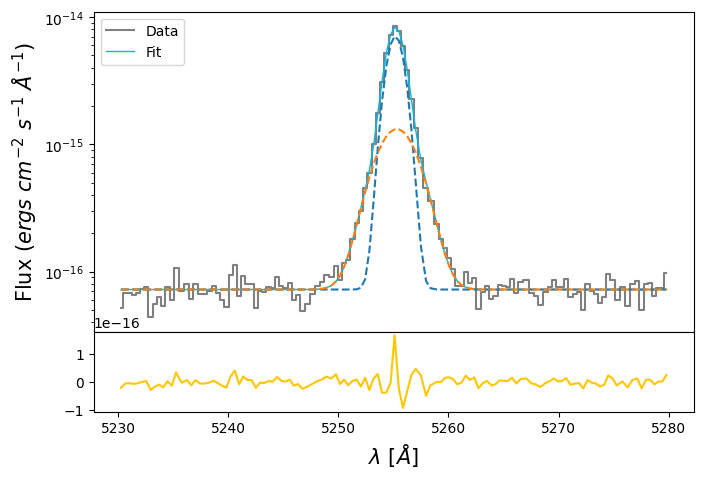

In [16]:
oiiib_nar_flux = out_oiii_4959.flatchain.Oiiib_nar.mean()
oiiib_nar_std = out_oiii_4959.flatchain.Oiiib_nar.std()

oiiib_brd_flux = out_oiii_4959.flatchain.Oiiib_brd.mean()
oiiib_brd_std = out_oiii_4959.flatchain.Oiiib_brd.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_nar_oiii_4959 = out_oiii_4959.flatchain.z_nar.mean()
z_nar_oiii_4959_std = out_oiii_4959.flatchain.z_nar.std()

z_brd_oiii_4959 = out_oiii_4959.flatchain.z_brd.mean()
z_brd_oiii_4959_std = out_oiii_4959.flatchain.z_brd.std()

sigma_nar_oiii_4959 = out_oiii_4959.flatchain.sigma_nar.mean()
sigma_nar_oiii_4959_std = out_oiii_4959.flatchain.sigma_nar.std()

sigma_brd_oiii_4959 = out_oiii_4959.flatchain.sigma_brd.mean()
sigma_brd_oiii_4959_std = out_oiii_4959.flatchain.sigma_brd.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')
plt.savefig('/home/benjamin/Desktop/fitresult_oiiib.png', bbox_inches='tight', facecolor='white')

In [17]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_nar_intrinsic = upy.sqrt((ufloat(sigma_nar_oiii_4959, sigma_nar_oiii_4959_std)**2) - (sigma_arc_4959**2))
sigma_brd_intrinsic = upy.sqrt((ufloat(sigma_brd_oiii_4959, sigma_brd_oiii_4959_std)**2) - (sigma_arc_4959**2)) 

In [18]:
# EW
EW_OIII_4959_nar = ufloat(oiiib_nar_flux, oiiib_nar_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959_brd = ufloat(oiiib_brd_flux, oiiib_brd_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959 = (ufloat(oiiib_nar_flux, oiiib_nar_std) + ufloat(oiiib_brd_flux, oiiib_brd_std)) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959_nar = FWHM(sigma_nar_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))
FWHM_4959_brd = FWHM(sigma_brd_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std)))

# velocity shift
dV_4959 = dV(ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std),
             ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std))

# Ratio to fix velocity shifts between components
z_ratio = z_brd_oiii_4959 / z_nar_oiii_4959

# Ratio to distribute the flux between components in no detection
brd_to_nar = oiiib_brd_flux / oiiib_nar_flux

# Dispersion for the whole spectra
dLam = (np.max(wave) - np.min(wave)) / len(wave)

In [19]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))

Redshift of the narrow component: 0.0597+/-0.0000


In [20]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_nar_oiii_4959,
       'dV': dV_4959.nominal_value,
       'dV_err': dV_4959.std_dev,
       'FWHM_nar': FWHM_4959_nar.nominal_value,
       'FWHM_nar_err': FWHM_4959_nar.std_dev,
       'FWHM_brd': FWHM_4959_brd.nominal_value,
       'FWHM_brd_err': FWHM_4959_brd.std_dev
}

vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J0136, overwriting...
Done.


---

# HeII 4686

### Arc lines

In [21]:
wave_cat['HeII4685']*(1 + z_BN[igal])

4965.6343154

In [22]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4685 = [wave_cat['HeII4685']*(1 + z_BN[igal]) - 2, wave_cat['HeII4685']*(1 + z_BN[igal]) + 10]
mask_arc_4685 = (wcal_red[2].data['wave_soln'][0] >= wlims_4685[0]) & (wcal_red[2].data['wave_soln'][0] < wlims_4685[1])

# Arc spectra around the fitted line
x_arc_4685 = wcal_red[2].data['wave_soln'][0][mask_arc_4685]
y_arc_4685 = wcal_red[19].data[:, 0][mask_arc_4685]

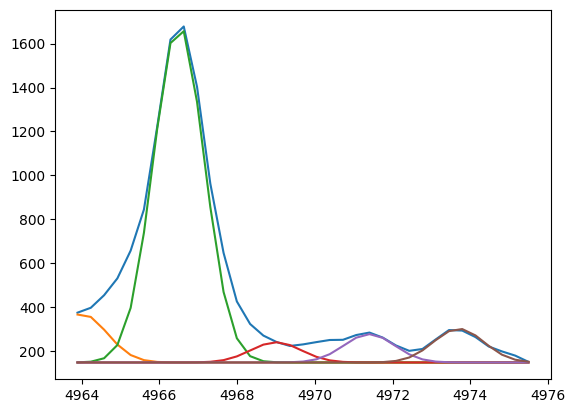

In [23]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 360, 4964, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 2500, 4966.5, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 150, 4969, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 210, 4971.4, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 250, 4973.7, 0, 0.65))

100%|███████████████████████████████████████| 2500/2500 [00:28<00:00, 86.40it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [112.7854229   38.60866859  64.04245061  76.87248468  47.83988025
  42.22939221]


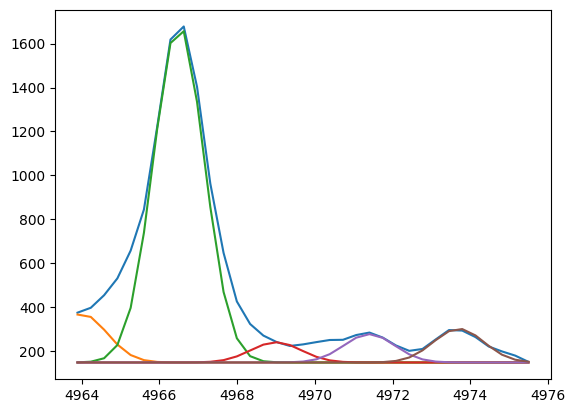

In [24]:
plt.plot(x_arc_4685, y_arc_4685)
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 360, 4964, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 2500, 4966.5, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 150, 4969, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 210, 4971.4, 0, 0.65))
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, 250, 4973.7, 0, 0.65))

params_arc_4685 = Parameters()
params_arc_4685.add('z', value=0.0, vary=False)
params_arc_4685.add('mu1', value=4964, vary=False)
params_arc_4685.add('mu2', value=4966.5, vary=False)
params_arc_4685.add('mu3', value=4969, vary=False)
params_arc_4685.add('mu4', value=4971.4, vary=False)
params_arc_4685.add('mu5', value=4973.7, vary=False)
params_arc_4685.add('arc1', value=360, min=0.)
params_arc_4685.add('arc2', value=2500, min=0.)
params_arc_4685.add('arc3', value=150, min=0.)
params_arc_4685.add('arc4', value=210, min=0.)
params_arc_4685.add('arc5', value=250, min=0.)
params_arc_4685.add('sigma', value=0.65, min=0.)
params_arc_4685.add('bkg', value=150, vary=False)

def residual_arc_4685(params_arc_4685, x, data, uncertainty):
    
    z = params_arc_4685['z']
    mu1 = params_arc_4685['mu1']
    mu2 = params_arc_4685['mu2']
    mu3 = params_arc_4685['mu3']
    mu4 = params_arc_4685['mu4']
    mu5 = params_arc_4685['mu5']
    flux1 = params_arc_4685['arc1']
    flux2 = params_arc_4685['arc2']
    flux3 = params_arc_4685['arc3']
    flux4 = params_arc_4685['arc4']
    flux5 = params_arc_4685['arc5']
    sigma = params_arc_4685['sigma']
    bkg = params_arc_4685['bkg']
    
    x = x_arc_4685
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_4685) / 10

np.random.seed(136)
out_arc_4685 = minimize(residual_arc_4685, params_arc_4685, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [25]:
out_arc_4685.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4964.00000,,,4964,-inf,inf,False
mu2,4966.50000,,,4966.5,-inf,inf,False
mu3,4969.00000,,,4969,-inf,inf,False
mu4,4971.40000,,,4971.4,-inf,inf,False
mu5,4973.70000,,,4973.7,-inf,inf,False
arc1,515.986729,11.9320832,(2.31%),360,0.00000000,inf,True
arc2,2844.12115,11.3371477,(0.40%),2500,0.00000000,inf,True
arc3,199.523077,9.80806755,(4.92%),150,0.00000000,inf,True
arc4,241.233683,9.75535644,(4.04%),210,0.00000000,inf,True


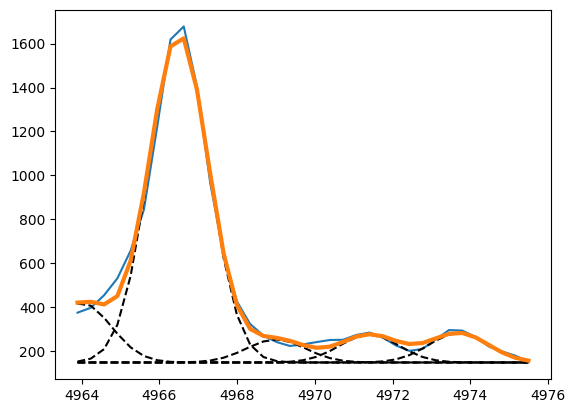

In [26]:
arc1_4685 = out_arc_4685.flatchain.arc1.mean()
arc2_4685 = out_arc_4685.flatchain.arc2.mean()
arc3_4685 = out_arc_4685.flatchain.arc3.mean()
arc4_4685 = out_arc_4685.flatchain.arc4.mean()
arc5_4685 = out_arc_4685.flatchain.arc5.mean()
sigma_arc_4685 = out_arc_4685.flatchain.sigma.mean()

plt.plot(x_arc_4685, y_arc_4685)

plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc1_4685, 4964, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc2_4685, 4966.5, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc3_4685, 4969, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc4_4685, 4971.4, 0, sigma_arc_4685), ls='--', color='black')
plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc5_4685, 4973.7, 0, sigma_arc_4685), ls='--', color='black')

plt.plot(x_arc_4685, 150 + gaussian(x_arc_4685, arc1_4685, 4964, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc2_4685, 4966.5, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc3_4685, 4969, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc4_4685, 4971.4, 0, sigma_arc_4685) \
         + gaussian(x_arc_4685, arc5_4685, 4973.7, 0, sigma_arc_4685), lw=3
)

### Line fitting

In [27]:
sigma_nar_4685 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4685**2))
sigma_brd_4685 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4685**2))

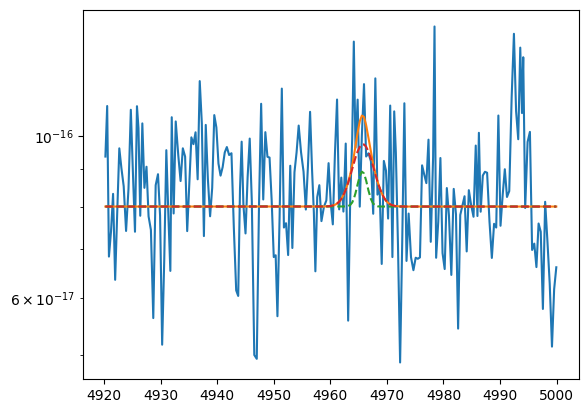

In [28]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 8e-17

heii4685_nar = gaussian(heii_4686.wavelength, 2e-17, wave_cat['HeII4685'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, 8e-17, wave_cat['HeII4685'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

plt.plot(heii_4686.wavelength, heii4685 + bkg)
plt.plot(heii_4686.wavelength, heii4685_nar + bkg, ls='--')
plt.plot(heii_4686.wavelength, heii4685_brd + bkg, ls='--')
plt.yscale('log')

In [29]:
params_4685 = Parameters()
params_4685.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4685.add('z_ratio', value=z_ratio, vary=False)
params_4685.add('sigma_heii4685_nar', value=upy.nominal_values(sigma_nar_4685), vary=False)
params_4685.add('sigma_heii4685_brd', value=upy.nominal_values(sigma_brd_4685), vary=False)
params_4685.add('Heii4685_nar', value=2e-17, min=0.)
params_4685.add('Heii4685_brd', value=8e-17, min=0.)
params_4685.add('bkg', value=8e-17, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_nar = params_4685['z_nar']
    z_brd = params_4685['z_nar'] * params_4685['z_ratio']
    sigma_heii4685_nar = params_4685['sigma_heii4685_nar']
    sigma_heii4685_brd = params_4685['sigma_heii4685_brd']
    heii4685_nar_flux = params_4685['Heii4685_nar']
    heii4685_brd_flux = params_4685['Heii4685_brd']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_nar_flux, wave_cat['HeII4685'], z_nar, sigma_heii4685_nar) + \
            gaussian(x, heii4685_brd_flux, wave_cat['HeII4685'], z_brd, sigma_heii4685_brd)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [30]:
np.random.seed(136)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:20<00:00, 123.62it/s]


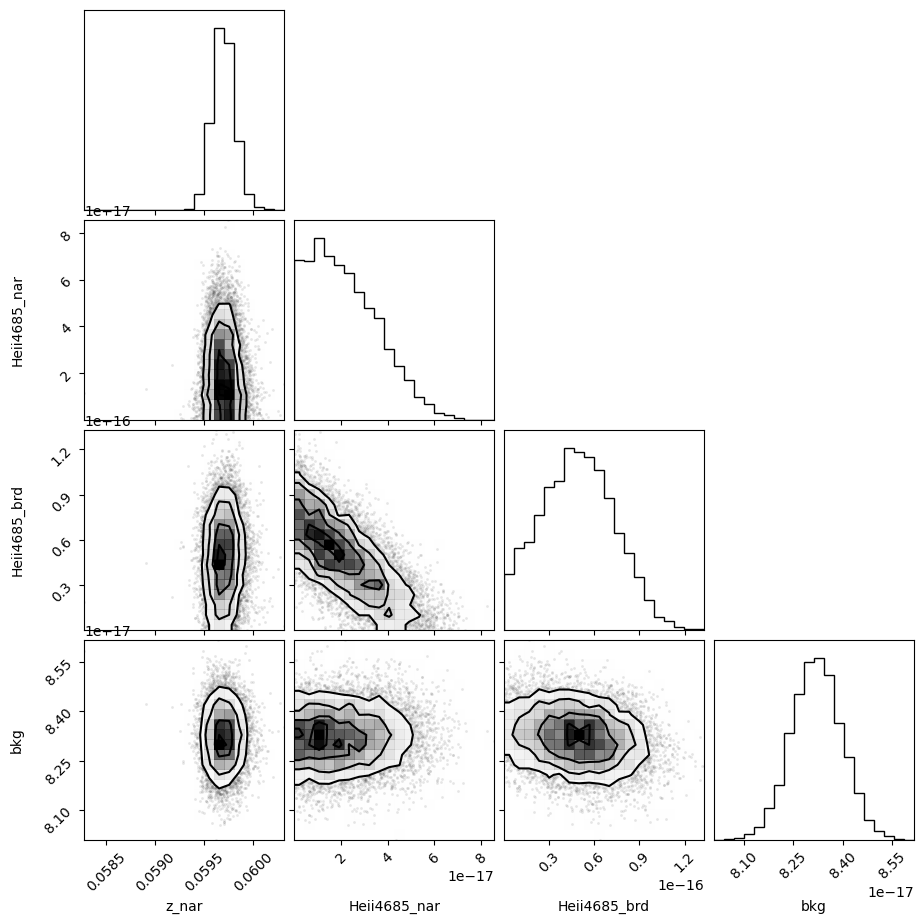

In [31]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

In [32]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05969789,1.1018e-04,(0.18%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_heii4685_nar,0.85241720,,,0.852417199900714,-inf,inf,False
sigma_heii4685_brd,1.83491447,,,1.8349144692848471,-inf,inf,False
Heii4685_nar,1.9827e-17,1.5425e-17,(77.80%),2e-17,0.00000000,inf,True
Heii4685_brd,4.8797e-17,2.5281e-17,(51.81%),8e-17,0.00000000,inf,True
bkg,8.3206e-17,7.6885e-19,(0.92%),8e-17,0.00000000,inf,True


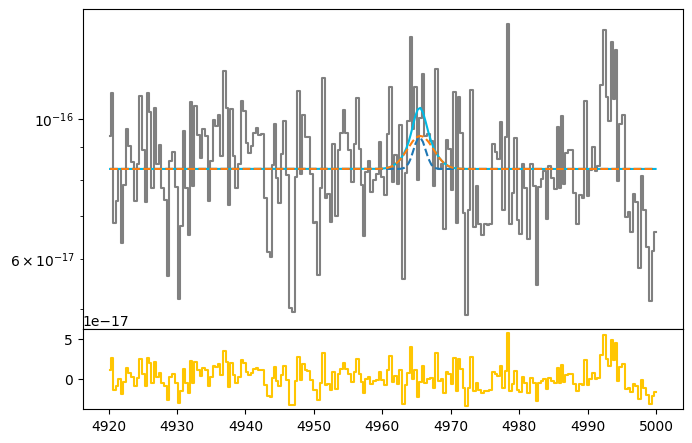

In [33]:
heii4685_nar_flux = out_heii4685.flatchain.Heii4685_nar.mean()
heii4685_nar_std = out_heii4685.flatchain.Heii4685_nar.std()

heii4685_brd_flux = out_heii4685.flatchain.Heii4685_brd.mean()
heii4685_brd_std = out_heii4685.flatchain.Heii4685_brd.std()

z_heii4685 = out_heii4685.flatchain.z_nar.mean()
z_heii4685_std = out_heii4685.flatchain.z_nar.std()

bkg_heii4685 = out_heii4685.flatchain.bkg.mean()
bkg_heii4685_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heii4685_nar = gaussian(heii_4686.wavelength, heii4685_nar_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, heii4685_brd_flux, wave_cat['HeII4685'], z_heii4685 * z_ratio, upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color=c[0])
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')

In [34]:
# EW
EW_heii4685_nar = ufloat(heii4685_nar_flux, heii4685_nar_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685_brd = ufloat(heii4685_brd_flux, heii4685_brd_std) / ufloat(bkg_heii4685, bkg_heii4685_std)
EW_heii4685 = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std)) / ufloat(bkg_heii4685, bkg_heii4685_std)

In [35]:
heii4685_tot_flux = (ufloat(heii4685_nar_flux, heii4685_nar_std) + ufloat(heii4685_brd_flux, heii4685_brd_std))
round(heii4685_tot_flux.nominal_value/heii4685_tot_flux.std_dev, 2)

2.52

# [NII]6548 + H$\alpha$ + [NII]6584

### Arc lines

In [36]:
wave_cat['Ha']*(1 + z_BN[igal])

6954.851074599999

In [37]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_ha = [wave_cat['Ha']*(1 + z_BN[igal]) - 30, wave_cat['Ha']*(1 + z_BN[igal]) + 3]
mask_arc_ha = (wcal_red[10].data['wave_soln'][0] >= wlims_ha[0]) & (wcal_red[10].data['wave_soln'][0] < wlims_ha[1])

# Arc spectra around the fitted line
x_arc_ha = wcal_red[10].data['wave_soln'][0][mask_arc_ha]
y_arc_ha = wcal_red[19].data[:, 4][mask_arc_ha]

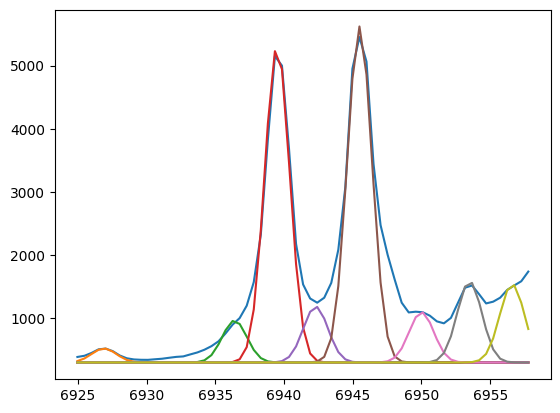

In [38]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 500, 6926.9, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 1500, 6936.4, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 11300, 6939.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2000, 6942.3, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 12000, 6945.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 1800, 6950, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2900, 6953.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2800, 6956.6, 0, 0.9))

100%|███████████████████████████████████████| 2500/2500 [00:46<00:00, 53.53it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [216.09238906 181.10878     32.00047004  43.19631334  62.53076474
  26.55785871  29.37829922 117.07276085  88.36861182]


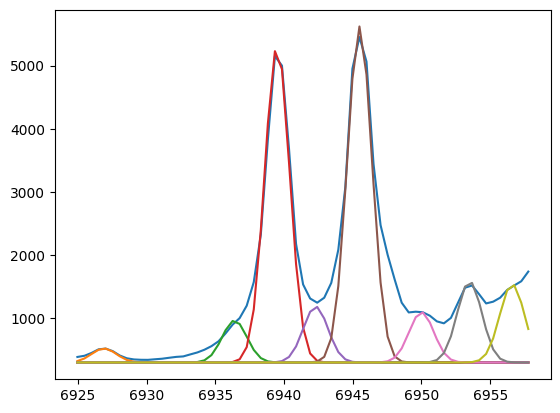

In [39]:
plt.plot(x_arc_ha, y_arc_ha)
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 500, 6926.9, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 1500, 6936.4, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 11300, 6939.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2000, 6942.3, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 12000, 6945.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 1800, 6950, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2900, 6953.5, 0, 0.9))
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, 2800, 6956.6, 0, 0.9))

params_arc_ha = Parameters()
params_arc_ha.add('z', value=0.0, vary=False)
params_arc_ha.add('mu1', value=6926.9, vary=False)
params_arc_ha.add('mu2', value=6936.4, vary=False)
params_arc_ha.add('mu3', value=6939.5, vary=False)
params_arc_ha.add('mu4', value=6942.3, vary=False)
params_arc_ha.add('mu5', value=6945.5, vary=False)
params_arc_ha.add('mu6', value=6950, vary=False)
params_arc_ha.add('mu7', value=6953.5, vary=False)
params_arc_ha.add('mu8', value=6956.6, vary=False)
params_arc_ha.add('arc1', value=500, min=0.)
params_arc_ha.add('arc2', value=1500, min=0.)
params_arc_ha.add('arc3', value=11300, min=0.)
params_arc_ha.add('arc4', value=2000, min=0.)
params_arc_ha.add('arc5', value=12000, min=0.)
params_arc_ha.add('arc6', value=1800, min=0.)
params_arc_ha.add('arc7', value=2900, min=0.)
params_arc_ha.add('arc8', value=2800, min=0.)
params_arc_ha.add('sigma', value=0.6, min=0.)
params_arc_ha.add('bkg', value=300, vary=False)

def residual_arc_ha(params_arc_ha, x, data, uncertainty):
    
    z = params_arc_ha['z']
    mu1 = params_arc_ha['mu1']
    mu2 = params_arc_ha['mu2']
    mu3 = params_arc_ha['mu3']
    mu4 = params_arc_ha['mu4']
    mu5 = params_arc_ha['mu5']
    mu6 = params_arc_ha['mu6']
    mu7 = params_arc_ha['mu7']
    mu8 = params_arc_ha['mu8']
    flux1 = params_arc_ha['arc1']
    flux2 = params_arc_ha['arc2']
    flux3 = params_arc_ha['arc3']
    flux4 = params_arc_ha['arc4']
    flux5 = params_arc_ha['arc5']
    flux6 = params_arc_ha['arc6']
    flux7 = params_arc_ha['arc7']
    flux8 = params_arc_ha['arc8']
    sigma = params_arc_ha['sigma']
    bkg = params_arc_ha['bkg']
    
    x = x_arc_ha
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model8 = gaussian(x, flux8, mu8, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7 + model8
    return (model - y_arc_ha) / 10

np.random.seed(136)
out_arc_ha = minimize(residual_arc_ha, params_arc_ha, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

In [40]:
out_arc_ha.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,6926.90000,,,6926.9,-inf,inf,False
mu2,6936.40000,,,6936.4,-inf,inf,False
mu3,6939.50000,,,6939.5,-inf,inf,False
mu4,6942.30000,,,6942.3,-inf,inf,False
mu5,6945.50000,,,6945.5,-inf,inf,False
mu6,6950.00000,,,6950,-inf,inf,False
mu7,6953.50000,,,6953.5,-inf,inf,False
mu8,6956.60000,,,6956.6,-inf,inf,False
arc1,602.744327,13.8940404,(2.31%),500,0.00000000,inf,True


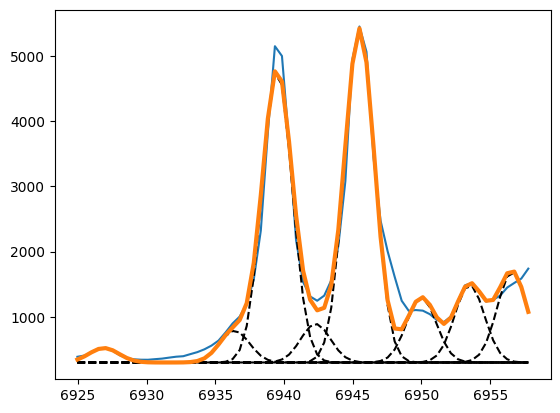

In [41]:
arc1_ha = out_arc_ha.flatchain.arc1.mean()
arc2_ha = out_arc_ha.flatchain.arc2.mean()
arc3_ha = out_arc_ha.flatchain.arc3.mean()
arc4_ha = out_arc_ha.flatchain.arc4.mean()
arc5_ha = out_arc_ha.flatchain.arc5.mean()
arc6_ha = out_arc_ha.flatchain.arc6.mean()
arc7_ha = out_arc_ha.flatchain.arc7.mean()
arc8_ha = out_arc_ha.flatchain.arc8.mean()
sigma_arc_ha = out_arc_ha.flatchain.sigma.mean()

plt.plot(x_arc_ha, y_arc_ha)

plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc1_ha, 6926.9, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc2_ha, 6936.4, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc3_ha, 6939.5, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc4_ha, 6942.3, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc5_ha, 6945.5, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc6_ha,   6950, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc7_ha, 6953.5, 0, sigma_arc_ha), ls='--', color='black')
plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc8_ha, 6956.6, 0, sigma_arc_ha), ls='--', color='black')

plt.plot(x_arc_ha, 300 + gaussian(x_arc_ha, arc1_ha, 6926.9, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc2_ha, 6936.4, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc3_ha, 6939.5, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc4_ha, 6942.3, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc5_ha, 6945.5, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc6_ha,   6950, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc7_ha, 6953.5, 0, sigma_arc_ha) \
                       + gaussian(x_arc_ha, arc8_ha, 6956.6, 0, sigma_arc_ha), lw=3
)

### Line fitting

In [42]:
sigma_nar_ha = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_ha**2))
sigma_brd_ha = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_ha**2))

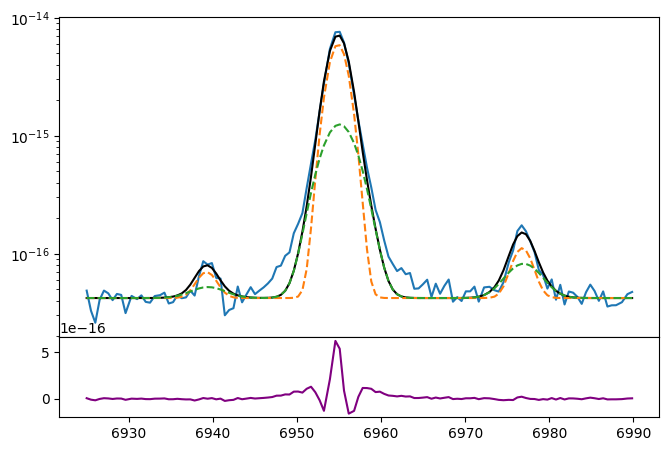

In [43]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 4.2e-17

ha_nar = gaussian(ha_nii.wavelength, 17e-15, wave_cat['Ha'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, 6e-15, wave_cat['Ha'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, 0.8e-16, wave_cat['[NII]6548'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, 0.5e-16, wave_cat['[NII]6548'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, 2e-16, wave_cat['[NII]6584'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, 2e-16, wave_cat['[NII]6584'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

ha = ha_nar + ha_brd
niib = niib_nar + niib_brd
niia = niia_nar + niia_brd

ax.plot(ha_nii.wavelength, bkg + niib + ha + niia, color='black')
ax.plot(ha_nii.wavelength, bkg + niib_nar + ha_nar + niia_nar, ls='--')
ax.plot(ha_nii.wavelength, bkg + niib_brd + ha_brd + niia_brd, ls='--')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib - ha - niia, color='purple')

#ax.axvline(7175)
#ax.axvline(7247)
ax.set_yscale('log')

In [44]:
params_ha_nii = Parameters()
params_ha_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ha_nii.add('z_ratio', value=z_ratio, vary=False)
params_ha_nii.add('sigma_6584_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6584_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_ha_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_ha_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('sigma_6548_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_6548_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('Ha_nar', value=1.7e-14, min=0.)
params_ha_nii.add('Ha_brd', value=0.6e-14, min=0.)
params_ha_nii.add('Niia_nar', value=0.2e-15, min=0.)
params_ha_nii.add('Niia_brd', value=0.2e-15, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=4.2e-17, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_nar = params_ha_nii['z_nar']
    z_brd = params_ha_nii['z_nar'] * params_ha_nii['z_ratio']
    sigma_6584_nar = params_ha_nii['sigma_6584_nar']
    sigma_6584_brd = params_ha_nii['sigma_6584_brd']
    sigma_ha_nar = params_ha_nii['sigma_ha_nar']
    sigma_ha_brd = params_ha_nii['sigma_ha_brd']
    sigma_6548_nar = params_ha_nii['sigma_6548_nar']
    sigma_6548_brd = params_ha_nii['sigma_6548_brd']
    ha_nar = params_ha_nii['Ha_nar']
    ha_brd = params_ha_nii['Ha_brd']
    niia_nar = params_ha_nii['Niia_nar']
    niia_brd = params_ha_nii['Niia_brd']
    niib_nar = params_ha_nii['Niia_nar']*params_ha_nii['Niib_to_niia']
    niib_brd = params_ha_nii['Niia_brd']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_nar, wave_cat['Ha'], z_nar, sigma_ha_nar) \
             + gaussian(x, ha_brd, wave_cat['Ha'], z_brd, sigma_ha_brd)
    
    model_niia = gaussian(x, niia_nar, wave_cat['[NII]6584'], z_nar, sigma_6584_nar) \
               + gaussian(x, niia_brd, wave_cat['[NII]6584'], z_brd, sigma_6584_brd)
    
    model_niib = gaussian(x, niib_nar, wave_cat['[NII]6548'], z_nar, sigma_6548_nar) \
               + gaussian(x, niib_brd, wave_cat['[NII]6548'], z_brd, sigma_6548_brd)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [45]:
np.random.seed(136)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:49<00:00, 50.96it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 55.99887663  67.75556825  74.51227665 142.96187373 151.9381999
  71.71828881 110.60257754]


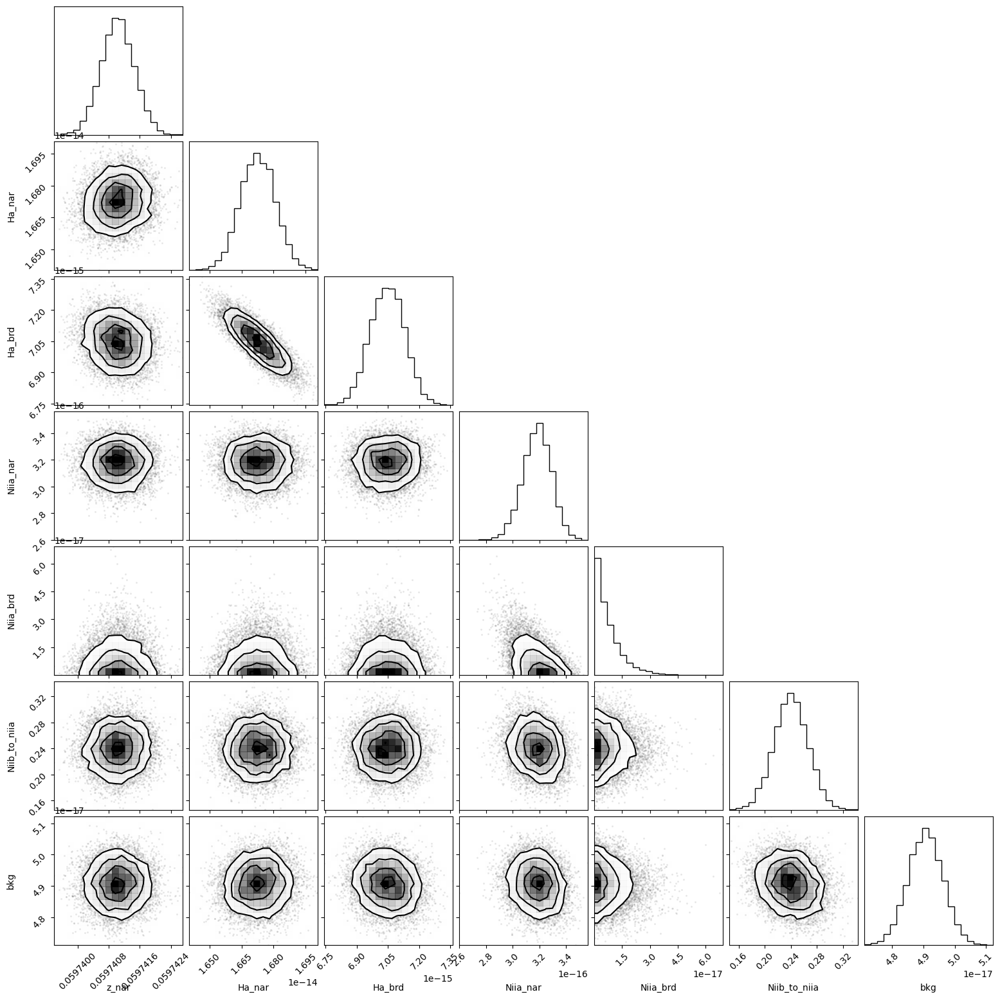

In [46]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [47]:
out_ha_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05974103,4.3170e-07,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_6584_nar,1.15145252,,,1.1514525150502515,-inf,inf,False
sigma_6584_brd,1.99151674,,,1.9915167389002453,-inf,inf,False
sigma_ha_nar,1.15145252,,,1.1514525150502515,-inf,inf,False
sigma_ha_brd,1.99151674,,,1.9915167389002453,-inf,inf,False
sigma_6548_nar,1.15145252,,,1.1514525150502515,-inf,inf,False
sigma_6548_brd,1.99151674,,,1.9915167389002453,-inf,inf,False
Ha_nar,1.6726e-14,8.1467e-17,(0.49%),1.7e-14,0.00000000,inf,True
Ha_brd,7.0478e-15,8.2981e-17,(1.18%),6e-15,0.00000000,inf,True


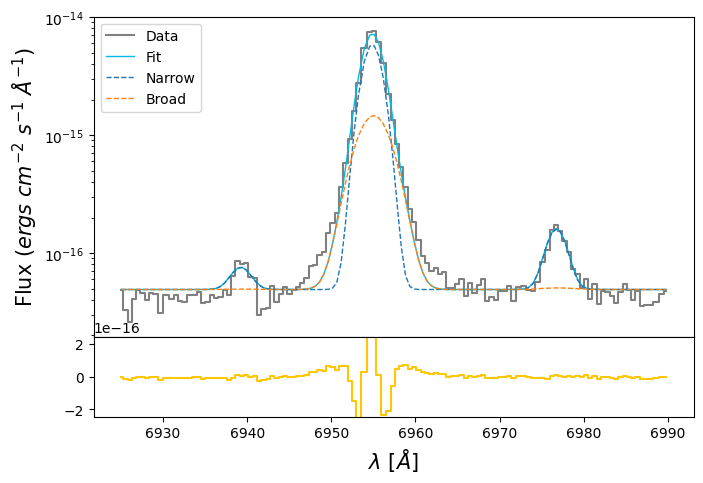

In [48]:
ha_nar_flux = out_ha_nii.flatchain.Ha_nar.mean()
ha_nar_std = out_ha_nii.flatchain.Ha_nar.std()

ha_brd_flux = out_ha_nii.flatchain.Ha_brd.mean()
ha_brd_std = out_ha_nii.flatchain.Ha_brd.std()

niia_nar_flux = out_ha_nii.flatchain.Niia_nar.mean()
niia_nar_std = out_ha_nii.flatchain.Niia_nar.std()

niia_brd_flux = out_ha_nii.flatchain.Niia_brd.mean()
niia_brd_std = out_ha_nii.flatchain.Niia_brd.std()

niib_nar_flux = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_nar_std = (niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia).std()

niib_brd_flux = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_brd_std = (niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia).std()

z_ha_nii = out_ha_nii.flatchain.z_nar.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_nar.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha_nar = gaussian(ha_nii.wavelength, ha_nar_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, ha_brd_flux, wave_cat['Ha'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, niia_nar_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, niia_brd_flux, wave_cat['[NII]6584'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, niib_nar_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, niib_brd_flux, wave_cat['[NII]6548'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia = niia_nar + niia_brd
ha = ha_nar + ha_brd
niib = niib_nar + niib_brd

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_nar + ha_nar + niib_nar,
        ls='--', lw=1, label='Narrow')
ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_brd + ha_brd + niib_brd,
        ls='--', lw=1, label='Broad')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
ax1.set_ylim(-5*bkg_ha_nii, 5*bkg_ha_nii)
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [49]:
# EW
EW_Ha_nar = ufloat(ha_nar_flux, ha_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha_brd = ufloat(ha_brd_flux, ha_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha = (ufloat(ha_nar_flux, ha_nar_std) + ufloat(ha_brd_flux, ha_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6584_nar = ufloat(niia_nar_flux, niia_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584_brd = ufloat(niia_brd_flux, niia_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = (ufloat(niia_nar_flux, niia_nar_std) + ufloat(niia_brd_flux, niia_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6548_nar = ufloat(niib_nar_flux, niib_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548_brd = ufloat(niib_brd_flux, niib_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = (ufloat(niib_nar_flux, niib_nar_std) + ufloat(niib_brd_flux, niib_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

### Arc lines

In [50]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_7330 = [wave_cat['[OII]7330']*(1 + z_BN[igal]) - 10, wave_cat['[OII]7330']*(1 + z_BN[igal]) + 30]
mask_arc_7330 = (wcal_red[12].data['wave_soln'][0] >= wlims_7330[0]) & (wcal_red[12].data['wave_soln'][0] < wlims_7330[1])

# Arc spectra around the fitted line
x_arc_7330 = wcal_red[12].data['wave_soln'][0][mask_arc_7330]
y_arc_7330 = wcal_red[19].data[:, 5][mask_arc_7330]

100%|███████████████████████████████████████| 2500/2500 [00:49<00:00, 50.95it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [49.30060519 47.43928239 55.25148294 48.55598858 49.38616813]


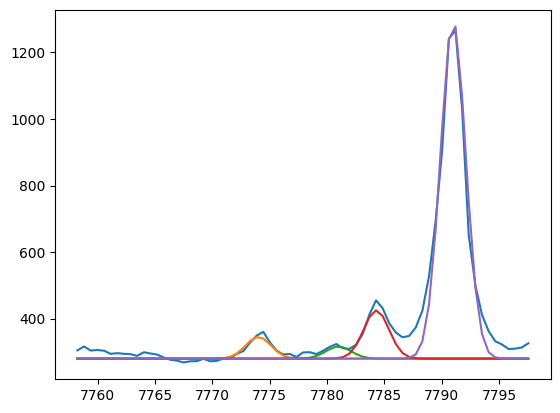

In [51]:
plt.plot(x_arc_7330, y_arc_7330)
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, 180, 7774, 0, 1.1))
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, 100, 7781, 0, 1.1))
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, 400, 7784.3, 0, 1.1))
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, 2800, 7791, 0, 1.1))

params_arc_7330 = Parameters()
params_arc_7330.add('z', value=0.0, vary=False)
params_arc_7330.add('mu1', value=7774, vary=False)
params_arc_7330.add('mu2', value=7781, vary=False)
params_arc_7330.add('mu3', value=7784.3, vary=False)
params_arc_7330.add('mu4', value=7791, vary=False)
params_arc_7330.add('arc1', value=180, min=0.)
params_arc_7330.add('arc2', value=100, min=0.)
params_arc_7330.add('arc3', value=400, min=0.)
params_arc_7330.add('arc4', value=2800, min=0.)
params_arc_7330.add('sigma', value=1.1, min=0.)
params_arc_7330.add('bkg', value=280, vary=False)

def residual_arc_7330(params_arc_7330, x, data, uncertainty):
    
    z = params_arc_7330['z']
    mu1 = params_arc_7330['mu1']
    mu2 = params_arc_7330['mu2']
    mu3 = params_arc_7330['mu3']
    mu4 = params_arc_7330['mu4']
    flux1 = params_arc_7330['arc1']
    flux2 = params_arc_7330['arc2']
    flux3 = params_arc_7330['arc3']
    flux4 = params_arc_7330['arc4']
    sigma = params_arc_7330['sigma']
    bkg = params_arc_7330['bkg']
    
    x = x_arc_7330
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model = bkg + model1 + model2 + model3 + model4
    return (model - y_arc_7330) / 10

np.random.seed(136)
out_arc_7330 = minimize(residual_arc_7330, params_arc_7330, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

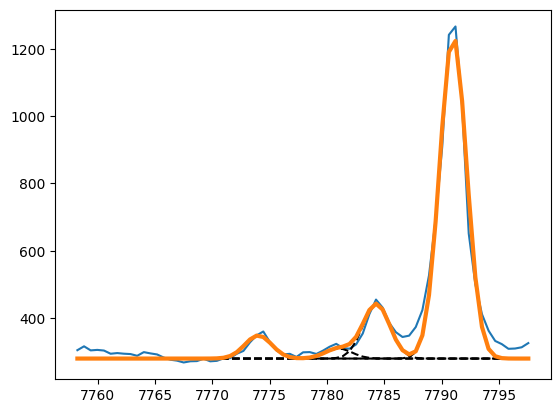

In [52]:
arc1_7330 = out_arc_7330.flatchain.arc1.mean()
arc2_7330 = out_arc_7330.flatchain.arc2.mean()
arc3_7330 = out_arc_7330.flatchain.arc3.mean()
arc4_7330 = out_arc_7330.flatchain.arc4.mean()
sigma_arc_7330 = out_arc_7330.flatchain.sigma.mean()

plt.plot(x_arc_7330, y_arc_7330)
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, arc1_7330, 7774, 0, sigma_arc_7330), color='black', ls='--')
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, arc2_7330, 7781, 0, sigma_arc_7330), color='black', ls='--')
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, arc3_7330, 7784.3, 0, sigma_arc_7330), color='black', ls='--')
plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, arc4_7330, 7791, 0, sigma_arc_7330), color='black', ls='--')

plt.plot(x_arc_7330, 280 + gaussian(x_arc_7330, arc1_7330, 7774, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc2_7330, 7781, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc3_7330, 7784.3, 0, sigma_arc_7330) \
         + gaussian(x_arc_7330, arc4_7330, 7791, 0, sigma_arc_7330), lw=3
)

### Line fitting

In [53]:
sigma_nar_7330 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_7330**2))
sigma_brd_7330 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7330**2))

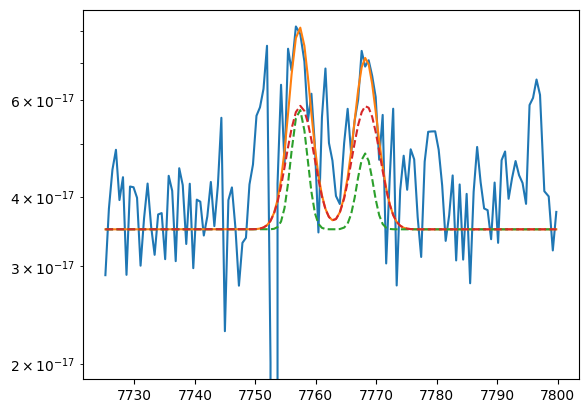

In [54]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

oiia_nar = gaussian(oii_7320.wavelength, 0.4e-16, wave_cat['[OII]7330'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiia_brd = gaussian(oii_7320.wavelength, 1.2e-16, wave_cat['[OII]7330'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiib_nar = gaussian(oii_7320.wavelength, 0.7e-16, wave_cat['[OII]7319'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiib_brd = gaussian(oii_7320.wavelength, 1.2e-16, wave_cat['[OII]7319'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd
bkg = 3.5e-17

plt.plot(oii_7320.wavelength, bkg + oiib + oiia)
plt.plot(oii_7320.wavelength, bkg + oiib_nar + oiia_nar, ls='--')
plt.plot(oii_7320.wavelength, bkg + oiib_brd + oiia_brd, ls='--')

plt.yscale('log')

In [55]:
params_oii_7320 = Parameters()

params_oii_7320.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_7320.add('z_ratio', value=z_ratio, vary=False)
params_oii_7320.add('sigma_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('Oiia_nar', value=0.4e-16, min=0.)
params_oii_7320.add('Oiia_brd', value=1.2e-16, min=0.)
params_oii_7320.add('Oiib_nar', value=0.7e-16, min=0.)
params_oii_7320.add('Oiib_brd', value=1.2e-16, min=0.)
params_oii_7320.add('bkg', value=3.5e-17, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_nar = params_oii_7320['z_nar']
    z_brd = params_oii_7320['z_nar'] * params_oii_7320['z_ratio']
    sigma_nar = params_oii_7320['sigma_nar']
    sigma_brd = params_oii_7320['sigma_brd']
    oiia_nar_flux = params_oii_7320['Oiia_nar']
    oiia_brd_flux = params_oii_7320['Oiia_brd']
    oiib_nar_flux = params_oii_7320['Oiib_nar']
    oiib_brd_flux = params_oii_7320['Oiib_brd']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_nar_flux, wave_cat['[OII]7330'], z_nar, sigma_nar) + \
                 gaussian(x, oiia_brd_flux, wave_cat['[OII]7330'], z_brd, sigma_brd)
    model_oiib = gaussian(x, oiib_nar_flux, wave_cat['[OII]7319'], z_nar, sigma_nar) + \
                 gaussian(x, oiib_brd_flux, wave_cat['[OII]7319'], z_brd, sigma_brd)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [56]:
np.random.seed(136)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:46<00:00, 53.53it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.05103712 62.18474202 60.41820984 56.95567771 57.35446613 62.24526203]


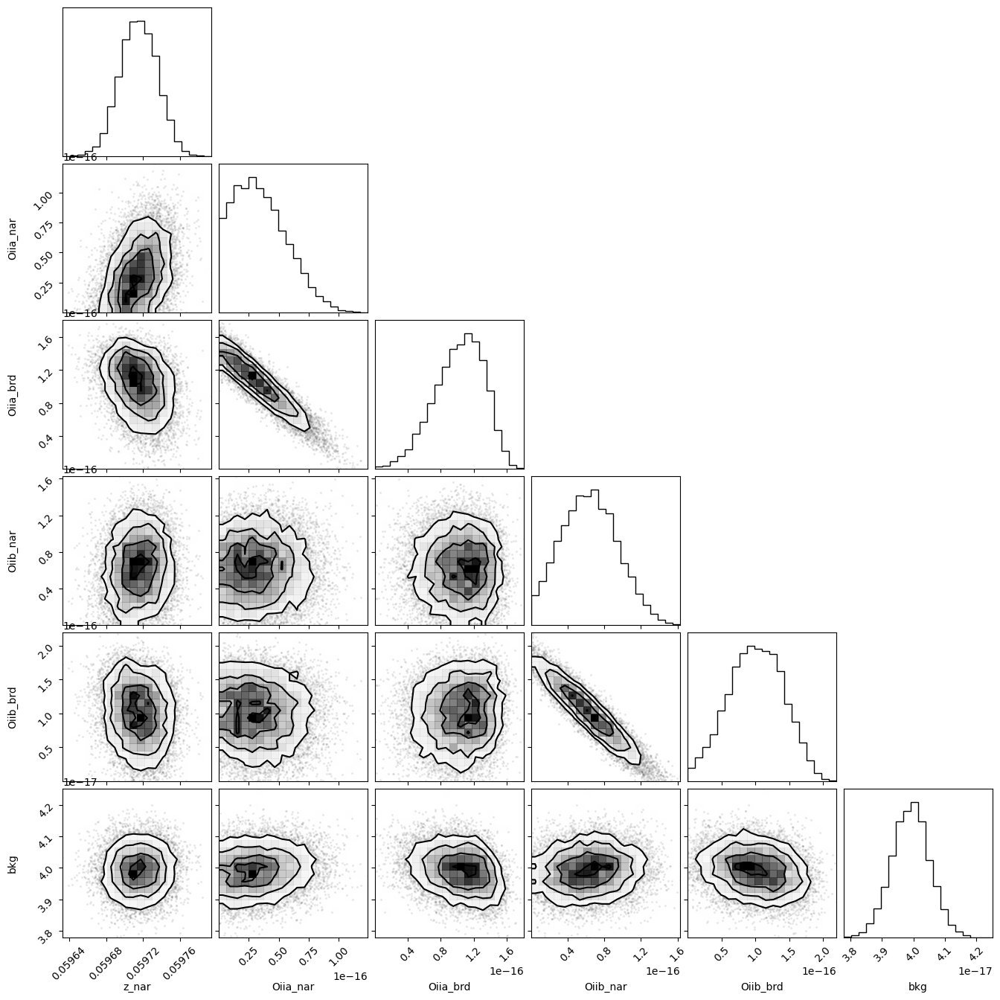

In [57]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_oii_7330.png')

In [58]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05971506,2.0204e-05,(0.03%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,1.22994773,,,1.2299477265059249,-inf,inf,False
sigma_brd,2.03790761,,,2.037907612440125,-inf,inf,False
Oiia_nar,3.2578e-17,2.3256e-17,(71.39%),4e-17,0.00000000,inf,True
Oiia_brd,1.0459e-16,3.0475e-17,(29.14%),1.2e-16,0.00000000,inf,True
Oiib_nar,6.2795e-17,3.1564e-17,(50.27%),7e-17,0.00000000,inf,True
Oiib_brd,1.0089e-16,4.1629e-17,(41.26%),1.2e-16,0.00000000,inf,True
bkg,3.9923e-17,5.9352e-19,(1.49%),3.5e-17,0.00000000,inf,True


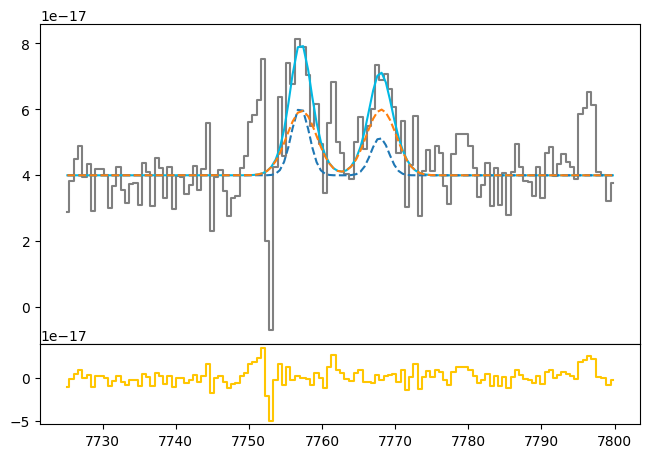

In [59]:
oiia_nar_flux = out_oii_7320.flatchain.Oiia_nar.mean()
oiia_nar_std = out_oii_7320.flatchain.Oiia_nar.std()

oiia_brd_flux = out_oii_7320.flatchain.Oiia_brd.mean()
oiia_brd_std = out_oii_7320.flatchain.Oiia_brd.std()

oiib_nar_flux = out_oii_7320.flatchain.Oiib_nar.mean()
oiib_nar_std = out_oii_7320.flatchain.Oiib_nar.std()

oiib_brd_flux = out_oii_7320.flatchain.Oiib_brd.mean()
oiib_brd_std = out_oii_7320.flatchain.Oiib_brd.std()

z_oii_7320 = out_oii_7320.flatchain.z_nar.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_nar.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_nar + oiib_nar, ls='--')
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_brd + oiib_brd, ls='--')
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

#ls_oiib = (wave_cat['[OII]7319'] * (1 + z_oii_7320)) + (3 * sigma_brd_oiii_4959)
#li_oiib = (wave_cat['[OII]7319'] * (1 + z_oii_7320)) - (3 * sigma_brd_oiii_4959)

#ls_oiia = (wave_cat['[OII]7330'] * (1 + z_oii_7320)) + (3 * sigma_brd_oiii_4959)
#li_oiia = (wave_cat['[OII]7330'] * (1 + z_oii_7320)) - (3 * sigma_brd_oiii_4959)

#ax.axvline(ls_oiib, ls='--', color='gray', lw=0.8)
#ax.axvline(li_oiib, ls='--', color='gray', lw=0.8)

#ax.axvline(ls_oiia, ls='--', color='gray', lw=0.8)
#ax.axvline(li_oiia, ls='--', color='gray', lw=0.8)
plt.savefig('/home/benjamin/Desktop/fitresult_oii_7330.png', facecolor='white', bbox_inches='tight')

In [60]:
# EW
EW_OII_7330_nar = ufloat(oiia_nar_flux, oiia_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330_brd = ufloat(oiia_brd_flux, oiia_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330 = (ufloat(oiia_nar_flux, oiia_nar_std) + ufloat(oiia_brd_flux, oiia_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

EW_OII_7319_nar = ufloat(oiib_nar_flux, oiib_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319_brd = ufloat(oiib_brd_flux, oiib_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = (ufloat(oiib_nar_flux, oiib_nar_std) + ufloat(oiib_brd_flux, oiib_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# [SII]6716 + [SII]6730

### Arc lines

In [61]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6730 = [wave_cat['[SII]6730']*(1 + z_BN[igal]) - 10, wave_cat['[SII]6730']*(1 + z_BN[igal]) + 5]
mask_arc_6730 = (wcal_red[10].data['wave_soln'][0] >= wlims_6730[0]) & (wcal_red[10].data['wave_soln'][0] < wlims_6730[1])

# Arc spectra around the fitted line
x_arc_6730 = wcal_red[10].data['wave_soln'][0][mask_arc_6730]
y_arc_6730 = wcal_red[19].data[:, 4][mask_arc_6730]

100%|███████████████████████████████████████| 2500/2500 [01:04<00:00, 38.87it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [113.48868939  52.77939998  67.30859796  55.1447072   55.36055828
  24.70065208]


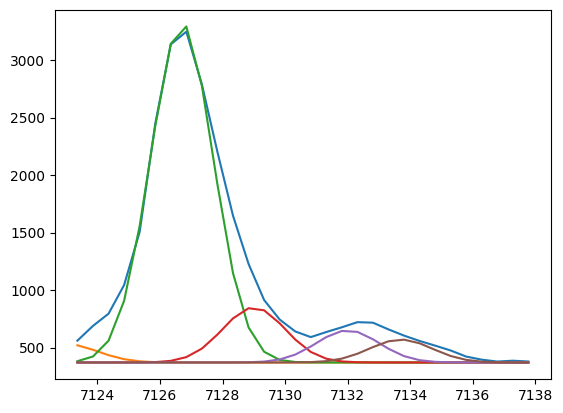

In [62]:
plt.plot(x_arc_6730, y_arc_6730)
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730,  400, 7123, 0, 1.0))
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, 7400, 7126.7, 0, 1.0))
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, 1200, 7129, 0, 1.0))
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730,  700, 7132, 0, 1.0))
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730,  500, 7133.7, 0, 1.0))

params_arc_6730 = Parameters()
params_arc_6730.add('z', value=0.0, vary=False)
params_arc_6730.add('mu1', value=7123, vary=False)
params_arc_6730.add('mu2', value=7126.7, vary=False)
params_arc_6730.add('mu3', value=7129, vary=False)
params_arc_6730.add('mu4', value=7132, vary=False)
params_arc_6730.add('mu5', value=7133.7, vary=False)
params_arc_6730.add('arc1', value=400, min=0.)
params_arc_6730.add('arc2', value=7400, min=0.)
params_arc_6730.add('arc3', value=1200, min=0.)
params_arc_6730.add('arc4', value=700, min=0.)
params_arc_6730.add('arc5', value=500, min=0.)
params_arc_6730.add('sigma', value=1.0, min=0.)
params_arc_6730.add('bkg', value=370, vary=False)

def residual_arc_6730(params_arc_6730, x, data, uncertainty):
    
    z = params_arc_6730['z']
    mu1 = params_arc_6730['mu1']
    mu2 = params_arc_6730['mu2']
    mu3 = params_arc_6730['mu3']
    mu4 = params_arc_6730['mu4']
    mu5 = params_arc_6730['mu5']
    flux1 = params_arc_6730['arc1']
    flux2 = params_arc_6730['arc2']
    flux3 = params_arc_6730['arc3']
    flux4 = params_arc_6730['arc4']
    flux5 = params_arc_6730['arc5']
    sigma = params_arc_6730['sigma']
    bkg = params_arc_6730['bkg']
    
    x = x_arc_6730
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_6730) / 10

np.random.seed(136)
out_arc_6730 = minimize(residual_arc_6730, params_arc_6730, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

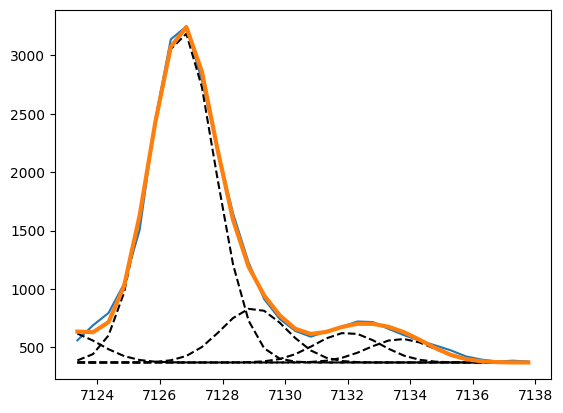

In [63]:
arc1_6730 = out_arc_6730.flatchain.arc1.mean()
arc2_6730 = out_arc_6730.flatchain.arc2.mean()
arc3_6730 = out_arc_6730.flatchain.arc3.mean()
arc4_6730 = out_arc_6730.flatchain.arc4.mean()
arc5_6730 = out_arc_6730.flatchain.arc5.mean()
sigma_arc_6730 = out_arc_6730.flatchain.sigma.mean()

plt.plot(x_arc_6730, y_arc_6730)
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc1_6730, 7123, 0, sigma_arc_6730), color='black', ls='--')
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc2_6730, 7126.7, 0, sigma_arc_6730), color='black', ls='--')
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc3_6730, 7129, 0, sigma_arc_6730), color='black', ls='--')
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc4_6730, 7132, 0, sigma_arc_6730), color='black', ls='--')
plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc5_6730, 7133.7, 0, sigma_arc_6730), color='black', ls='--')

plt.plot(x_arc_6730, 370 + gaussian(x_arc_6730, arc1_6730, 7123, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc2_6730, 7126.7, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc3_6730, 7129, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc4_6730, 7132, 0, sigma_arc_6730) \
         + gaussian(x_arc_6730, arc5_6730, 7133.7, 0, sigma_arc_6730), lw=3
)

### Line fitting

In [64]:
sigma_nar_6730 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6730**2))
sigma_brd_6730 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6730**2))

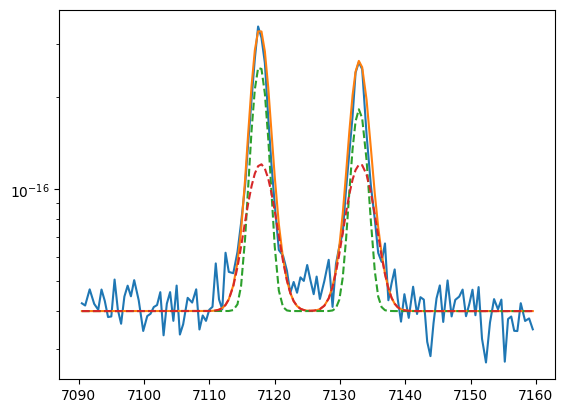

In [65]:
plt.plot(sii.wavelength, sii.flux)
bkg = 4e-17

siia_nar = gaussian(sii.wavelength, 4e-16, wave_cat['[SII]6730'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siia_brd = gaussian(sii.wavelength, 4e-16, wave_cat['[SII]6730'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siib_nar = gaussian(sii.wavelength, 6e-16, wave_cat['[SII]6716'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siib_brd = gaussian(sii.wavelength, 4e-16, wave_cat['[SII]6716'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

plt.plot(sii.wavelength, siia + siib + bkg)
plt.plot(sii.wavelength, siia_nar + siib_nar + bkg, ls='--')
plt.plot(sii.wavelength, siia_brd + siib_brd + bkg, ls='--')
plt.yscale('log')

In [66]:
params_sii = Parameters()
params_sii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_sii.add('z_ratio', value=z_ratio, vary=False)
params_sii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('Siia_nar', value=4.0e-16, min=0.)
params_sii.add('Siia_brd', value=4.0e-16, min=0.)
params_sii.add('Siib_nar', value=6.0e-16, min=0.)
params_sii.add('Siib_brd', value=4.0e-16, min=0.)
params_sii.add('bkg', value=4e-17, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_nar = params_sii['z_nar']
    z_brd = params_sii['z_nar'] * params_sii['z_ratio']
    sigma_nar = params_sii['sigma_nar']
    sigma_brd = params_sii['sigma_brd']
    siia_nar_flux = params_sii['Siia_nar']
    siia_brd_flux = params_sii['Siia_brd']
    siib_nar_flux = params_sii['Siib_nar']
    siib_brd_flux = params_sii['Siib_brd']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_nar_flux, wave_cat['[SII]6730'], z_nar, sigma_nar) + \
                 gaussian(x, siia_brd_flux, wave_cat['[SII]6730'], z_brd, sigma_brd)
    model_siib = gaussian(x, siib_nar_flux, wave_cat['[SII]6716'], z_nar, sigma_nar) + \
                 gaussian(x, siib_brd_flux, wave_cat['[SII]6716'], z_brd, sigma_brd)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [67]:
np.random.seed(136)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:11<00:00, 34.73it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [49.72010439 64.494799   86.39149545 64.39237285 79.88871188 80.28359241]


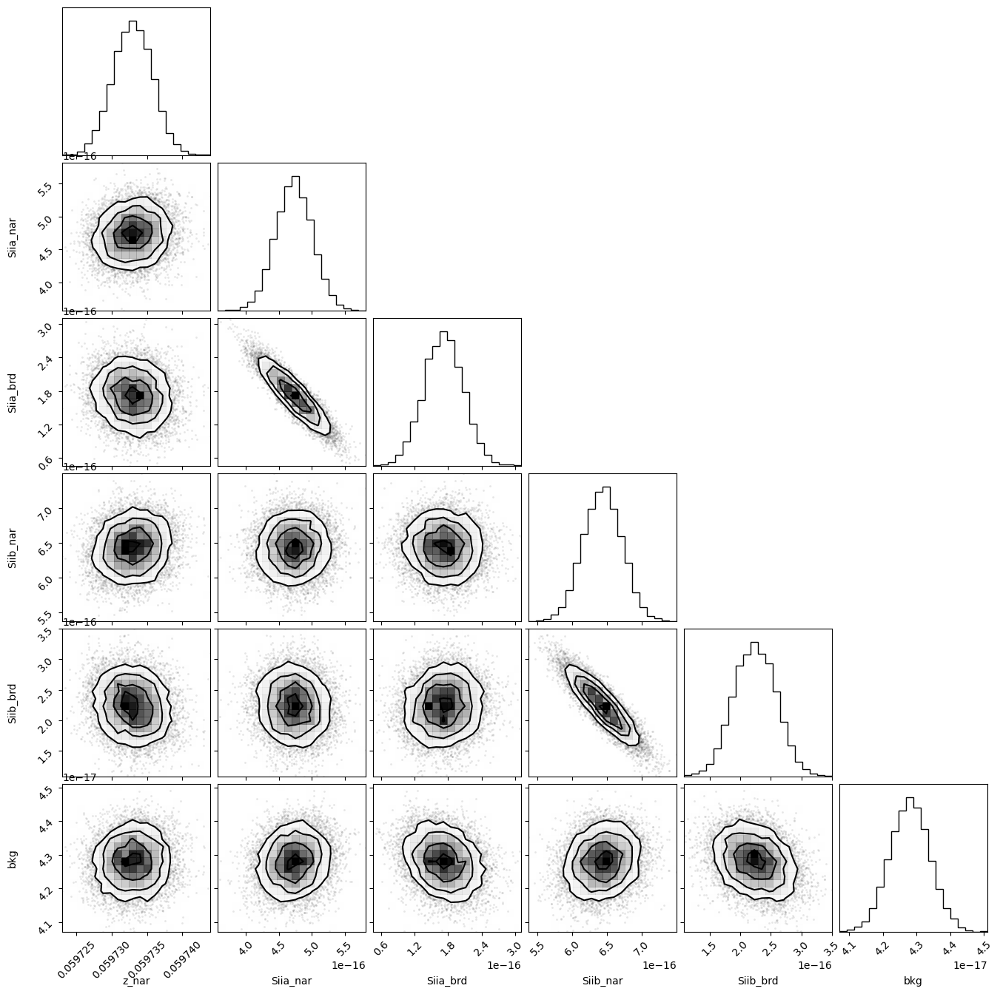

In [68]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_sii_6717.png')

In [69]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973302,2.7834e-06,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,1.11583013,,,1.1158301302986864,-inf,inf,False
sigma_brd,1.97113493,,,1.971134928559357,-inf,inf,False
Siia_nar,4.7280e-16,2.7817e-17,(5.88%),4e-16,0.00000000,inf,True
Siia_brd,1.7176e-16,3.5034e-17,(20.40%),4e-16,0.00000000,inf,True
Siib_nar,6.4346e-16,2.8017e-17,(4.35%),6e-16,0.00000000,inf,True
Siib_brd,2.2407e-16,3.4701e-17,(15.49%),4e-16,0.00000000,inf,True
bkg,4.2797e-17,5.8725e-19,(1.37%),4e-17,0.00000000,inf,True


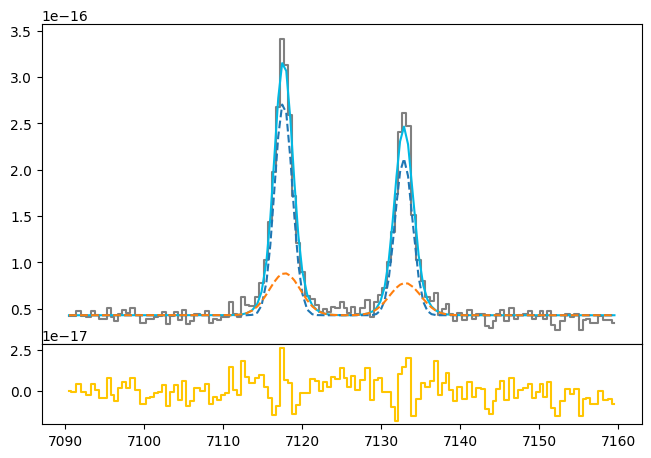

In [70]:
siia_nar_flux = out_sii.flatchain.Siia_nar.mean()
siia_nar_std = out_sii.flatchain.Siia_nar.std()

siia_brd_flux = out_sii.flatchain.Siia_brd.mean()
siia_brd_std = out_sii.flatchain.Siia_brd.std()

siib_nar_flux = out_sii.flatchain.Siib_nar.mean()
siib_nar_std = out_sii.flatchain.Siib_nar.std()

siib_brd_flux = out_sii.flatchain.Siib_brd.mean()
siib_brd_std = out_sii.flatchain.Siib_brd.std()

z_sii = out_sii.flatchain.z_nar.mean()
z_sii_std = out_sii.flatchain.z_nar.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
ax.plot(sii.wavelength, bkg_sii + siia_nar + siib_nar, ls='--')
ax.plot(sii.wavelength, bkg_sii + siia_brd + siib_brd, ls='--')
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

In [71]:
# EW
EW_SII_6730_nar = ufloat(siia_nar_flux, siia_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730_brd = ufloat(siia_brd_flux, siia_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730 = (ufloat(siia_nar_flux, siia_nar_std) + ufloat(siia_brd_flux, siia_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

EW_SII_6716_nar = ufloat(siib_nar_flux, siib_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716_brd = ufloat(siib_brd_flux, siib_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = (ufloat(siib_nar_flux, siib_nar_std) + ufloat(siib_brd_flux, siib_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

# H$\beta$

### Arc lines

In [72]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hb = [wave_cat['Hb']*(1 + z_BN[igal]) - 10, wave_cat['Hb']*(1 + z_BN[igal]) + 10]
mask_arc_hb = (wcal_red[4].data['wave_soln'][0] >= wlims_hb[0]) & (wcal_red[4].data['wave_soln'][0] < wlims_hb[1])

# Arc spectra around the fitted line
x_arc_hb = wcal_red[4].data['wave_soln'][0][mask_arc_hb]
y_arc_hb = wcal_red[19].data[:, 1][mask_arc_hb]

100%|███████████████████████████████████████| 2500/2500 [01:42<00:00, 24.40it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [55.09270481 48.7506004  65.75451941 46.72244857 41.84227928 71.00305421
 58.59895314]


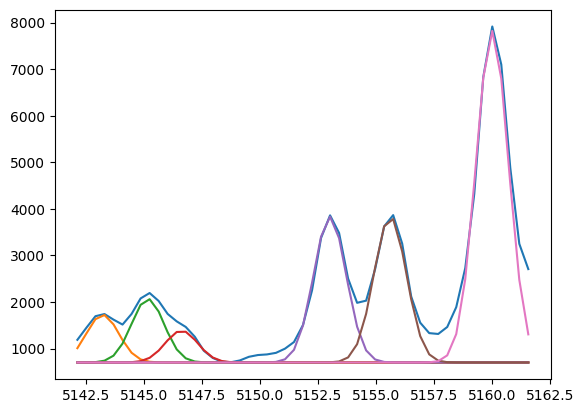

In [73]:
plt.plot(x_arc_hb, y_arc_hb)
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 1800, 5143.2, 0, 0.7))
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 2400, 5145.15, 0, 0.7))
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 1200, 5146.6, 0, 0.7))
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 5500, 5153, 0, 0.7))
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 5500, 5155.6, 0, 0.7))
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, 12500, 5160, 0, 0.7))

params_arc_hb = Parameters()
params_arc_hb.add('z', value=0.0, vary=False)
params_arc_hb.add('mu1', value=5143.2, vary=False)
params_arc_hb.add('mu2', value=5145.15, vary=False)
params_arc_hb.add('mu3', value=5146.6, vary=False)
params_arc_hb.add('mu4', value=5153, vary=False)
params_arc_hb.add('mu5', value=5155.6, vary=False)
params_arc_hb.add('mu6', value=5160, vary=False)
params_arc_hb.add('arc1', value=1800, min=0.)
params_arc_hb.add('arc2', value=2400, min=0.)
params_arc_hb.add('arc3', value=1200, min=0.)
params_arc_hb.add('arc4', value=5500, min=0.)
params_arc_hb.add('arc5', value=5500, min=0.)
params_arc_hb.add('arc6', value=12500, min=0.)
params_arc_hb.add('sigma', value=0.7, min=0.)
params_arc_hb.add('bkg', value=700, vary=False)

def residual_arc_hb(params_arc_hb, x, data, uncertainty):
    
    z = params_arc_hb['z']
    mu1 = params_arc_hb['mu1']
    mu2 = params_arc_hb['mu2']
    mu3 = params_arc_hb['mu3']
    mu4 = params_arc_hb['mu4']
    mu5 = params_arc_hb['mu5']
    mu6 = params_arc_hb['mu6']
    flux1 = params_arc_hb['arc1']
    flux2 = params_arc_hb['arc2']
    flux3 = params_arc_hb['arc3']
    flux4 = params_arc_hb['arc4']
    flux5 = params_arc_hb['arc5']
    flux6 = params_arc_hb['arc6']
    sigma = params_arc_hb['sigma']
    bkg = params_arc_hb['bkg']
    
    x = x_arc_hb
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6
    return (model - y_arc_hb) / 10

np.random.seed(136)
out_arc_hb = minimize(residual_arc_hb, params_arc_hb, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

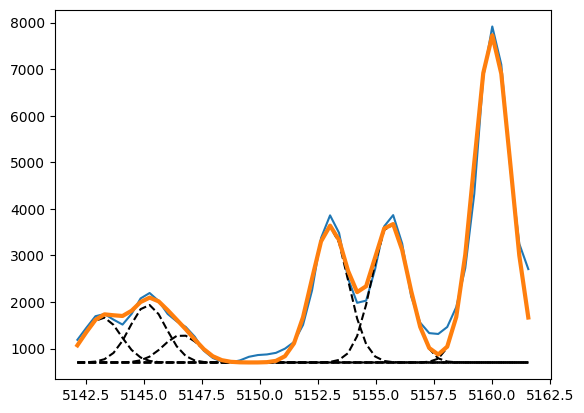

In [74]:
arc1_hb = out_arc_hb.flatchain.arc1.mean()
arc2_hb = out_arc_hb.flatchain.arc2.mean()
arc3_hb = out_arc_hb.flatchain.arc3.mean()
arc4_hb = out_arc_hb.flatchain.arc4.mean()
arc5_hb = out_arc_hb.flatchain.arc5.mean()
arc6_hb = out_arc_hb.flatchain.arc6.mean()
sigma_arc_hb = out_arc_hb.flatchain.sigma.mean()

plt.plot(x_arc_hb, y_arc_hb)
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc1_hb,  5143.2, 0, sigma_arc_hb), color='black', ls='--')
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc2_hb, 5145.15, 0, sigma_arc_hb), color='black', ls='--')
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc3_hb,  5146.6, 0, sigma_arc_hb), color='black', ls='--')
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc4_hb,    5153, 0, sigma_arc_hb), color='black', ls='--')
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc5_hb,  5155.6, 0, sigma_arc_hb), color='black', ls='--')
plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc6_hb,    5160, 0, sigma_arc_hb), color='black', ls='--')

plt.plot(x_arc_hb, 700 + gaussian(x_arc_hb, arc1_hb,  5143.2, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc2_hb, 5145.15, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc3_hb,  5146.6, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc4_hb,    5153, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc5_hb,  5155.6, 0, sigma_arc_hb) \
         + gaussian(x_arc_hb, arc6_hb,    5160, 0, sigma_arc_hb), lw=3
)

### Line fitting

In [75]:
sigma_nar_hb = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hb**2))
sigma_brd_hb = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hb**2))

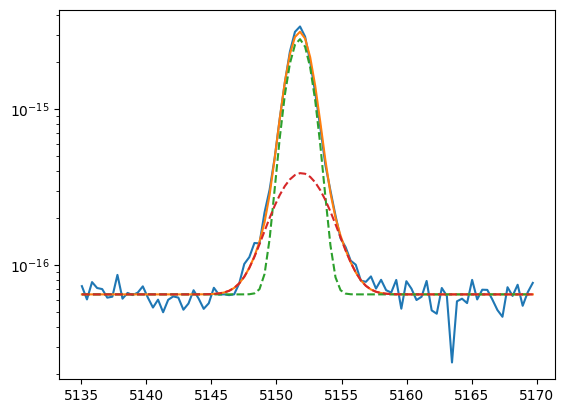

In [76]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 6.5e-17

hb_nar = gaussian(hbeta.wavelength, 6e-15, wave_cat['Hb'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, 1.5e-15, wave_cat['Hb'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

plt.plot(hbeta.wavelength, hb + bkg)
plt.plot(hbeta.wavelength, hb_nar + bkg, ls='--')
plt.plot(hbeta.wavelength, hb_brd + bkg, ls='--')
plt.yscale('log')

In [77]:
params_hb = Parameters()
params_hb.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hb.add('z_ratio', value=z_ratio, vary=False)
params_hb.add('sigma_nar', value=upy.nominal_values(sigma_nar_hb), vary=False)
params_hb.add('sigma_brd', value=upy.nominal_values(sigma_brd_hb), vary=False)
params_hb.add('Hb_nar', value=6.0e-15, min=0.)
params_hb.add('Hb_brd', value=1.5e-15, min=0.)
params_hb.add('bkg', value=6.5e-17, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_nar = params_hb['z_nar']
    z_brd = params_hb['z_nar'] * params_hb['z_ratio']
    sigma_nar = params_hb['sigma_nar']
    sigma_brd = params_hb['sigma_brd']
    hb_nar_flux = params_hb['Hb_nar']
    hb_brd_flux = params_hb['Hb_brd']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_nar_flux, wave_cat['Hb'], z_nar, sigma_nar) + \
            gaussian(x, hb_brd_flux, wave_cat['Hb'], z_brd, sigma_brd)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [78]:
np.random.seed(136)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:11<00:00, 34.86it/s]


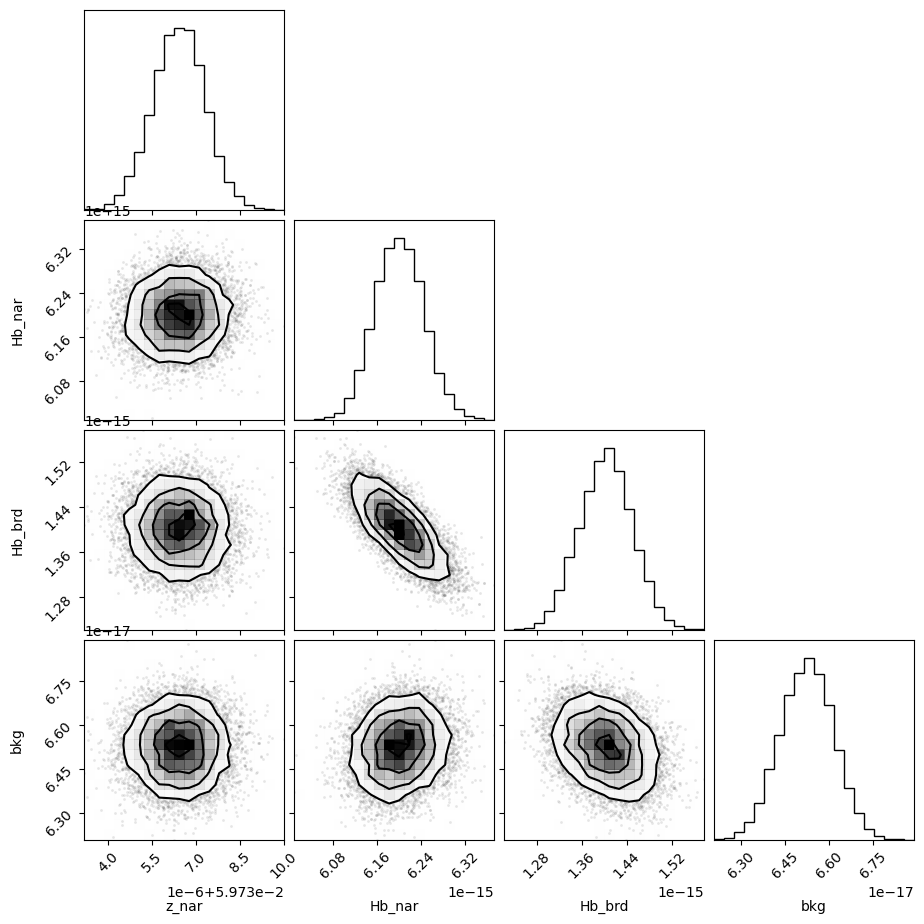

In [79]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

In [80]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973643,8.8117e-07,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.87050699,,,0.870506994648882,-inf,inf,False
sigma_brd,1.84338777,,,1.843387765674099,-inf,inf,False
Hb_nar,6.2011e-15,4.4275e-17,(0.71%),6e-15,0.00000000,inf,True
Hb_brd,1.4033e-15,4.7049e-17,(3.35%),1.5e-15,0.00000000,inf,True
bkg,6.5253e-17,9.0517e-19,(1.39%),6.5e-17,0.00000000,inf,True


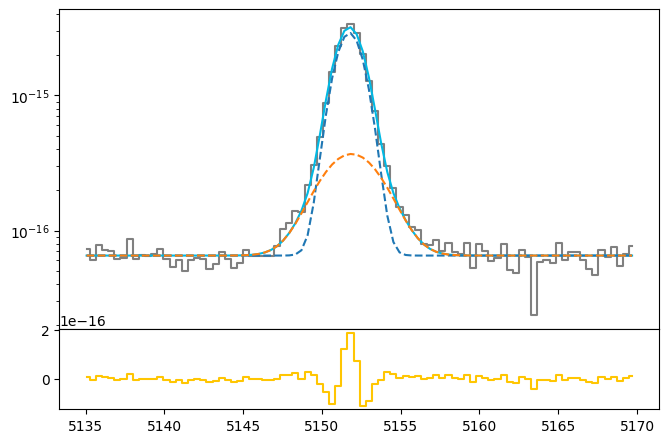

In [81]:
hb_nar_flux = out_hb.flatchain.Hb_nar.mean()
hb_nar_std = out_hb.flatchain.Hb_nar.std()

hb_brd_flux = out_hb.flatchain.Hb_brd.mean()
hb_brd_std = out_hb.flatchain.Hb_brd.std()

z_hb = out_hb.flatchain.z_nar.mean()
z_hb_std = out_hb.flatchain.z_nar.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb_nar = gaussian(hbeta.wavelength, hb_nar_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, hb_brd_flux, wave_cat['Hb'], z_hb * z_ratio, upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.plot(hbeta.wavelength, bkg_hb + hb_nar, ls='--')
ax.plot(hbeta.wavelength, bkg_hb + hb_brd, ls='--')
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [82]:
# EW
EW_Hb_nar = ufloat(hb_nar_flux, hb_nar_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb_brd = ufloat(hb_brd_flux, hb_brd_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb = (ufloat(hb_nar_flux, hb_nar_std) + ufloat(hb_brd_flux, hb_brd_std)) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

### Arc lines

In [83]:
wave_cat['Hg']*(1 + z_BN[igal])

4599.771797279999

In [84]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hg = [wave_cat['Hg']*(1 + z_BN[igal]) - 10, wave_cat['Hg']*(1 + z_BN[igal]) + 8]
mask_arc_hg = (wcal_blue[8].data['wave_soln'][0] >= wlims_hg[0]) & (wcal_blue[8].data['wave_soln'][0] < wlims_hg[1])

# Arc spectra around the fitted line
x_arc_hg = wcal_blue[8].data['wave_soln'][0][mask_arc_hg]
y_arc_hg = wcal_blue[25].data[:, 3][mask_arc_hg]

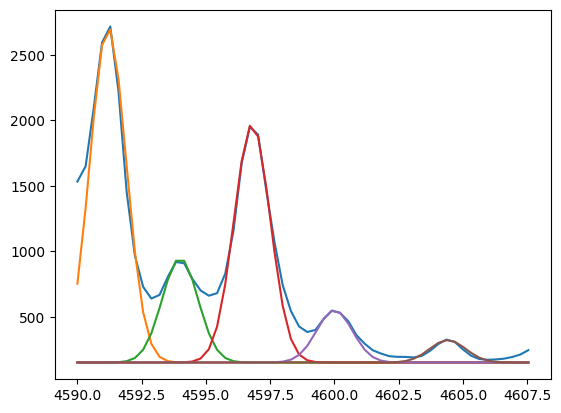

In [85]:
plt.plot(x_arc_hg, y_arc_hg)
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, 4500, 4591.2, 0, 0.7))
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, 1400,   4594, 0, 0.7))
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, 3200, 4596.8, 0, 0.7))
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg,  700,   4600, 0, 0.7))
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg,  300, 4604.4, 0, 0.7))

In [86]:
params_arc_hg = Parameters()
params_arc_hg.add('z', value=0.0, vary=False)
params_arc_hg.add('mu1', value=4591.2, vary=False)
params_arc_hg.add('mu2', value=  4594, vary=False)
params_arc_hg.add('mu3', value=4596.8, vary=False)
params_arc_hg.add('mu4', value=  4600, vary=False)
params_arc_hg.add('mu5', value=4604.4, vary=False)
params_arc_hg.add('arc1', value=4500, min=0.)
params_arc_hg.add('arc2', value=1400, min=0.)
params_arc_hg.add('arc3', value=3200, min=0.)
params_arc_hg.add('arc4', value= 700, min=0.)
params_arc_hg.add('arc5', value= 300, min=0.)
params_arc_hg.add('sigma', value=0.7, min=0.)
params_arc_hg.add('bkg', value=150, vary=False)

def residual_arc_hg(params_arc_hg, x, data, uncertainty):
    
    z = params_arc_hg['z']
    mu1 = params_arc_hg['mu1']
    mu2 = params_arc_hg['mu2']
    mu3 = params_arc_hg['mu3']
    mu4 = params_arc_hg['mu4']
    mu5 = params_arc_hg['mu5']
    flux1 = params_arc_hg['arc1']
    flux2 = params_arc_hg['arc2']
    flux3 = params_arc_hg['arc3']
    flux4 = params_arc_hg['arc4']
    flux5 = params_arc_hg['arc5']
    sigma = params_arc_hg['sigma']
    bkg = params_arc_hg['bkg']
    
    x = x_arc_hg
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_hg) / 10

np.random.seed(136)
out_arc_hg = minimize(residual_arc_hg, params_arc_hg, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:46<00:00, 23.56it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 75.61211822  32.13221567  84.63191938 101.85146489  50.76729569
  79.41238068]


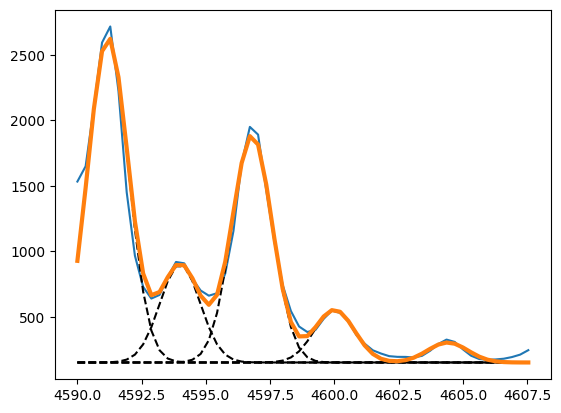

In [87]:
arc1_hg = out_arc_hg.flatchain.arc1.mean()
arc2_hg = out_arc_hg.flatchain.arc2.mean()
arc3_hg = out_arc_hg.flatchain.arc3.mean()
arc4_hg = out_arc_hg.flatchain.arc4.mean()
arc5_hg = out_arc_hg.flatchain.arc5.mean()
sigma_arc_hg = out_arc_hg.flatchain.sigma.mean()

plt.plot(x_arc_hg, y_arc_hg)
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc1_hg, 4591.2, 0, sigma_arc_hg), color='black', ls='--')
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc2_hg,   4594, 0, sigma_arc_hg), color='black', ls='--')
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc3_hg, 4596.8, 0, sigma_arc_hg), color='black', ls='--')
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc4_hg,   4600, 0, sigma_arc_hg), color='black', ls='--')
plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc5_hg, 4604.4, 0, sigma_arc_hg), color='black', ls='--')

plt.plot(x_arc_hg, 150 + gaussian(x_arc_hg, arc1_hg, 4591.2, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc2_hg,   4594, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc3_hg, 4596.8, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc4_hg,   4600, 0, sigma_arc_hg) \
                       + gaussian(x_arc_hg, arc5_hg, 4604.4, 0, sigma_arc_hg), lw=3
)

### Line fitting

In [88]:
sigma_nar_hg = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hg**2))
sigma_brd_hg = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hg**2))

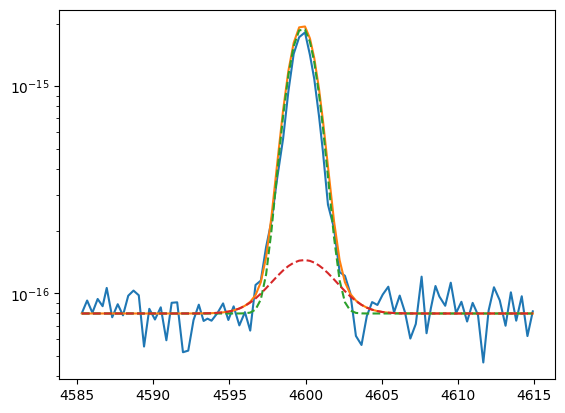

In [89]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 8e-17

hg_nar = gaussian(hgamma.wavelength, 4e-15, wave_cat['Hg'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, 3e-16, wave_cat['Hg'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

plt.plot(hgamma.wavelength, hg + bkg)
plt.plot(hgamma.wavelength, hg_nar + bkg, ls='--')
plt.plot(hgamma.wavelength, hg_brd + bkg, ls='--')
plt.yscale('log')

In [90]:
params_hg = Parameters()
params_hg.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hg.add('z_ratio', value=z_ratio, vary=False)
params_hg.add('sigma_nar', value=upy.nominal_values(sigma_nar_hg), vary=False)
params_hg.add('sigma_brd', value=upy.nominal_values(sigma_brd_hg), vary=False)
params_hg.add('Hg_nar', value=3.5e-15, min=0.)
params_hg.add('Hg_brd', value=3.0e-16, min=0.)
params_hg.add('bkg', value=8e-17, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_nar = params_hg['z_nar']
    z_brd = params_hg['z_nar'] * params_hg['z_ratio']
    sigma_nar = params_hg['sigma_nar']
    sigma_brd = params_hg['sigma_brd']
    hg_nar_flux = params_hg['Hg_nar']
    hg_brd_flux = params_hg['Hg_brd']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_nar_flux, wave_cat['Hg'], z_nar, sigma_nar) + \
            gaussian(x, hg_brd_flux, wave_cat['Hg'], z_brd, sigma_brd)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [91]:
np.random.seed(136)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:02<00:00, 39.79it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 43.64064147  48.21157853 102.66569661  49.77169357]


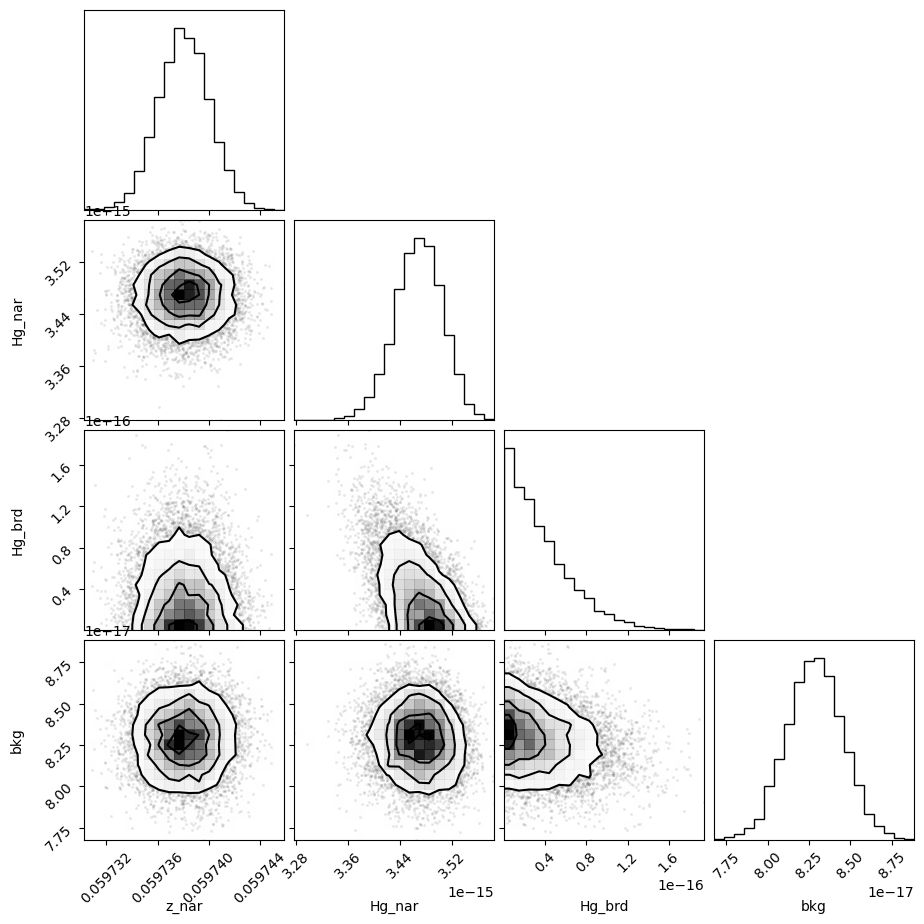

In [92]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

In [93]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973807,1.9834e-06,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.87107277,,,0.8710727741555517,-inf,inf,False
sigma_brd,1.84365501,,,1.843655012408603,-inf,inf,False
Hg_nar,3.4702e-15,3.6169e-17,(1.04%),3.5e-15,0.00000000,inf,True
Hg_brd,2.8680e-17,2.9208e-17,(101.84%),3e-16,0.00000000,inf,True
bkg,8.2857e-17,1.7017e-18,(2.05%),8e-17,0.00000000,inf,True


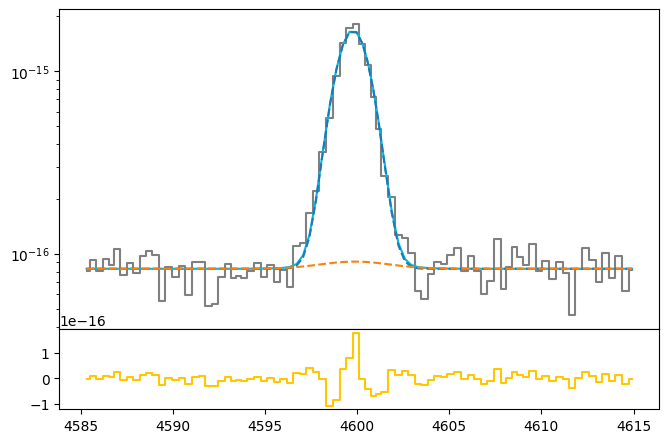

In [94]:
hg_nar_flux = out_hg.flatchain.Hg_nar.mean()
hg_nar_std = out_hg.flatchain.Hg_nar.std()

hg_brd_flux = out_hg.flatchain.Hg_brd.mean()
hg_brd_std = out_hg.flatchain.Hg_brd.std()

z_hg = out_hg.flatchain.z_nar.mean()
z_hg_std = out_hg.flatchain.z_nar.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg_nar = gaussian(hgamma.wavelength, hg_nar_flux, wave_cat['Hg'],           z_hg, upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, hg_brd_flux, wave_cat['Hg'], z_hg * z_ratio, upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.plot(hgamma.wavelength, bkg_hg + hg_nar, ls='--')
ax.plot(hgamma.wavelength, bkg_hg + hg_brd, ls='--')
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

In [95]:
# EW
EW_Hg_nar = ufloat(hg_nar_flux, hg_nar_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg_brd = ufloat(hg_brd_flux, hg_brd_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg = (ufloat(hg_nar_flux, hg_nar_std) + ufloat(hg_brd_flux, hg_brd_std)) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

### Arc lines

In [96]:
wave_cat['Hd'] * (1 + z_BN[igal])

4346.74644894798

In [97]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_hd = [wave_cat['Hd']*(1 + z_BN[igal]), wave_cat['Hd']*(1 + z_BN[igal]) + 5]
mask_arc_hd = (wcal_blue[8].data['wave_soln'][0] >= wlims_hd[0]) & (wcal_blue[8].data['wave_soln'][0] < wlims_hd[1])

# Arc spectra around the fitted line
x_arc_hd = wcal_blue[8].data['wave_soln'][0][mask_arc_hd]
y_arc_hd = wcal_blue[25].data[:, 3][mask_arc_hd]

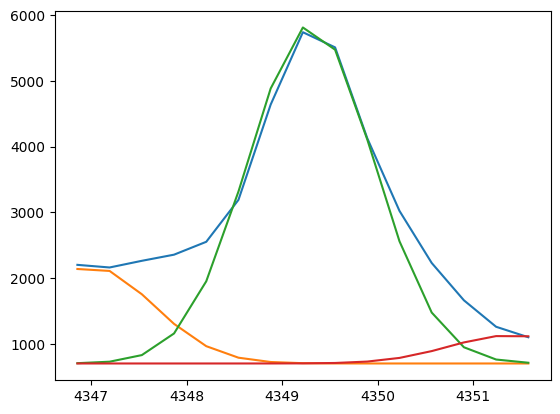

In [98]:
plt.plot(x_arc_hd, y_arc_hd)
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, 2400,   4347, 0, 0.65))
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, 8400, 4349.3, 0, 0.65))
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd,  700, 4351.4, 0, 0.65))

In [99]:
params_arc_hd = Parameters()
params_arc_hd.add('z', value=0.0, vary=False)
params_arc_hd.add('mu1', value=  4347, vary=False)
params_arc_hd.add('mu2', value=4349.3, vary=False)
params_arc_hd.add('mu3', value=4351.4, vary=False)
params_arc_hd.add('arc1', value=2400, min=0.)
params_arc_hd.add('arc2', value=8400, min=0.)
params_arc_hd.add('arc3', value= 700, min=0.)
params_arc_hd.add('sigma', value=0.65, min=0.)
params_arc_hd.add('bkg', value=700, vary=False)

def residual_arc_hd(params_arc_hd, x, data, uncertainty):
    
    z = params_arc_hd['z']
    mu1 = params_arc_hd['mu1']
    mu2 = params_arc_hd['mu2']
    mu3 = params_arc_hd['mu3']
    flux1 = params_arc_hd['arc1']
    flux2 = params_arc_hd['arc2']
    flux3 = params_arc_hd['arc3']
    sigma = params_arc_hd['sigma']
    bkg = params_arc_hd['bkg']
    
    x = x_arc_hd
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model = bkg + model1 + model2 + model3
    return (model - y_arc_hd) / 10

np.random.seed(136)
out_arc_hd = minimize(residual_arc_hd, params_arc_hd, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [01:17<00:00, 32.40it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 77.31296496  33.8895645  105.46444033  51.53724535]


In [100]:
out_arc_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z,0.00000000,,,0.0,-inf,inf,False
mu1,4347.00000,,,4347,-inf,inf,False
mu2,4349.30000,,,4349.3,-inf,inf,False
mu3,4351.40000,,,4351.4,-inf,inf,False
arc1,2817.28755,10.8719217,(0.39%),2400,0.00000000,inf,True
arc2,8746.54028,11.0861332,(0.13%),8400,0.00000000,inf,True
arc3,970.445029,10.9733595,(1.13%),700,0.00000000,inf,True
sigma,0.71700010,0.00105696,(0.15%),0.65,0.00000000,inf,True
bkg,700.000000,,,700,-inf,inf,False


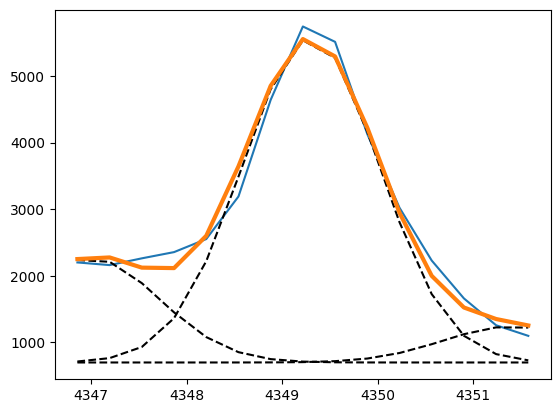

In [101]:
arc1_hd = out_arc_hd.flatchain.arc1.mean()
arc2_hd = out_arc_hd.flatchain.arc2.mean()
arc3_hd = out_arc_hd.flatchain.arc3.mean()
sigma_arc_hd = out_arc_hd.flatchain.sigma.mean()

plt.plot(x_arc_hd, y_arc_hd)
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, arc1_hd,   4347, 0, sigma_arc_hd), color='black', ls='--')
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, arc2_hd, 4349.3, 0, sigma_arc_hd), color='black', ls='--')
plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, arc3_hd, 4351.4, 0, sigma_arc_hd), color='black', ls='--')

plt.plot(x_arc_hd, 700 + gaussian(x_arc_hd, arc1_hd,   4347, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc2_hd, 4349.3, 0, sigma_arc_hd) \
                       + gaussian(x_arc_hd, arc3_hd, 4351.4, 0, sigma_arc_hd), lw=3
)

### Line fitting

In [102]:
sigma_nar_hd = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_hd**2))
sigma_brd_hd = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hd**2))

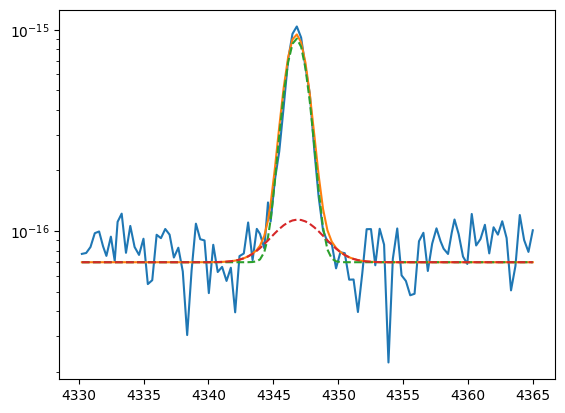

In [103]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 7e-17

hd_nar = gaussian(hdelta.wavelength, 1.7e-15, wave_cat['Hd'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, 2e-16, wave_cat['Hd'], z=z_brd_oiii_4959,   sigma=upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

plt.plot(hdelta.wavelength, hd + bkg)
plt.plot(hdelta.wavelength, hd_nar + bkg, ls='--')
plt.plot(hdelta.wavelength, hd_brd + bkg, ls='--')
plt.yscale('log')

In [104]:
params_hd = Parameters()
params_hd.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hd.add('z_ratio', value=z_ratio, vary=False)
params_hd.add('sigma_nar', value=upy.nominal_values(sigma_nar_hd), vary=False)
params_hd.add('sigma_brd', value=upy.nominal_values(sigma_brd_hd), vary=False)
params_hd.add('Hd_nar', value=1.7e-15, min=0.)
params_hd.add('Hd_brd', value=2.0e-16, min=0.)
params_hd.add('bkg', value=7e-17, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_nar = params_hd['z_nar']
    z_brd = params_hd['z_nar'] * params_hd['z_ratio']
    sigma_nar = params_hd['sigma_nar']
    sigma_brd = params_hd['sigma_brd']
    hd_nar_flux = params_hd['Hd_nar']
    hd_brd_flux = params_hd['Hd_brd']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_nar_flux, wave_cat['Hd'], z_nar, sigma_nar) + \
            gaussian(x, hd_brd_flux, wave_cat['Hd'], z_brd, sigma_brd)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [105]:
np.random.seed(136)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:02<00:00, 40.24it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [44.48215002 55.1833226  83.39317404 55.18824114]


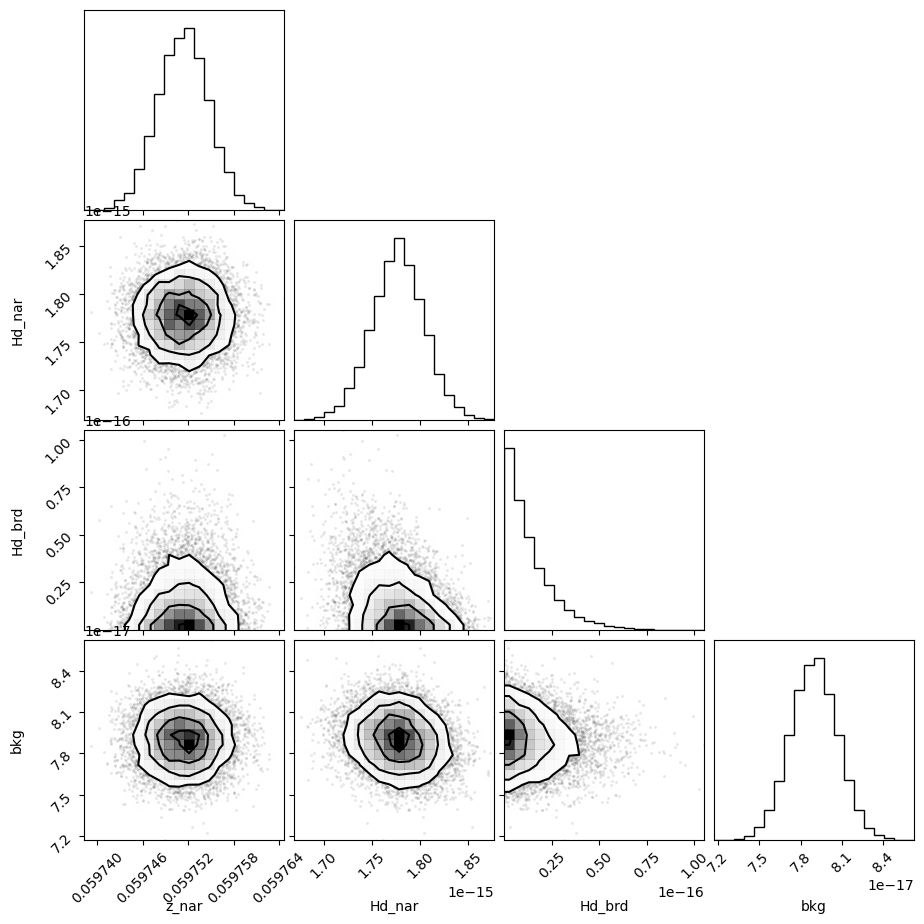

In [106]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

In [107]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05975139,3.3161e-06,(0.01%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.81407706,,,0.8140770641602012,-inf,inf,False
sigma_brd,1.81742056,,,1.817420560381116,-inf,inf,False
Hd_nar,1.7773e-15,2.6892e-17,(1.51%),1.7e-15,0.00000000,inf,True
Hd_brd,9.9610e-18,1.1416e-17,(114.61%),2e-16,0.00000000,inf,True
bkg,7.8991e-17,1.6877e-18,(2.14%),7e-17,0.00000000,inf,True


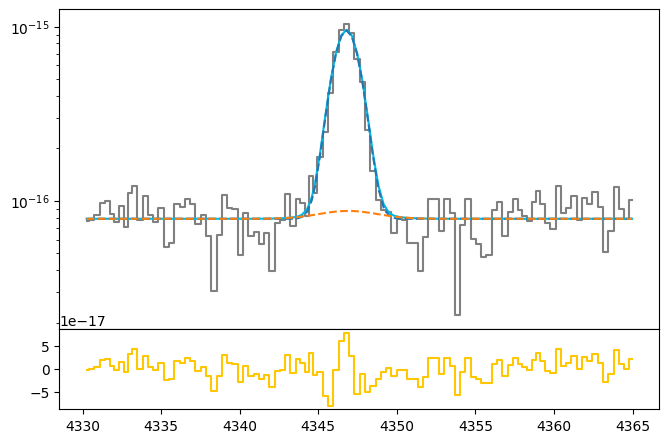

In [108]:
hd_nar_flux = out_hd.flatchain.Hd_nar.mean()
hd_nar_std = out_hd.flatchain.Hd_nar.std()

hd_brd_flux = 3 * out_hd.flatchain.Hd_brd.std()
hd_brd_std = 0.0

z_hd = out_hd.flatchain.z_nar.mean()
z_hd_std = out_hd.flatchain.z_nar.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd_nar = gaussian(hdelta.wavelength, hd_nar_flux, wave_cat['Hd'],           z_hd, upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength, hd_brd_flux, wave_cat['Hd'], z_hd * z_ratio, upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.plot(hdelta.wavelength, bkg_hd + hd_nar, ls='--')
ax.plot(hdelta.wavelength, bkg_hd + hd_brd, ls='--')
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

In [109]:
# EW
EW_Hd_nar = ufloat(hd_nar_flux, hd_nar_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd_brd = ufloat(hd_brd_flux, hd_brd_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd = (ufloat(hd_nar_flux, hd_nar_std) + ufloat(hd_brd_flux, hd_brd_std)) / ufloat(bkg_hd, bkg_hd_std)

# [OII]3726 + [OII]3729

### Arc lines

In [110]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_3729 = [wave_cat['[OII]3729']*(1 + z_BN[igal]) - 2, wave_cat['[OII]3729']*(1 + z_BN[igal]) + 10]
mask_arc_3729 = (wcal_blue[4].data['wave_soln'][0] >= wlims_3729[0]) & (wcal_blue[4].data['wave_soln'][0] < wlims_3729[1])

# Arc spectra around the fitted line
x_arc_3729 = wcal_blue[4].data['wave_soln'][0][mask_arc_3729]
y_arc_3729 = wcal_blue[25].data[:, 1][mask_arc_3729]

100%|███████████████████████████████████████| 2500/2500 [02:06<00:00, 19.74it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 53.38002956  73.79678139 120.1239268   76.73052146  65.59735929
  89.38888246  50.46991528  66.87677792]


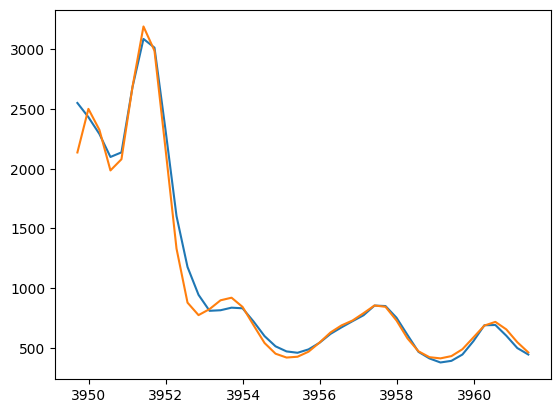

In [111]:
plt.plot(x_arc_3729, y_arc_3729)
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, 2600, 3950, 0, 0.5) \
                         + gaussian(x_arc_3729, 3500, 3951.5, 0, 0.5) \
                         + gaussian(x_arc_3729,  300, 3953, 0, 0.5) \
                         + gaussian(x_arc_3729,  550, 3953.8, 0, 0.5) \
                         + gaussian(x_arc_3729,  300, 3956.5, 0, 0.5) \
                         + gaussian(x_arc_3729,  550, 3957.6, 0, 0.5) \
                         + gaussian(x_arc_3729,  400, 3960.5, 0, 0.5)
)

params_arc_3729 = Parameters()
params_arc_3729.add('z', value=0.0, vary=False)
params_arc_3729.add('mu1', value=3950, vary=False)
params_arc_3729.add('mu2', value=3951.5, vary=False)
params_arc_3729.add('mu3', value=3953, vary=False)
params_arc_3729.add('mu4', value=3953.8, vary=False)
params_arc_3729.add('mu5', value=3956.5, vary=False)
params_arc_3729.add('mu6', value=3957.6, vary=False)
params_arc_3729.add('mu7', value=3960.5, vary=False)
params_arc_3729.add('arc1', value=2600, min=0.)
params_arc_3729.add('arc2', value=3500, min=0.)
params_arc_3729.add('arc3', value=300, min=0.)
params_arc_3729.add('arc4', value=550, min=0.)
params_arc_3729.add('arc5', value=300, min=0.)
params_arc_3729.add('arc6', value=550, min=0.)
params_arc_3729.add('arc7', value=400, min=0.)
params_arc_3729.add('sigma', value=0.5, min=0.)
params_arc_3729.add('bkg', value=400, vary=False)

def residual_arc_3729(params_arc_3729, x, data, uncertainty):
    
    z = params_arc_3729['z']
    mu1 = params_arc_3729['mu1']
    mu2 = params_arc_3729['mu2']
    mu3 = params_arc_3729['mu3']
    mu4 = params_arc_3729['mu4']
    mu5 = params_arc_3729['mu5']
    mu6 = params_arc_3729['mu6']
    mu7 = params_arc_3729['mu7']
    flux1 = params_arc_3729['arc1']
    flux2 = params_arc_3729['arc2']
    flux3 = params_arc_3729['arc3']
    flux4 = params_arc_3729['arc4']
    flux5 = params_arc_3729['arc5']
    flux6 = params_arc_3729['arc6']
    flux7 = params_arc_3729['arc7']
    sigma = params_arc_3729['sigma']
    bkg = params_arc_3729['bkg']
    
    x = x_arc_3729
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7
    
    return (model - y_arc_3729) / 10

np.random.seed(136)
out_arc_3729 = minimize(residual_arc_3729, params_arc_3729, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

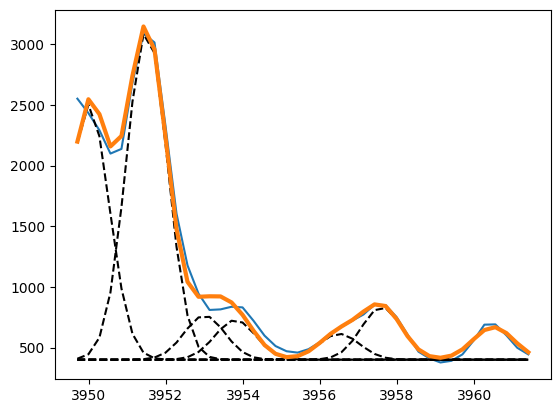

In [112]:
arc1_3729 = out_arc_3729.flatchain.arc1.mean()
arc2_3729 = out_arc_3729.flatchain.arc2.mean()
arc3_3729 = out_arc_3729.flatchain.arc3.mean()
arc4_3729 = out_arc_3729.flatchain.arc4.mean()
arc5_3729 = out_arc_3729.flatchain.arc5.mean()
arc6_3729 = out_arc_3729.flatchain.arc6.mean()
arc7_3729 = out_arc_3729.flatchain.arc7.mean()
sigma_arc_3729 = out_arc_3729.flatchain.sigma.mean()

plt.plot(x_arc_3729, y_arc_3729)

plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc1_3729, 3950, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc2_3729, 3951.5, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc3_3729, 3953, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc4_3729, 3953.8, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc5_3729, 3956.5, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc6_3729, 3957.6, 0, sigma_arc_3729), color='black', ls='--')
plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc7_3729, 3960.5, 0, sigma_arc_3729), color='black', ls='--')

plt.plot(x_arc_3729, 400 + gaussian(x_arc_3729, arc1_3729, 3950, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc2_3729, 3951.5, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc3_3729, 3953, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc4_3729, 3953.8, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc5_3729, 3956.5, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc6_3729, 3957.6, 0, sigma_arc_3729) \
        + gaussian(x_arc_3729, arc7_3729, 3960.5, 0, sigma_arc_3729), lw=3
)

### Line fitting

In [113]:
sigma_nar_3729 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_3729**2))
sigma_brd_3729 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3729**2))

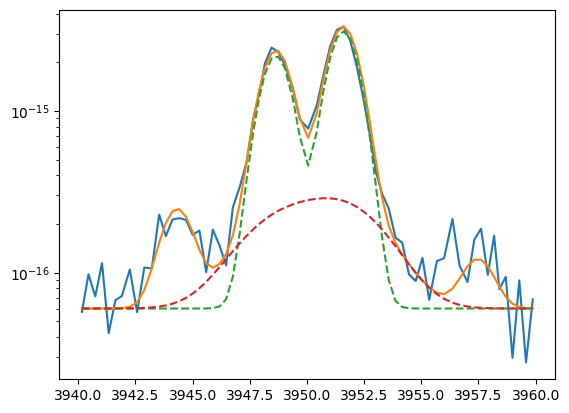

In [114]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 0.1e-15, wave_cat['H13'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, 0.5e-14, wave_cat['[OII]3729'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, 0.8e-15, wave_cat['[OII]3729'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, 0.35e-14, wave_cat['[OII]3726'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, 0.6e-15, wave_cat['[OII]3726'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, 0.3e-15, wave_cat['H14'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

bkg = 6e-17

plt.plot(oii_3727.wavelength, bkg + oiid + oiic + h13 + h14)
plt.plot(oii_3727.wavelength, bkg + oiid_nar + oiic_nar, ls='--')
plt.plot(oii_3727.wavelength, bkg + oiid_brd + oiic_brd, ls='--')

plt.yscale('log')

In [115]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_3727.add('z_ratio', value=z_ratio, vary=False)
params_oii_3727.add('sigma_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('H13', value=0.1e-15, min=0.)
params_oii_3727.add('Oiic_nar', value=0.5e-14, min=0.)
params_oii_3727.add('Oiic_brd', value=0.8e-15, min=0.)
params_oii_3727.add('Oiid_nar', value=0.35e-14, min=0.)
params_oii_3727.add('Oiid_brd', value=0.6e-15, min=0.)
params_oii_3727.add('H14', value=0.3e-15, min=0.)
params_oii_3727.add('bkg', value=6e-17, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_nar = params_oii_3727['z_nar']
    z_brd = params_oii_3727['z_nar'] * params_oii_3727['z_ratio']
    sigma_nar = params_oii_3727['sigma_nar']
    sigma_brd = params_oii_3727['sigma_brd']
    
    h13_flux = params_oii_3727['H13']
    oiic_nar_flux = params_oii_3727['Oiic_nar']
    oiic_brd_flux = params_oii_3727['Oiic_brd']
    oiid_nar_flux = params_oii_3727['Oiid_nar']
    oiid_brd_flux = params_oii_3727['Oiid_brd']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_nar, sigma_nar)
    model_oiic = gaussian(x, oiic_nar_flux, wave_cat['[OII]3729'], z_nar, sigma_nar) + \
                 gaussian(x, oiic_brd_flux, wave_cat['[OII]3729'], z_brd, sigma_brd)
    model_oiid = gaussian(x, oiid_nar_flux, wave_cat['[OII]3726'], z_nar, sigma_nar) + \
                 gaussian(x, oiid_brd_flux, wave_cat['[OII]3726'], z_brd, sigma_brd)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_nar, sigma_nar)
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [116]:
np.random.seed(136)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:53<00:00, 22.05it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [61.60031423 69.74159188 78.87882729 75.1513728  69.74170894 70.60658867
 70.31712619 69.45233774]


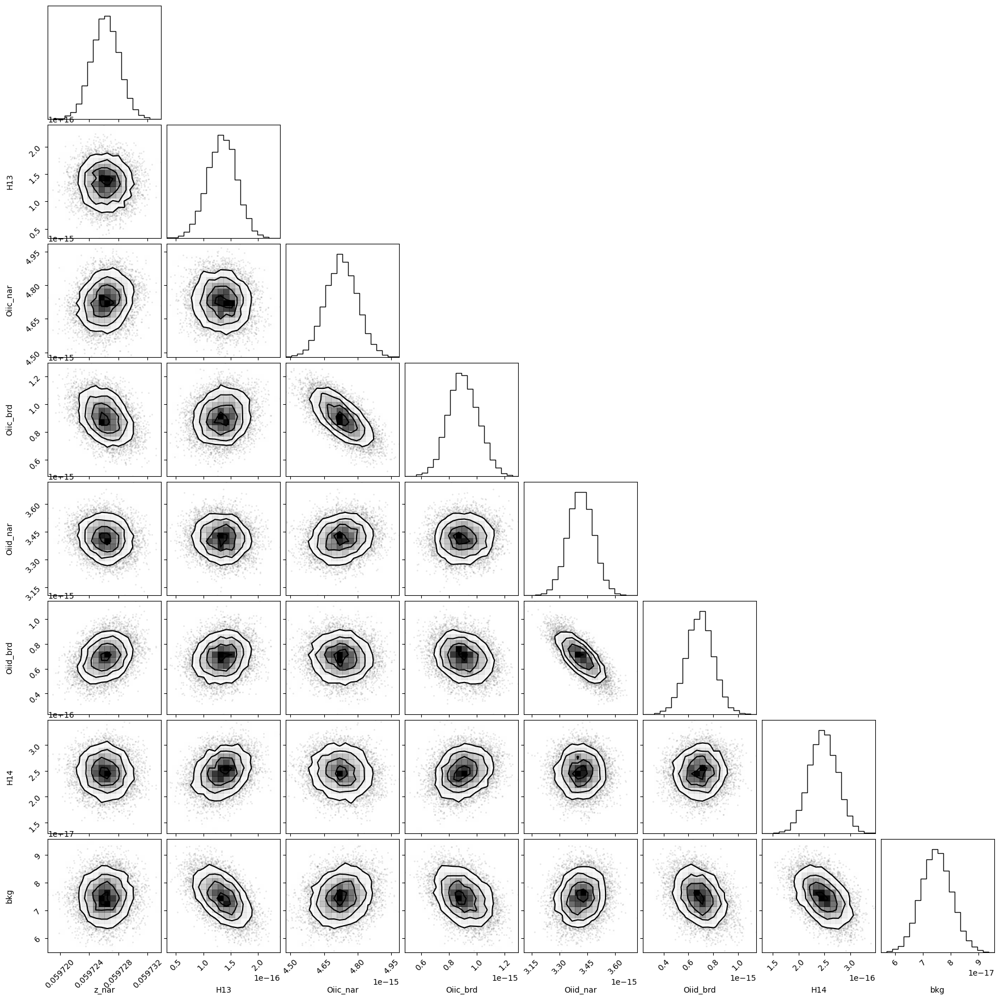

In [117]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_oii_3727.png')

In [118]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05972623,1.8736e-06,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.65392168,,,0.6539216826654607,-inf,inf,False
sigma_brd,1.75154492,,,1.7515449163422403,-inf,inf,False
H13,1.3460e-16,2.6357e-17,(19.58%),1e-16,0.00000000,inf,True
Oiic_nar,4.7273e-15,7.0972e-17,(1.50%),5e-15,0.00000000,inf,True
Oiic_brd,8.9863e-16,1.0897e-16,(12.13%),8e-16,0.00000000,inf,True
Oiid_nar,3.4136e-15,6.9094e-17,(2.02%),3.5e-15,0.00000000,inf,True
Oiid_brd,6.9355e-16,1.0813e-16,(15.59%),6e-16,0.00000000,inf,True
H14,2.4767e-16,2.7153e-17,(10.96%),3e-16,0.00000000,inf,True


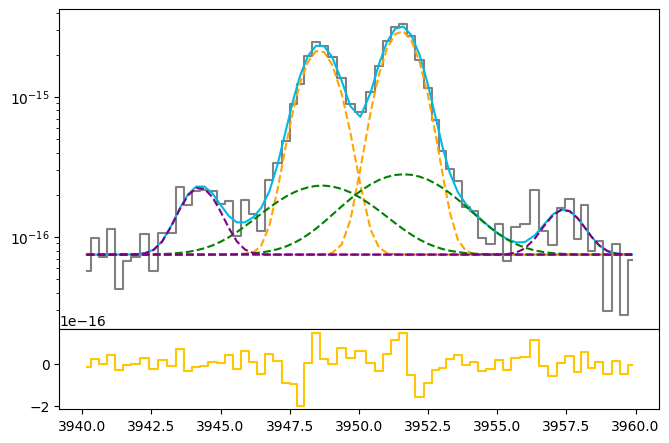

In [119]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_nar_flux = out_oii_3727.flatchain.Oiic_nar.mean()
oiic_nar_std = out_oii_3727.flatchain.Oiic_nar.std()

oiic_brd_flux = out_oii_3727.flatchain.Oiic_brd.mean()
oiic_brd_std = out_oii_3727.flatchain.Oiic_brd.std()

oiid_nar_flux = out_oii_3727.flatchain.Oiid_nar.mean()
oiid_nar_std = out_oii_3727.flatchain.Oiid_nar.std()

oiid_brd_flux = out_oii_3727.flatchain.Oiid_brd.mean()
oiid_brd_std = out_oii_3727.flatchain.Oiid_brd.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_nar.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_nar.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13, ls='--', color='purple')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h14, ls='--', color='purple')

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14, color=c[3], where='mid')
#plt.savefig('/home/benjamin/Desktop/firesult_oii_3727.png', bbox_inches='tight', facecolor='white')

In [120]:
# EW
EW_OII_3729_nar = ufloat(oiic_nar_flux, oiic_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729_brd = ufloat(oiic_brd_flux, oiic_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729 = (ufloat(oiic_nar_flux, oiic_nar_std) + ufloat(oiic_brd_flux, oiic_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

EW_OII_3726_nar = ufloat(oiid_nar_flux, oiid_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726_brd = ufloat(oiid_brd_flux, oiid_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = (ufloat(oiid_nar_flux, oiid_nar_std) + ufloat(oiid_brd_flux, oiid_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

----

# High ionization

# [SIII]9532

### Arc lines

In [121]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9532 = [wave_cat['[SIII]9532']*(1 + z_BN[igal]) - 90, wave_cat['[SIII]9532']*(1 + z_BN[igal]) ]
mask_arc_9532 = (wcal_red[16].data['wave_soln'][0] >= wlims_9532[0]) & (wcal_red[16].data['wave_soln'][0] < wlims_9532[1])

# Arc spectra around the fitted line
x_arc_9532 = wcal_red[16].data['wave_soln'][0][mask_arc_9532]
y_arc_9532 = wcal_red[19].data[:, 7][mask_arc_9532]

100%|███████████████████████████████████████| 2500/2500 [00:47<00:00, 52.11it/s]


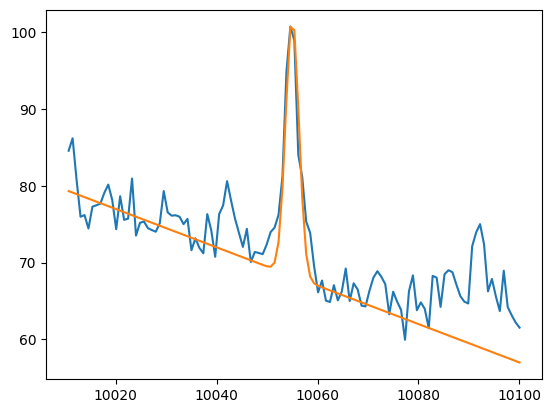

In [122]:
plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, 2582 - (0.25 * x_arc_9532) + gaussian(x_arc_9532, 110, 10055, 0, 1.3))

params_arc_9532 = Parameters()
params_arc_9532.add('z', value=0.0, vary=False)
params_arc_9532.add('mu', value=10055, vary=False)
params_arc_9532.add('arc', value=110, min=0.)
params_arc_9532.add('sigma', value=1.3, min=0.)
params_arc_9532.add('bkg_m', value=-0.25, vary=True)
params_arc_9532.add('bkg_n', value=2582, vary=True)

def residual_arc_9532(params_arc_9532, x, data, uncertainty):
    
    z = params_arc_9532['z']
    mu = params_arc_9532['mu']
    flux = params_arc_9532['arc']
    sigma = params_arc_9532['sigma']
    m = params_arc_9532['bkg_m']
    n = params_arc_9532['bkg_n']
    
    x = x_arc_9532
    bkg = (m * x) + n
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_9532) / 10

np.random.seed(136)
out_arc_9532 = minimize(residual_arc_9532, params_arc_9532, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

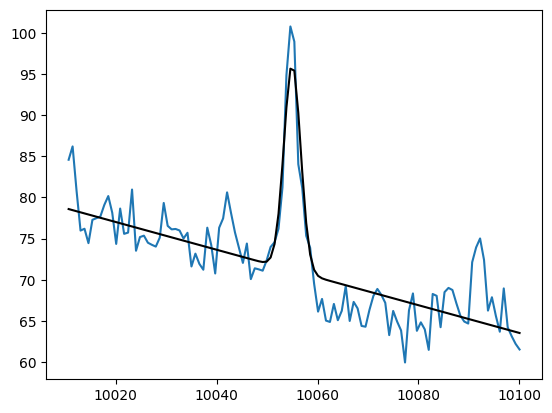

In [123]:
arc_9532 = out_arc_9532.flatchain.arc.mean()
sigma_arc_9532 = out_arc_9532.flatchain.sigma.mean()
bkg_m_9532 = out_arc_9532.flatchain.bkg_m.mean()
bkg_n_9532 = out_arc_9532.flatchain.bkg_n.mean()

plt.plot(x_arc_9532, y_arc_9532)
plt.plot(x_arc_9532, bkg_n_9532 + (bkg_m_9532 * x_arc_9532) + gaussian(x_arc_9532, arc_9532, 10055, 0, sigma_arc_9532), color='black')

### Line fitting

In [124]:
sigma_nar_9532 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9532**2))
sigma_brd_9532 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9532**2))

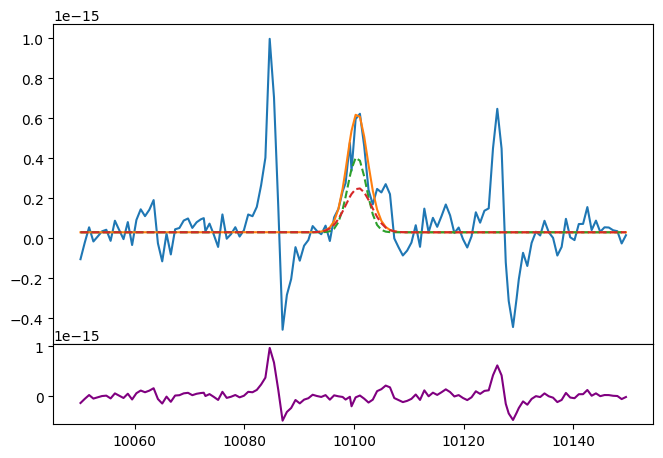

In [125]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9532.wavelength, siii_9532.flux)
bkg = 3e-17

siiia_nar = gaussian(siii_9532.wavelength, 1.6e-15, wave_cat['[SIII]9532'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, 1.3e-15, wave_cat['[SIII]9532'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9532))

ax.plot(siii_9532.wavelength, bkg + siiia_nar + siiia_brd)
ax.plot(siii_9532.wavelength, bkg + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg + siiia_brd, ls='--')
ax1.plot(siii_9532.wavelength, siii_9532.flux - bkg - siiia_nar - siiia_brd, color='purple')
#ax.set_yscale('log')

In [126]:
params_siiia = Parameters()
params_siiia.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiia.add('z_ratio', value=z_ratio, vary=False)
params_siiia.add('sigma_nar', value=upy.nominal_values(sigma_nar_9532), vary=False)
params_siiia.add('sigma_brd', value=upy.nominal_values(sigma_brd_9532), vary=False)
params_siiia.add('Siiia_nar', value=1.6e-15, min=0.)
params_siiia.add('Siiia_brd', value=1.3e-15, min=0.)
params_siiia.add('bkg', value=3e-17, min=0.)


def residual_siiia(params_siiia, x, data, uncertainty):
    
    z_nar = params_siiia['z_nar']
    z_brd = params_siiia['z_nar'] * params_siiia['z_ratio']
    sigma_nar = params_siiia['sigma_nar']
    sigma_brd = params_siiia['sigma_brd']
    siiia_nar_flux = params_siiia['Siiia_nar']
    siiia_brd_flux = params_siiia['Siiia_brd']
    bkg = params_siiia['bkg']
    
    x = siii_9532.wavelength
    model = gaussian(x, siiia_nar_flux, wave_cat['[SIII]9532'], z_nar, sigma_nar) + \
            gaussian(x, siiia_brd_flux, wave_cat['[SIII]9532'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9532.flux) / siii_9532.noise

In [127]:
np.random.seed(136)
out_siiia = minimize(residual_siiia, params_siiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:56<00:00, 44.24it/s]


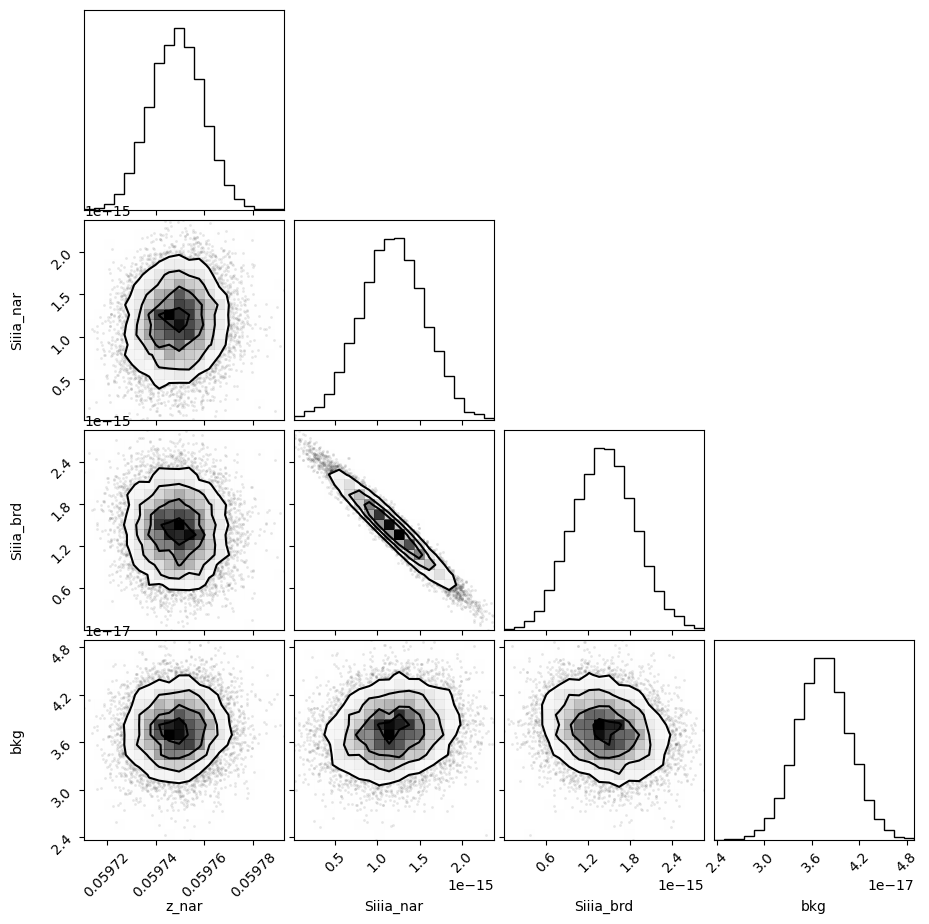

In [128]:
corner.corner(out_siiia.flatchain, labels=out_siiia.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_siiia.png')

In [129]:
out_siiia.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05974880,1.0665e-05,(0.02%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,1.69756066,,,1.6975606638042862,-inf,inf,False
sigma_brd,2.34989537,,,2.349895366649325,-inf,inf,False
Siiia_nar,1.1838e-15,3.8097e-16,(32.18%),1.6e-15,0.00000000,inf,True
Siiia_brd,1.4321e-15,4.4579e-16,(31.13%),1.3e-15,0.00000000,inf,True
bkg,3.7482e-17,3.2949e-18,(8.79%),3e-17,0.00000000,inf,True


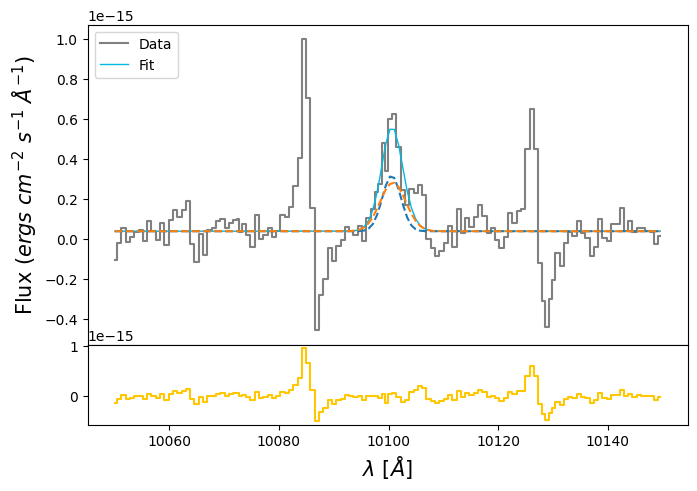

In [130]:
siiia_nar_flux = out_siiia.flatchain.Siiia_nar.mean()
siiia_nar_std = out_siiia.flatchain.Siiia_nar.std()

siiia_brd_flux = out_siiia.flatchain.Siiia_brd.mean()
siiia_brd_std = out_siiia.flatchain.Siiia_brd.std()

z_siiia = out_siiia.flatchain.z_nar.mean()
z_siiia_std = out_siiia.flatchain.z_nar.std()

bkg_siiia = out_siiia.flatchain.bkg.mean()
bkg_siiia_std = out_siiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9532.wavelength, siii_9532.flux,
            color='gray', label='Data', where='mid')

siiia_nar = gaussian(siii_9532.wavelength, siiia_nar_flux, wave_cat['[SIII]9532'], z_siiia, upy.nominal_values(sigma_nar_9532))
siiia_brd = gaussian(siii_9532.wavelength, siiia_brd_flux, wave_cat['[SIII]9532'], z_siiia * z_ratio, upy.nominal_values(sigma_brd_9532))
siiia = siiia_nar + siiia_brd

ax.plot(siii_9532.wavelength, bkg_siiia + siiia, lw=1, color=c[0], label='Fit')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_nar, ls='--')
ax.plot(siii_9532.wavelength, bkg_siiia + siiia_brd, ls='--')
ax1.step(siii_9532.wavelength, siii_9532.flux - bkg_siiia - siiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [131]:
# EW
EW_SIII_9532_nar = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532_brd = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)
EW_SIII_9532 = (ufloat(siiia_nar_flux, siiia_nar_std) + ufloat(siiia_brd_flux, siiia_brd_std)) / ufloat(bkg_siiia, bkg_siiia_std)

# [SIII]9069

### Arc lines

In [132]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_9069 = [wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 30, wave_cat['[SIII]9069']*(1 + z_BN[igal]) + 70]
mask_arc_9069 = (wcal_red[16].data['wave_soln'][0] >= wlims_9069[0]) & (wcal_red[16].data['wave_soln'][0] < wlims_9069[1])

# Arc spectra around the fitted line
x_arc_9069 = wcal_red[16].data['wave_soln'][0][mask_arc_9069]
y_arc_9069 = wcal_red[19].data[:, 7][mask_arc_9069]

100%|███████████████████████████████████████| 2500/2500 [00:44<00:00, 56.10it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 18.38229211  19.54964853 111.38570569]


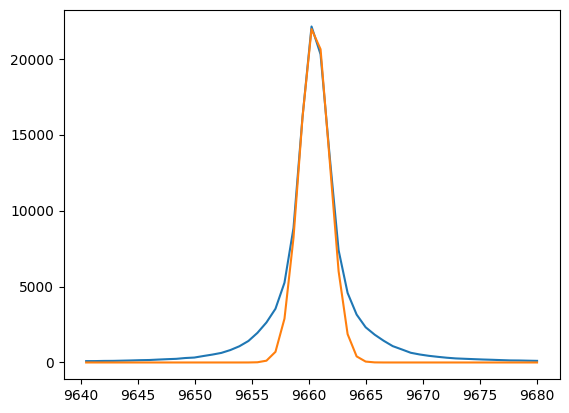

In [133]:
plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, gaussian(x_arc_9069, 73000, 9660.5, 0, 1.3))

params_arc_9069 = Parameters()
params_arc_9069.add('z', value=0.0, vary=False)
params_arc_9069.add('mu', value=9660.5, vary=False)
params_arc_9069.add('arc', value=73000, min=0.)
params_arc_9069.add('sigma', value=1.3, min=0.)
params_arc_9069.add('bkg', value=100, vary=True)

def residual_arc_9069(params_arc_9069, x, data, uncertainty):
    
    z = params_arc_9069['z']
    mu = params_arc_9069['mu']
    flux = params_arc_9069['arc']
    sigma = params_arc_9069['sigma']
    bkg = params_arc_9069['bkg']
    
    x = x_arc_9069
    model = bkg + gaussian(x, flux, mu, z, sigma)
    return (model - y_arc_9069) / 10

np.random.seed(136)
out_arc_9069 = minimize(residual_arc_9069, params_arc_9069, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

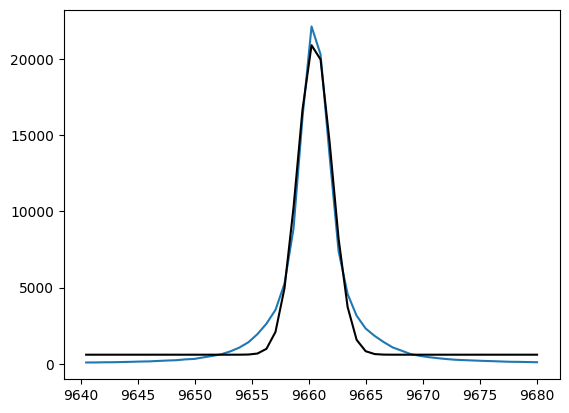

In [134]:
arc_9069 = out_arc_9069.flatchain.arc.mean()
sigma_arc_9069 = out_arc_9069.flatchain.sigma.mean()
bkg_arc_9069 = out_arc_9069.flatchain.bkg.mean()

plt.plot(x_arc_9069, y_arc_9069)
plt.plot(x_arc_9069, bkg_arc_9069 + gaussian(x_arc_9069, arc_9069, 9660.5, 0, sigma_arc_9069), color='black')

### Line fitting

In [135]:
sigma_nar_9069 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_9069**2))
sigma_brd_9069 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_9069**2))

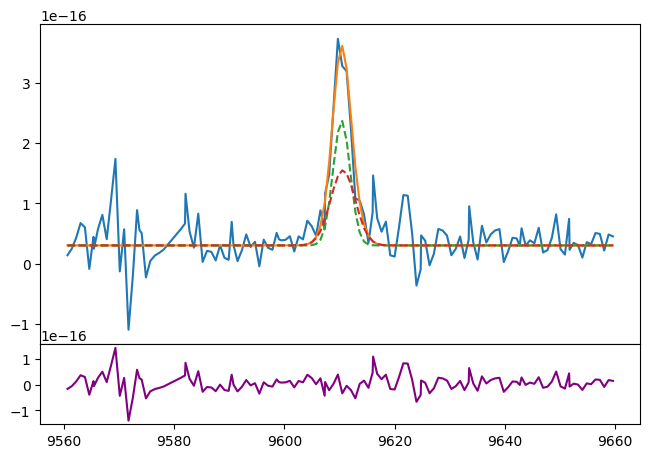

In [136]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9069.wavelength, siii_9069.flux)
bkg = 3e-17

siiib_nar = gaussian(siii_9069.wavelength, 0.8e-15, wave_cat['[SIII]9069'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, 0.7e-15, wave_cat['[SIII]9069'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_9069))

ax.plot(siii_9069.wavelength, bkg + siiib_nar + siiib_brd)
ax.plot(siii_9069.wavelength, bkg + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg + siiib_brd, ls='--')
ax1.plot(siii_9069.wavelength, siii_9069.flux - bkg - siiib_nar - siiib_brd, color='purple')
#ax.set_yscale('log')

In [137]:
params_siiib = Parameters()
params_siiib.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_siiib.add('z_ratio', value=z_ratio, vary=False)
params_siiib.add('sigma_nar', value=upy.nominal_values(sigma_nar_9069), vary=False)
params_siiib.add('sigma_brd', value=upy.nominal_values(sigma_brd_9069), vary=False)
params_siiib.add('Siiib_nar', value=0.8e-15, min=0.)
params_siiib.add('Siiib_brd', value=0.7e-15, min=0.)
params_siiib.add('bkg', value=3e-17, min=0.)


def residual_siiib(params_siiib, x, data, uncertainty):
    
    z_nar = params_siiib['z_nar']
    z_brd = params_siiib['z_nar'] * params_siiib['z_ratio']
    sigma_nar = params_siiib['sigma_nar']
    sigma_brd = params_siiib['sigma_brd']
    siiib_nar_flux = params_siiib['Siiib_nar']
    siiib_brd_flux = params_siiib['Siiib_brd']
    bkg = params_siiib['bkg']
    
    x = siii_9069.wavelength
    model = gaussian(x, siiib_nar_flux, wave_cat['[SIII]9069'], z_nar, sigma_nar) + \
            gaussian(x, siiib_brd_flux, wave_cat['[SIII]9069'], z_brd, sigma_brd)
    
    return (model + bkg - siii_9069.flux) / siii_9069.noise

In [138]:
np.random.seed(136)
out_siiib = minimize(residual_siiib, params_siiib, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:55<00:00, 44.67it/s]


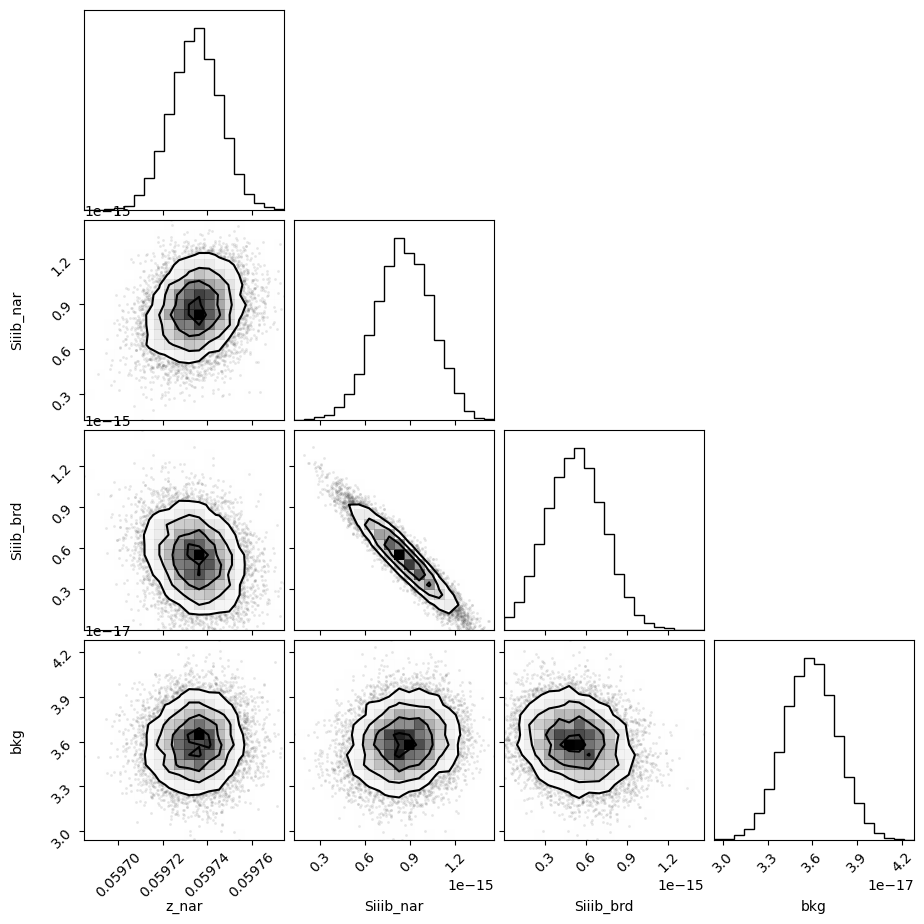

In [139]:
corner.corner(out_siiib.flatchain, labels=out_siiib.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_siiib.png')

In [140]:
out_siiib.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973483,1.1105e-05,(0.02%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,1.54198871,,,1.541988714908876,-inf,inf,False
sigma_brd,2.24009491,,,2.2400949140182975,-inf,inf,False
Siiib_nar,8.5632e-16,1.8483e-16,(21.58%),8e-16,0.00000000,inf,True
Siiib_brd,5.2421e-16,2.1079e-16,(40.21%),7e-16,0.00000000,inf,True
bkg,3.5928e-17,1.7473e-18,(4.86%),3e-17,0.00000000,inf,True


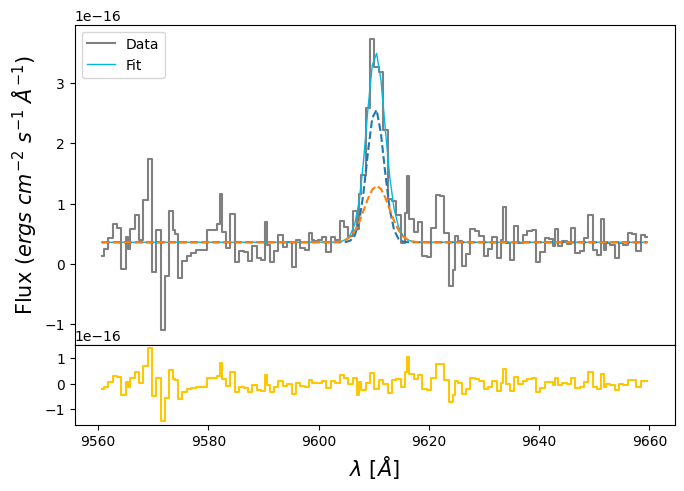

In [141]:
siiib_nar_flux = out_siiib.flatchain.Siiib_nar.mean()
siiib_nar_std = out_siiib.flatchain.Siiib_nar.std()

siiib_brd_flux = out_siiib.flatchain.Siiib_brd.mean()
siiib_brd_std = out_siiib.flatchain.Siiib_brd.std()

z_siiib = out_siiib.flatchain.z_nar.mean()
z_siiib_std = out_siiib.flatchain.z_nar.std()

bkg_siiib = out_siiib.flatchain.bkg.mean()
bkg_siiib_std = out_siiib.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9069.wavelength, siii_9069.flux,
            color='gray', label='Data', where='mid')

siiib_nar = gaussian(siii_9069.wavelength, siiib_nar_flux, wave_cat['[SIII]9069'], z_siiib, upy.nominal_values(sigma_nar_9069))
siiib_brd = gaussian(siii_9069.wavelength, siiib_brd_flux, wave_cat['[SIII]9069'], z_siiib * z_ratio, upy.nominal_values(sigma_brd_9069))
siiib = siiib_nar + siiib_brd

ax.plot(siii_9069.wavelength, bkg_siiib + siiib, lw=1, color=c[0], label='Fit')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_nar, ls='--')
ax.plot(siii_9069.wavelength, bkg_siiib + siiib_brd, ls='--')
ax1.step(siii_9069.wavelength, siii_9069.flux - bkg_siiib - siiib, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')
#plt.savefig('/home/benjamin/Desktop/fit_result_siiib.png', bbox_inches='tight', facecolor='white')

In [142]:
# EW
EW_SIII_9069_nar = ufloat(siiib_nar_flux, siiib_nar_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069_brd = ufloat(siiib_brd_flux, siiib_brd_std) / ufloat(bkg_siiib, bkg_siiib_std)
EW_SIII_9069 = (ufloat(siiib_nar_flux, siiib_nar_std) + ufloat(siiib_brd_flux, siiib_brd_std)) / ufloat(bkg_siiib, bkg_siiib_std)

# [OI]6300 + [SIII]6312

### Arc lines

In [143]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_6312 = [wave_cat['[SIII]6312']*(1 + z_BN[igal]) - 15, wave_cat['[SIII]6312']*(1 + z_BN[igal]) + 5]
mask_arc_6312 = (wcal_red[10].data['wave_soln'][0] >= wlims_6312[0]) & (wcal_red[10].data['wave_soln'][0] < wlims_6312[1])

# Arc spectra around the fitted line
x_arc_6312 = wcal_red[10].data['wave_soln'][0][mask_arc_6312]
y_arc_6312 = wcal_red[19].data[:, 4][mask_arc_6312]

100%|███████████████████████████████████████| 2500/2500 [01:22<00:00, 30.26it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [103.15588865  77.46203493  94.57943467  87.54439391  83.1357007
  77.8884208 ]


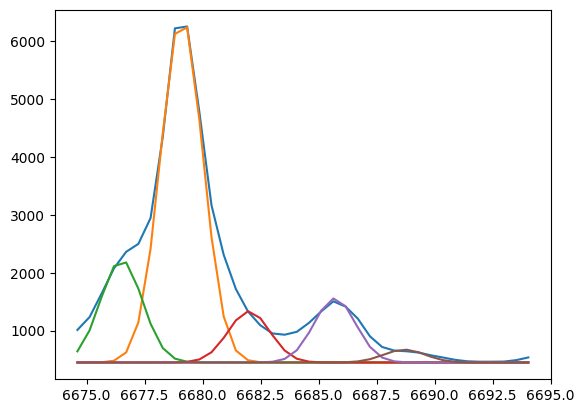

In [144]:
plt.plot(x_arc_6312, y_arc_6312)
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, 13500, 6679.1, 0, 0.9))
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, 4000, 6676.5, 0, 0.9))
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, 2000, 6682, 0, 0.9))
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, 2500, 6685.7, 0, 0.9))
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, 500, 6688.7, 0, 0.9))

params_arc_6312 = Parameters()
params_arc_6312.add('z', value=0.0, vary=False)
params_arc_6312.add('mu1', value=6679.1, vary=False)
params_arc_6312.add('mu2', value=6676.5, vary=False)
params_arc_6312.add('mu3', value=6682, vary=False)
params_arc_6312.add('mu4', value=6685.7, vary=False)
params_arc_6312.add('mu5', value=6688.7, vary=False)
params_arc_6312.add('arc1', value=13500, min=0.)
params_arc_6312.add('arc2', value=4000, min=0.)
params_arc_6312.add('arc3', value=2000, min=0.)
params_arc_6312.add('arc4', value=2500, min=0.)
params_arc_6312.add('arc5', value=500, min=0.)
params_arc_6312.add('sigma', value=0.9, min=0.)
params_arc_6312.add('bkg', value=450, vary=False)

def residual_arc_6312(params_arc_6312, x, data, uncertainty):
    
    z = params_arc_6312['z']
    mu1 = params_arc_6312['mu1']
    mu2 = params_arc_6312['mu2']
    mu3 = params_arc_6312['mu3']
    mu4 = params_arc_6312['mu4']
    mu5 = params_arc_6312['mu5']
    flux1 = params_arc_6312['arc1']
    flux2 = params_arc_6312['arc2']
    flux3 = params_arc_6312['arc3']
    flux4 = params_arc_6312['arc4']
    flux5 = params_arc_6312['arc5']
    sigma = params_arc_6312['sigma']
    bkg = params_arc_6312['bkg']
    
    x = x_arc_6312
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5
    return (model - y_arc_6312) / 10

np.random.seed(136)
out_arc_6312 = minimize(residual_arc_6312, params_arc_6312, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

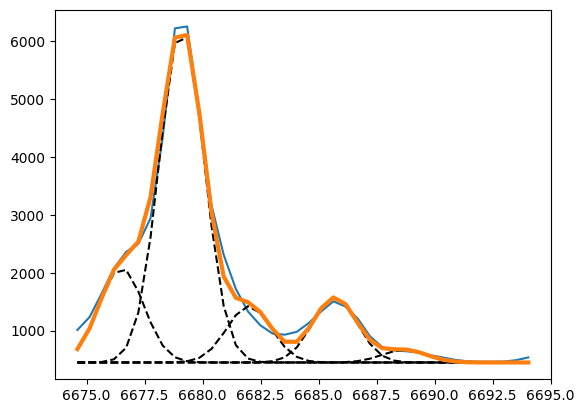

In [145]:
arc1_6312 = out_arc_6312.flatchain.arc1.mean()
arc2_6312 = out_arc_6312.flatchain.arc2.mean()
arc3_6312 = out_arc_6312.flatchain.arc3.mean()
arc4_6312 = out_arc_6312.flatchain.arc4.mean()
arc5_6312 = out_arc_6312.flatchain.arc5.mean()
sigma_arc_6312 = out_arc_6312.flatchain.sigma.mean()

plt.plot(x_arc_6312, y_arc_6312)
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc1_6312, 6679.1, 0, sigma_arc_6312), color='black', ls='--')
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc2_6312, 6676.5, 0, sigma_arc_6312), color='black', ls='--')
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc3_6312, 6682, 0, sigma_arc_6312), color='black', ls='--')
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc4_6312, 6685.7, 0, sigma_arc_6312), color='black', ls='--')
plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc5_6312, 6688.7, 0, sigma_arc_6312), color='black', ls='--')

plt.plot(x_arc_6312, 450 + gaussian(x_arc_6312, arc1_6312, 6679.1, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc2_6312, 6676.5, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc3_6312, 6682, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc4_6312, 6685.7, 0, sigma_arc_6312) \
         + gaussian(x_arc_6312, arc5_6312, 6688.7, 0, sigma_arc_6312), lw=3
)

### Line fitting

In [146]:
sigma_nar_6312 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_6312**2))
sigma_brd_6312 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6312**2))

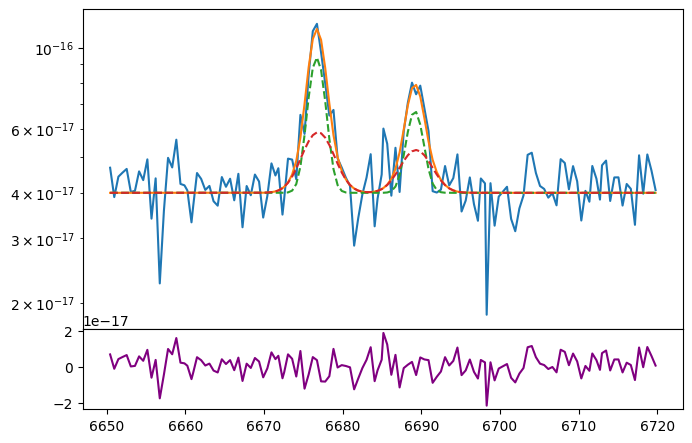

In [147]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 4.0e-17

oi_nar = gaussian(oi_siii.wavelength, 1.4e-16, wave_cat['[OI]6300'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, 0.9e-16, wave_cat['[OI]6300'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, 0.7e-16, wave_cat['[SIII]6312'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, 0.6e-16, wave_cat['[SIII]6312'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_nar + siiic_brd + oi_nar + oi_brd)
ax.plot(oi_siii.wavelength, bkg + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg + siiic_brd + oi_brd, ls='--')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_nar - siiic_brd - oi_nar - oi_brd, color='purple')
ax.set_yscale('log')

In [148]:
params_oi_siii = Parameters()
params_oi_siii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oi_siii.add('z_ratio', value=z_ratio, vary=False)
params_oi_siii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('Oi_nar', value=1.4e-16, min=0.)
params_oi_siii.add('Oi_brd', value=0.9e-16, min=0.)
params_oi_siii.add('Siiic_nar', value=0.7e-16, min=0.)
params_oi_siii.add('Siiic_brd', value=0.6e-16, min=0.)
params_oi_siii.add('bkg', value=4.0e-17, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_nar = params_oi_siii['z_nar']
    z_brd = params_oi_siii['z_nar'] * params_oi_siii['z_ratio']
    sigma_nar = params_oi_siii['sigma_nar']
    sigma_brd = params_oi_siii['sigma_brd']
    oi_nar = params_oi_siii['Oi_nar']
    oi_brd = params_oi_siii['Oi_brd']
    siiic_nar = params_oi_siii['Siiic_nar']
    siiic_brd = params_oi_siii['Siiic_brd']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_nar, wave_cat['[OI]6300'], z_nar, sigma_nar) \
             + gaussian(x, oi_brd, wave_cat['[OI]6300'], z_brd, sigma_brd)
    model_siii = gaussian(x, siiic_nar, wave_cat['[SIII]6312'], z_nar, sigma_nar) \
               + gaussian(x, siiic_brd, wave_cat['[SIII]6312'], z_brd, sigma_brd)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [149]:
np.random.seed(136)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:08<00:00, 36.65it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [49.88085834 57.72766122 56.53763297 68.72000328 68.37732159 57.6852836 ]


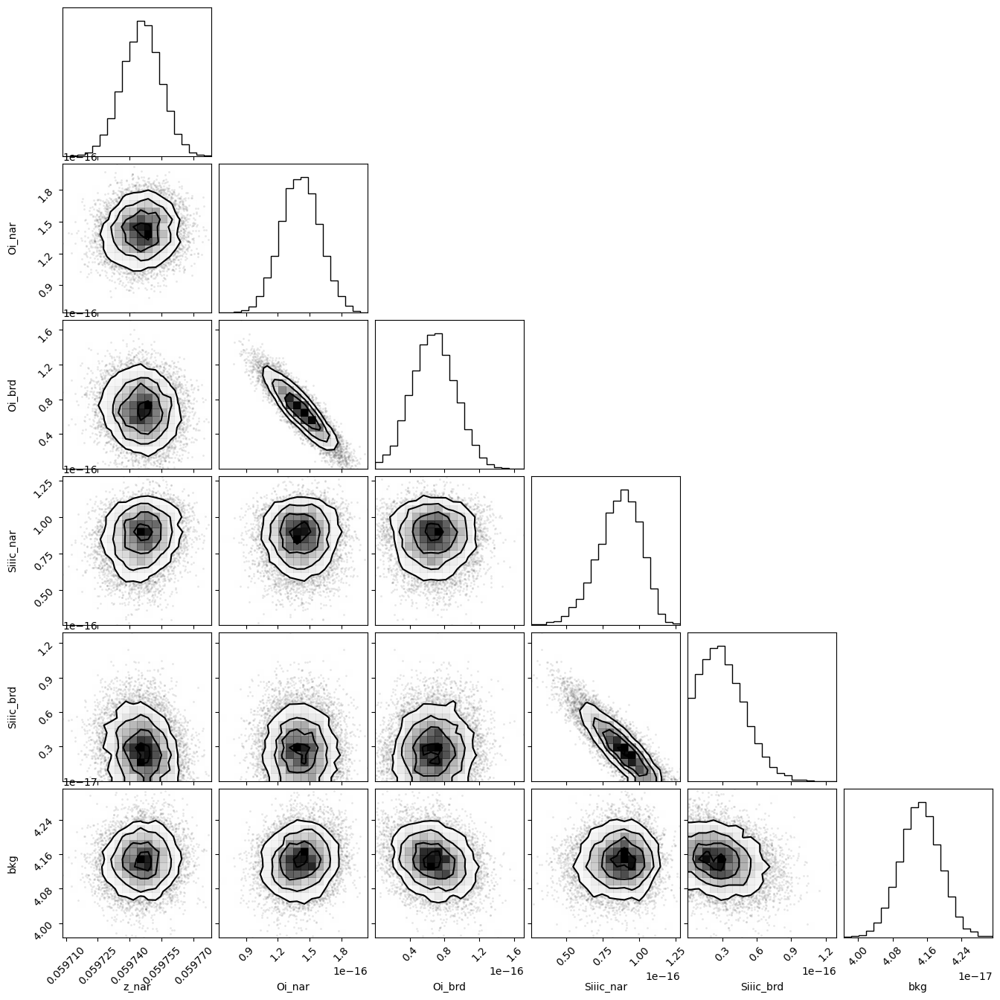

In [150]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_oi_siiic.png')

In [151]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05974567,9.1089e-06,(0.02%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,1.03330007,,,1.0333000735304219,-inf,inf,False
sigma_brd,1.92561810,,,1.925618100471195,-inf,inf,False
Oi_nar,1.4134e-16,1.8522e-17,(13.11%),1.4e-16,0.00000000,inf,True
Oi_brd,6.7584e-17,2.5153e-17,(37.22%),9e-17,0.00000000,inf,True
Siiic_nar,8.7169e-17,1.4978e-17,(17.18%),7e-17,0.00000000,inf,True
Siiic_brd,2.9029e-17,1.9613e-17,(67.56%),6e-17,0.00000000,inf,True
bkg,4.1445e-17,4.6885e-19,(1.13%),4e-17,0.00000000,inf,True


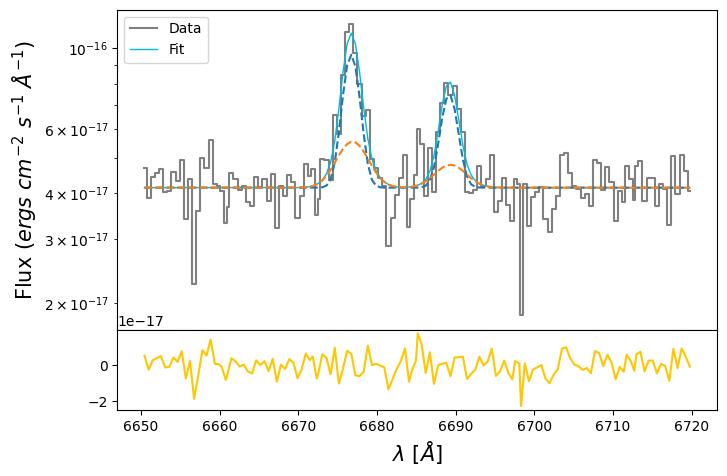

In [152]:
oi_nar_flux = out_oi_siii.flatchain.Oi_nar.mean()
oi_nar_std = out_oi_siii.flatchain.Oi_nar.std()

oi_brd_flux = out_oi_siii.flatchain.Oi_brd.mean()
oi_brd_std = out_oi_siii.flatchain.Oi_brd.std()

siiic_nar_flux = out_oi_siii.flatchain.Siiic_nar.mean()
siiic_nar_std = out_oi_siii.flatchain.Siiic_nar.std()

siiic_brd_flux = out_oi_siii.flatchain.Siiic_brd.mean()
siiic_brd_std = out_oi_siii.flatchain.Siiic_brd.std()

z_oi_siii = out_oi_siii.flatchain.z_nar.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_nar.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oi_nar = gaussian(oi_siii.wavelength, oi_nar_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, oi_brd_flux, wave_cat['[OI]6300'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, siiic_nar_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, siiic_brd_flux, wave_cat['[SIII]6312'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

oi = oi_nar + oi_brd
siiic = siiic_nar + siiic_brd

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oi,
        lw=1, color=c[0], label='Fit')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_brd + oi_brd, ls='--')

ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oi,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

#plt.savefig('/home/benjamin/Desktop/fitresult_oi_siiic.png', bbox_inches='tight', facecolor='white')

In [153]:
# EW
EW_OI_6300_nar = ufloat(oi_nar_flux, oi_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300_brd = ufloat(oi_brd_flux, oi_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300 = (ufloat(oi_nar_flux, oi_nar_std) + ufloat(oi_brd_flux, oi_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

EW_SIII_6312_nar = ufloat(siiic_nar_flux, siiic_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312_brd = ufloat(siiic_brd_flux, siiic_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = (ufloat(siiic_nar_flux, siiic_nar_std) + ufloat(siiic_brd_flux, siiic_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [OIII]5007 + HeI 5015

### Arc lines

In [154]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_5007 = [wave_cat['[OIII]5007']*(1 + z_BN[igal]) - 10, wave_cat['[OIII]5007']*(1 + z_BN[igal]) + 10]
mask_arc_5007 = (wcal_red[4].data['wave_soln'][0] >= wlims_5007[0]) & (wcal_red[4].data['wave_soln'][0] < wlims_5007[1])

# Arc spectra around the fitted line
x_arc_5007 = wcal_red[4].data['wave_soln'][0][mask_arc_5007]
y_arc_5007 = wcal_red[19].data[:, 1][mask_arc_5007]

100%|███████████████████████████████████████| 2500/2500 [01:18<00:00, 31.77it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 8 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [86.37059196 59.48814932 76.87122555 65.15474377 57.58585814 59.29049478
 80.59889624 73.63211108]


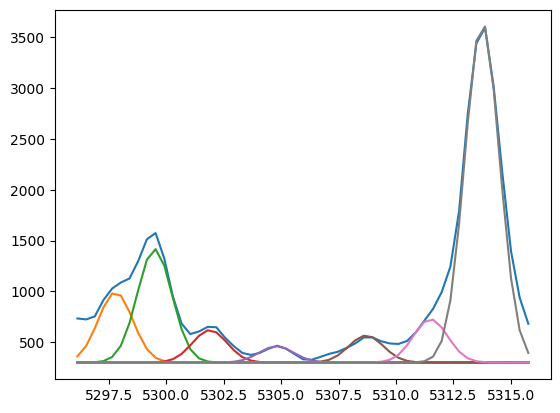

In [155]:
plt.plot(x_arc_5007, y_arc_5007)
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 1300, 5297.8, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 2100, 5299.5, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 600, 5301.9, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 300, 5304.8, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 500, 5308.7, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 800, 5311.5, 0, 0.75))
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, 6300, 5313.75, 0, 0.75))

params_arc_5007 = Parameters()
params_arc_5007.add('z', value=0.0, vary=False)
params_arc_5007.add('mu1', value=5297.8, vary=False)
params_arc_5007.add('mu2', value=5299.5, vary=False)
params_arc_5007.add('mu3', value=5301.9, vary=False)
params_arc_5007.add('mu4', value=5304.8, vary=False)
params_arc_5007.add('mu5', value=5308.7, vary=False)
params_arc_5007.add('mu6', value=5311.5, vary=False)
params_arc_5007.add('mu7', value=5313.75, vary=False)
params_arc_5007.add('arc1', value=1300, min=0.)
params_arc_5007.add('arc2', value=2100, min=0.)
params_arc_5007.add('arc3', value=600, min=0.)
params_arc_5007.add('arc4', value=300, min=0.)
params_arc_5007.add('arc5', value=500, min=0.)
params_arc_5007.add('arc6', value=800, min=0.)
params_arc_5007.add('arc7', value=6300, min=0.)
params_arc_5007.add('sigma', value=0.75, min=0.)
params_arc_5007.add('bkg', value=300, vary=False)

def residual_arc_5007(params_arc_5007, x, data, uncertainty):
    
    z = params_arc_5007['z']
    mu1 = params_arc_5007['mu1']
    mu2 = params_arc_5007['mu2']
    mu3 = params_arc_5007['mu3']
    mu4 = params_arc_5007['mu4']
    mu5 = params_arc_5007['mu5']
    mu6 = params_arc_5007['mu6']
    mu7 = params_arc_5007['mu7']
    flux1 = params_arc_5007['arc1']
    flux2 = params_arc_5007['arc2']
    flux3 = params_arc_5007['arc3']
    flux4 = params_arc_5007['arc4']
    flux5 = params_arc_5007['arc5']
    flux6 = params_arc_5007['arc6']
    flux7 = params_arc_5007['arc7']
    sigma = params_arc_5007['sigma']
    bkg = params_arc_5007['bkg']
    
    x = x_arc_5007
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model7 = gaussian(x, flux7, mu7, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6 + model7
    return (model - y_arc_5007) / 10

np.random.seed(136)
out_arc_5007 = minimize(residual_arc_5007, params_arc_5007, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

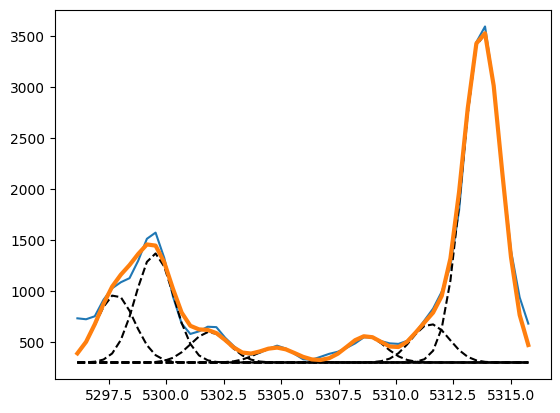

In [156]:
arc1_5007 = out_arc_5007.flatchain.arc1.mean()
arc2_5007 = out_arc_5007.flatchain.arc2.mean()
arc3_5007 = out_arc_5007.flatchain.arc3.mean()
arc4_5007 = out_arc_5007.flatchain.arc4.mean()
arc5_5007 = out_arc_5007.flatchain.arc5.mean()
arc6_5007 = out_arc_5007.flatchain.arc6.mean()
arc7_5007 = out_arc_5007.flatchain.arc7.mean()
sigma_arc_5007 = out_arc_5007.flatchain.sigma.mean()

plt.plot(x_arc_5007, y_arc_5007)
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc1_5007, 5297.8, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc2_5007, 5299.5, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc3_5007, 5301.9, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc4_5007, 5304.8, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc5_5007, 5308.7, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc6_5007, 5311.5, 0, sigma_arc_5007), color='black', ls='--')
plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc7_5007, 5313.75, 0, sigma_arc_5007), color='black', ls='--')

plt.plot(x_arc_5007, 300 + gaussian(x_arc_5007, arc1_5007, 5297.8, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc2_5007, 5299.5, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc3_5007, 5301.9, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc4_5007, 5304.8, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc5_5007, 5308.7, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc6_5007, 5311.5, 0, sigma_arc_5007) \
         + gaussian(x_arc_5007, arc7_5007, 5313.75, 0, sigma_arc_5007), lw=3
)

### Line fitting

In [157]:
sigma_nar_5007 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_5007**2))
sigma_brd_5007 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5007**2))

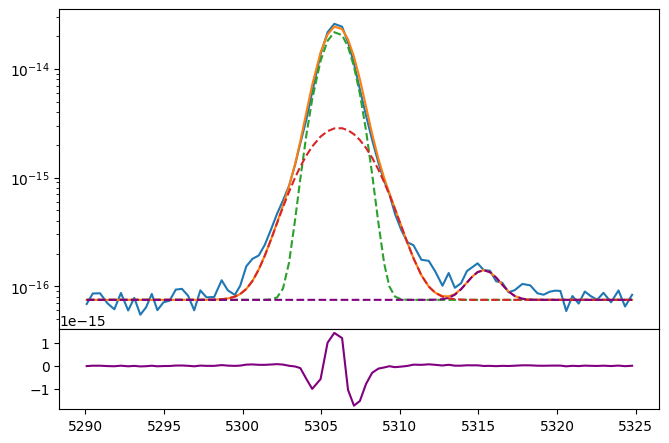

In [158]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 7.5e-17

oiiia_nar = gaussian(oiii_hei.wavelength, 5e-14, wave_cat['[OIII]5007'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, 1.3e-14, wave_cat['[OIII]5007'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5007))

hei_5015 = gaussian(oiii_hei.wavelength, 1.5e-16, wave_cat['HeI5015'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5007))

ax.plot(oiii_hei.wavelength, bkg + oiiia_nar + oiiia_brd + hei_5015)
ax.plot(oiii_hei.wavelength, bkg + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg + hei_5015, ls='--', color='purple')
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_nar - oiiia_brd - hei_5015, color='purple')
ax.set_yscale('log')

In [159]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiii_hei.add('z_ratio', value=z_ratio, vary=False)
params_oiii_hei.add('sigma_nar', value=upy.nominal_values(sigma_nar_5007), vary=False)
params_oiii_hei.add('sigma_brd', value=upy.nominal_values(sigma_brd_5007), vary=False)
params_oiii_hei.add('Hei', value=1.5e-16, min=0.)
params_oiii_hei.add('Oiiia_nar', value=5.0e-14, min=0.)
params_oiii_hei.add('Oiiia_brd', value=1.3e-14, min=0.)
params_oiii_hei.add('bkg', value=7.5e-17, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_nar = params_oiii_hei['z_nar']
    z_brd = params_oiii_hei['z_nar'] * params_oiii_hei['z_ratio']
    sigma_nar = params_oiii_hei['sigma_nar']
    sigma_brd = params_oiii_hei['sigma_brd']
    oiiia_nar = params_oiii_hei['Oiiia_nar']
    oiiia_brd = params_oiii_hei['Oiiia_brd']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_nar, wave_cat['[OIII]5007'], z_nar, sigma_nar) \
               + gaussian(x, oiiia_brd, wave_cat['[OIII]5007'], z_brd, sigma_brd)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_nar, sigma_nar)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [160]:
np.random.seed(136)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:44<00:00, 56.12it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 38.04458849  80.37782631  95.82001928  96.85787947 133.01371115]


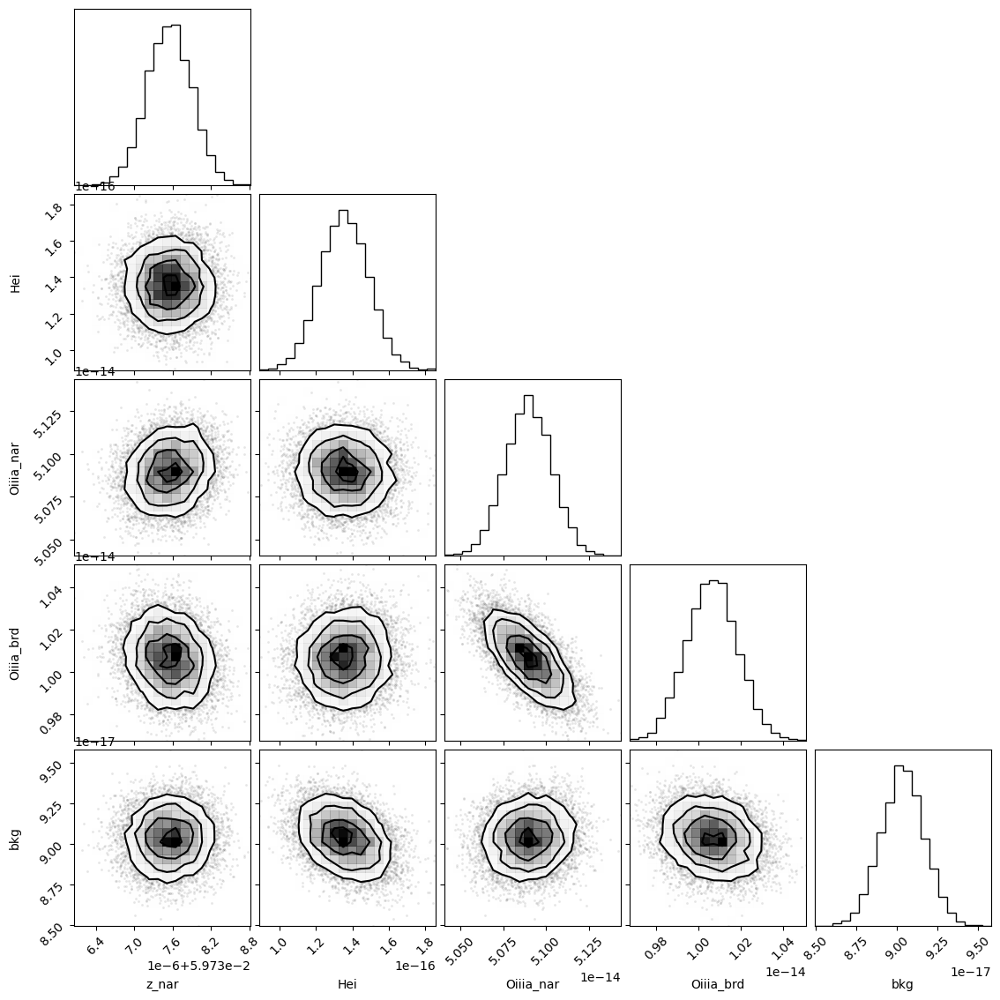

In [161]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_oiiia.png')

In [162]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973755,3.4596e-07,(0.00%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.91150561,,,0.9115056095561984,-inf,inf,False
sigma_brd,1.86309917,,,1.8630991662165315,-inf,inf,False
Hei,1.3551e-16,1.3311e-17,(9.82%),1.5e-16,0.00000000,inf,True
Oiiia_nar,5.0898e-14,1.3468e-16,(0.26%),5e-14,0.00000000,inf,True
Oiiia_brd,1.0064e-14,1.2123e-16,(1.20%),1.3e-14,0.00000000,inf,True
bkg,9.0375e-17,1.3278e-18,(1.47%),7.5e-17,0.00000000,inf,True


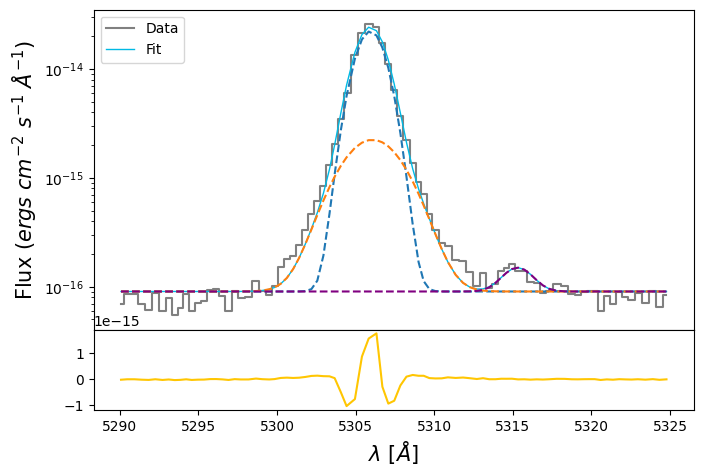

In [163]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_nar_flux = out_oiii_hei.flatchain.Oiiia_nar.mean()
oiiia_nar_std = out_oiii_hei.flatchain.Oiiia_nar.std()

oiiia_brd_flux = out_oiii_hei.flatchain.Oiiia_brd.mean()
oiiia_brd_std = out_oiii_hei.flatchain.Oiiia_brd.std()

z_oiii_hei = out_oiii_hei.flatchain.z_nar.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_nar.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))

oiiia_nar = gaussian(oiii_hei.wavelength, oiiia_nar_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, oiiia_brd_flux, wave_cat['[OIII]5007'], z_oiii_hei * z_ratio, upy.nominal_values(sigma_brd_5007))

oiiia = oiiia_nar + oiiia_brd

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')
#plt.savefig('/home/benjamin/Desktop/fitresult_oiiia.png', bbox_inches='tight', facecolor='white')

In [164]:
# EW
EW_OIII_5007_nar = ufloat(oiiia_nar_flux, oiiia_nar_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007_brd = ufloat(oiiia_brd_flux, oiiia_brd_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007 = (ufloat(oiiia_nar_flux, oiiia_nar_std) + ufloat(oiiia_brd_flux, oiiia_brd_std)) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [OIII]4363

### Arc lines

In [165]:
# Select a region of the arc spectra to have a few arc lines around the wavelength of the fitted lines
wlims_4363 = [wave_cat['[OIII]4363']*(1 + z_BN[igal]) , wave_cat['[OIII]4363']*(1 + z_BN[igal]) + 10]
mask_arc_4363 = (wcal_blue[10].data['wave_soln'][0] >= wlims_4363[0]) & (wcal_blue[10].data['wave_soln'][0] < wlims_4363[1])

# Arc spectra around the fitted line
x_arc_4363 = wcal_blue[10].data['wave_soln'][0][mask_arc_4363]
y_arc_4363 = wcal_blue[25].data[:, 4][mask_arc_4363]

100%|███████████████████████████████████████| 2500/2500 [00:54<00:00, 45.71it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [62.78361584 60.90289532 62.01736755 67.11093665 65.18985315 65.10853317
 68.55676399]


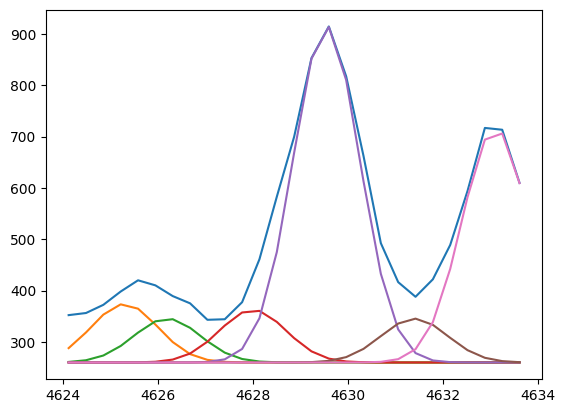

In [166]:
plt.plot(x_arc_4363, y_arc_4363)
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 200, 4625.3, 0, 0.7))
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 150, 4626.2, 0, 0.7))
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 180, 4628, 0, 0.7))
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 1150, 4629.55, 0, 0.7))
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 150, 4631.4, 0, 0.7))
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, 800, 4633.1, 0, 0.7))

params_arc_4363 = Parameters()
params_arc_4363.add('z', value=0.0, vary=False)
params_arc_4363.add('mu1', value=4625.3, vary=False)
params_arc_4363.add('mu2', value=4626.2, vary=False)
params_arc_4363.add('mu3', value=4628, vary=False)
params_arc_4363.add('mu4', value=4629.55, vary=False)
params_arc_4363.add('mu5', value=4631.4, vary=False)
params_arc_4363.add('mu6', value=4633.1, vary=False)
params_arc_4363.add('arc1', value=200, min=0.)
params_arc_4363.add('arc2', value=150, min=0.)
params_arc_4363.add('arc3', value=180, min=0.)
params_arc_4363.add('arc4', value=1150, min=0.)
params_arc_4363.add('arc5', value=150, min=0.)
params_arc_4363.add('arc6', value=800, min=0.)
params_arc_4363.add('sigma', value=0.7, min=0.)
params_arc_4363.add('bkg', value=260, vary=False)

def residual_arc_4363(params_arc_4363, x, data, uncertainty):
    
    z = params_arc_4363['z']
    mu1 = params_arc_4363['mu1']
    mu2 = params_arc_4363['mu2']
    mu3 = params_arc_4363['mu3']
    mu4 = params_arc_4363['mu4']
    mu5 = params_arc_4363['mu5']
    mu6 = params_arc_4363['mu6']
    flux1 = params_arc_4363['arc1']
    flux2 = params_arc_4363['arc2']
    flux3 = params_arc_4363['arc3']
    flux4 = params_arc_4363['arc4']
    flux5 = params_arc_4363['arc5']
    flux6 = params_arc_4363['arc6']
    sigma = params_arc_4363['sigma']
    bkg = params_arc_4363['bkg']
    
    x = x_arc_4363
    model1 = gaussian(x, flux1, mu1, z, sigma)
    model2 = gaussian(x, flux2, mu2, z, sigma)
    model3 = gaussian(x, flux3, mu3, z, sigma)
    model4 = gaussian(x, flux4, mu4, z, sigma)
    model5 = gaussian(x, flux5, mu5, z, sigma)
    model6 = gaussian(x, flux6, mu6, z, sigma)
    model = bkg + model1 + model2 + model3 + model4 + model5 + model6
    return (model - y_arc_4363) / 10

np.random.seed(136)
out_arc_4363 = minimize(residual_arc_4363, params_arc_4363, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

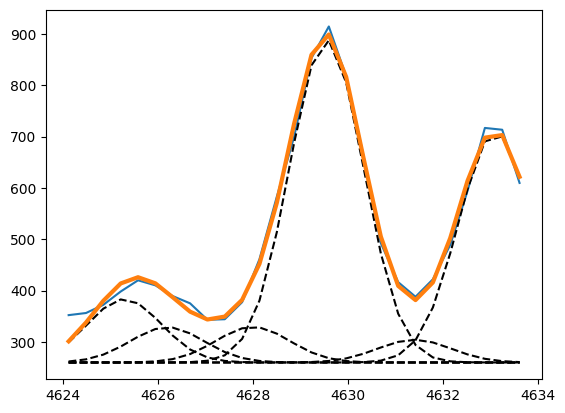

In [167]:
arc1_4363 = out_arc_4363.flatchain.arc1.mean()
arc2_4363 = out_arc_4363.flatchain.arc2.mean()
arc3_4363 = out_arc_4363.flatchain.arc3.mean()
arc4_4363 = out_arc_4363.flatchain.arc4.mean()
arc5_4363 = out_arc_4363.flatchain.arc5.mean()
arc6_4363 = out_arc_4363.flatchain.arc6.mean()
sigma_arc_4363 = out_arc_4363.flatchain.sigma.mean()

plt.plot(x_arc_4363, y_arc_4363)
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc1_4363, 4625.3, 0, sigma_arc_4363), color='black', ls='--')
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc2_4363, 4626.2, 0, sigma_arc_4363), color='black', ls='--')
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc3_4363, 4628, 0, sigma_arc_4363), color='black', ls='--')
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc4_4363, 4629.55, 0, sigma_arc_4363), color='black', ls='--')
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc5_4363, 4631.4, 0, sigma_arc_4363), color='black', ls='--')
plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc6_4363, 4633.1, 0, sigma_arc_4363), color='black', ls='--')

plt.plot(x_arc_4363, 260 + gaussian(x_arc_4363, arc1_4363, 4625.3, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc2_4363, 4626.2, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc3_4363, 4628, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc4_4363, 4629.55, 0, sigma_arc_4363)\
         + gaussian(x_arc_4363, arc5_4363, 4631.4, 0, sigma_arc_4363) \
         + gaussian(x_arc_4363, arc6_4363, 4633.1, 0, sigma_arc_4363), lw=3
)

### Line fitting

In [168]:
sigma_nar_4363 = upy.sqrt((sigma_nar_intrinsic**2) + (sigma_arc_4363**2))
sigma_brd_4363 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4363**2))

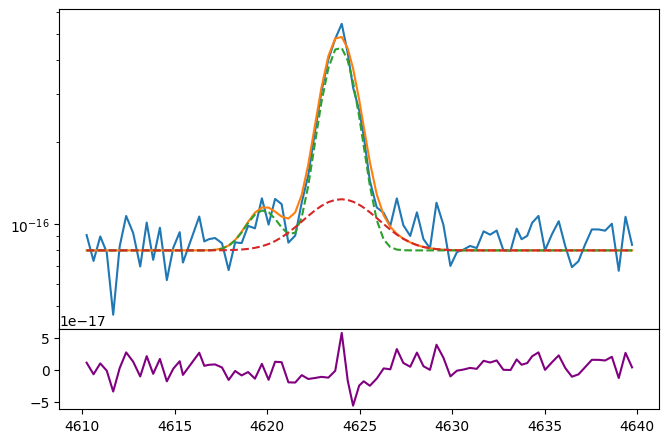

In [169]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 8e-17

feii_4360 = gaussian(oiii_4363.wavelength, 0.7e-16, wave_cat['[FeII]4360'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, 8e-16, wave_cat['[OIII]4363'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, 2e-16, wave_cat['[OIII]4363'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + oiiic_brd + feii_4360)
ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg + oiiic_brd, ls='--')
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_nar - oiiic_brd - feii_4360, color='purple')
ax.set_yscale('log')

In [170]:
params_oiiic = Parameters()

params_oiiic.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiiic.add('z_ratio', value=z_ratio, vary=False)
params_oiiic.add('sigma_nar', value=upy.nominal_values(sigma_nar_4363), vary=False)
params_oiiic.add('sigma_brd', value=upy.nominal_values(sigma_brd_4363), vary=False)
params_oiiic.add('Feii_4360_nar', value=0.7e-16, min=0.)
params_oiiic.add('Oiiic_nar', value=8e-16, min=0.)
params_oiiic.add('Oiiic_brd', value=2e-16, min=0.)
params_oiiic.add('bkg', value=8e-17, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_nar = params_oiiic['z_nar']
    z_brd = params_oiiic['z_nar'] * params_oiiic['z_ratio']
    sigma_nar = params_oiiic['sigma_nar']
    sigma_brd = params_oiiic['sigma_brd']
    feii_4360_flux = params_oiiic['Feii_4360_nar']
    oiiic_nar_flux = params_oiiic['Oiiic_nar']
    oiiic_brd_flux = params_oiiic['Oiiic_brd']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_nar_flux, wave_cat['[OIII]4363'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_brd_flux, wave_cat['[OIII]4363'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [171]:
np.random.seed(136)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:29<00:00, 83.72it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [48.84479349 52.17542993 53.98200217 62.22352327 58.88730768]


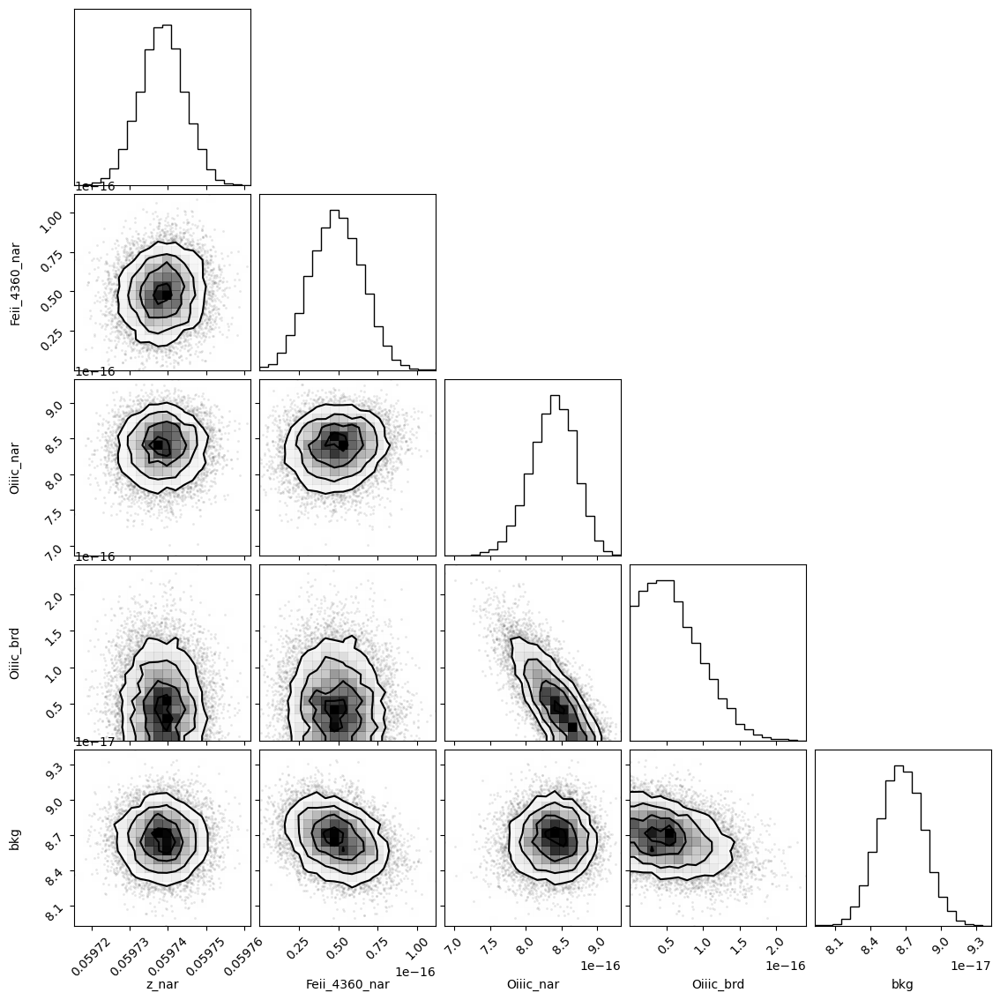

In [172]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig('/home/benjamin/Desktop/corner_oiiic.png')

In [173]:
out_oiiic.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05973858,5.8731e-06,(0.01%),0.059743843974085,-inf,inf,True
z_ratio,1.00044122,,,1.000441215303235,-inf,inf,False
sigma_nar,0.86612956,,,0.8661295560971125,-inf,inf,False
sigma_brd,1.84132464,,,1.8413246413517903,-inf,inf,False
Feii_4360_nar,4.8921e-17,1.6588e-17,(33.91%),7e-17,0.00000000,inf,True
Oiiic_nar,8.3938e-16,3.0838e-17,(3.67%),8e-16,0.00000000,inf,True
Oiiic_brd,5.4159e-17,4.1410e-17,(76.46%),2e-16,0.00000000,inf,True
bkg,8.6623e-17,1.9113e-18,(2.21%),8e-17,0.00000000,inf,True


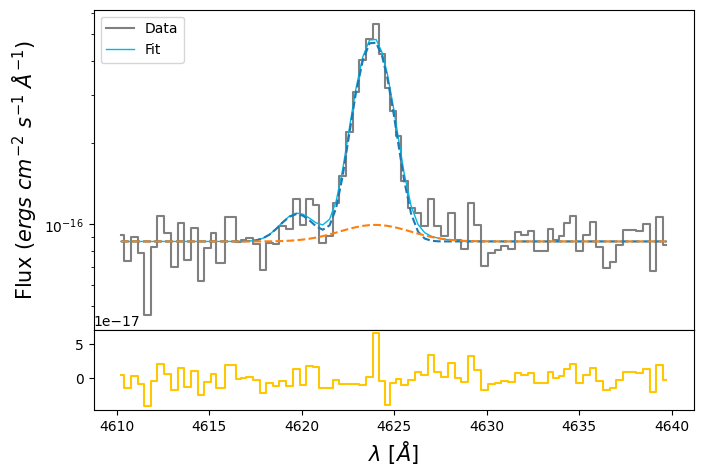

In [174]:
oiiic_nar_flux = out_oiiic.flatchain.Oiiic_nar.mean()
oiiic_nar_std = out_oiiic.flatchain.Oiiic_nar.std()

oiiic_brd_flux = out_oiiic.flatchain.Oiiic_brd.mean()
oiiic_brd_std = out_oiiic.flatchain.Oiiic_brd.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_nar.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_nar.std()

z_oiii = out_oiiic.flatchain.z_nar.mean()
z_oiii_std = out_oiiic.flatchain.z_nar.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_brd, ls='--')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')
#plt.savefig('/home/benjamin/Desktop/fitresult_oiiic.png', bbox_inches='tight', facecolor='white')

In [175]:
# EW
EW_OIII_4363_nar = ufloat(oiiic_nar_flux, oiiic_nar_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363_brd = ufloat(oiiic_brd_flux, oiiic_brd_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363 = (ufloat(oiiic_nar_flux, oiiic_nar_std) + ufloat(oiiic_brd_flux, oiiic_brd_std)) / ufloat(bkg_oiiic, bkg_oiiic_std)

# Saving Arc data

In [176]:
sigma_arc = np.array([sigma_arc_3729, # 16 blue
                      sigma_arc_hd,
                      sigma_arc_hg,
                      sigma_arc_4363, # 13 blue
                      sigma_arc_hb, # 12
                      sigma_arc_4959, # 12
                      sigma_arc_5007, # 12
                      sigma_arc_6312, # 9
                      sigma_arc_ha, # 9
                      sigma_arc_6730, # 9
                      sigma_arc_7330, # 8
                      sigma_arc_9069, # 6
                      sigma_arc_9532]) # 6

x_arc = np.array([np.median(x_arc_3729),
                  np.median(x_arc_hd),
                  np.median(x_arc_hg),
                  np.median(x_arc_4363),
                  np.median(x_arc_hb),
                  np.median(x_arc_4959),
                  np.median(x_arc_5007),
                  np.median(x_arc_6312),
                  np.median(x_arc_ha),
                  np.median(x_arc_6730),
                  np.median(x_arc_7330),
                  np.median(x_arc_9069),
                  np.median(x_arc_9532)])

In [177]:
params_sigma_arc = Parameters()
params_sigma_arc.add('m', value=(sigma_arc[-1] - sigma_arc[0])/(x_arc[-1] - x_arc[0]))
params_sigma_arc.add('n', value=-0.2)

def residual_sigma_arc(params_sigma_arc, x, data, uncertainty):
    
    m = params_sigma_arc['m']
    n = params_sigma_arc['n']
    
    x = x_arc
    model = (m * x_arc) + n
    return (model - sigma_arc) / 0.05

np.random.seed(136)
out_sigma_arc = minimize(residual_sigma_arc, params_sigma_arc, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:15<00:00, 161.00it/s]


In [178]:
lmfit.report_fit(out_sigma_arc.params)

[[Variables]]
    m:  1.6064e-04 +/- 7.3217e-06 (4.56%) (init = 0.000184433)
    n: -0.04641747 +/- 0.04768681 (102.73%) (init = -0.2)
[[Correlations]] (unreported correlations are < 0.100)
    C(m, n) = -0.9573


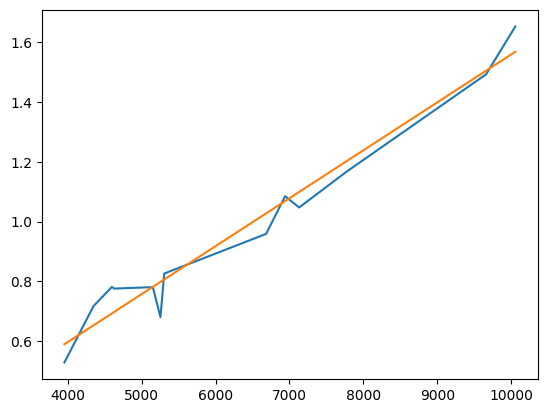

In [179]:
m = out_sigma_arc.flatchain.m.mean()
n = out_sigma_arc.flatchain.n.mean()

plt.plot(x_arc, sigma_arc)
plt.plot(x_arc, (m * x_arc) + n)

In [180]:
sigma_arc_16 = np.array([sigma_arc_3729])
sigma_arc_13 = np.array([sigma_arc_4363])
sigma_arc_12 = np.array([sigma_arc_hb, sigma_arc_4959, sigma_arc_5007])
sigma_arc_9 = np.array([sigma_arc_6312, sigma_arc_ha, sigma_arc_6730])
sigma_arc_8 = np.array([sigma_arc_7330])
sigma_arc_6 = np.array([sigma_arc_9069, sigma_arc_9532])

x_arc_16 = np.array([np.median(x_arc_3729)])
x_arc_13 = np.array([np.median(x_arc_4363)])
x_arc_12 = np.array([np.median(x_arc_hb), np.median(x_arc_4959), np.median(x_arc_5007)])
x_arc_9 = np.array([np.median(x_arc_6312), np.median(x_arc_ha), np.median(x_arc_6730)])
x_arc_8 = np.array([np.median(x_arc_7330)])
x_arc_6 = np.array([np.median(x_arc_9069), np.median(x_arc_9532)])

x_sky_9 = np.array([6570.388  , 6899.96714, 7299.48912])
sigma_sky_9 = np.array([0.95383926, 0.93387183, 1.14680285])

Text(0.5, 0, 'Wavelength (\\AA)')

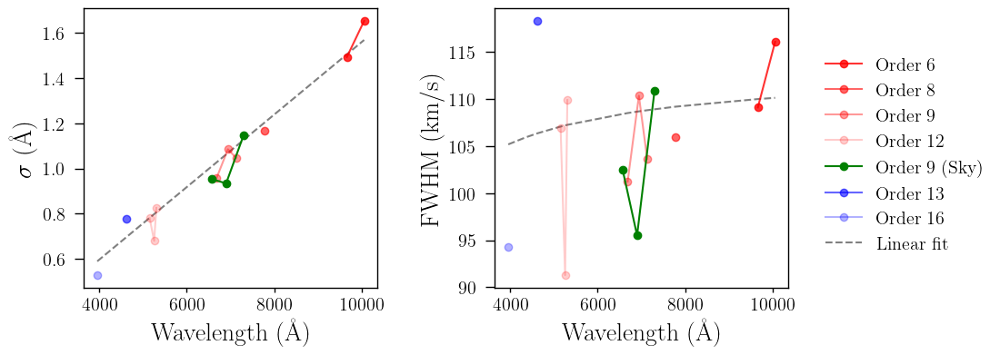

In [181]:
texPlot('on')

fig, axs = plt.subplots(1, 2)
fig.set_size_inches((10, 4))
fig.subplots_adjust(wspace=0.4)

axs[0].plot(x_arc_6, sigma_arc_6, marker='o', label='Order 6', color='red', alpha=0.8)
axs[0].plot(x_arc_8, sigma_arc_8, marker='o', label='Order 8', color='red', alpha=0.6)
axs[0].plot(x_arc_9, sigma_arc_9, marker='o', label='Order 9', color='red', alpha=0.4)
axs[0].plot(x_arc_12, sigma_arc_12, marker='o', label='Order 12', color='red', alpha=0.2)
axs[0].plot(x_sky_9, sigma_sky_9, marker='o', label='Order 9 (Sky)', color='green')
axs[0].plot(x_arc_13, sigma_arc_13, marker='o', label='Order 13', color='blue', alpha=0.6)
axs[0].plot(x_arc_16, sigma_arc_16, marker='o', label='Order 16', color='blue', alpha=0.3)


axs[0].plot(x_arc, (m * x_arc) + n, ls='--', color='gray', label='Linear fit', zorder=0)

axs[0].set_ylabel('$\sigma$ (\AA)')
axs[0].set_xlabel('Wavelength (\AA)')
axs[0].legend(loc=(2.5, 0.1))

axs[1].plot(x_arc_6, FWHM(sigma_arc_6, x_arc_6), marker='o', label='Order 6', color='red', alpha=0.8)
axs[1].plot(x_arc_8, FWHM(sigma_arc_8, x_arc_8), marker='o', label='Order 8', color='red', alpha=0.6)
axs[1].plot(x_arc_9, FWHM(sigma_arc_9, x_arc_9), marker='o', label='Order 9', color='red', alpha=0.4)
axs[1].plot(x_arc_12, FWHM(sigma_arc_12, x_arc_12), marker='o', label='Order 12', color='red', alpha=0.2)
axs[1].plot(x_sky_9, FWHM(sigma_sky_9, x_sky_9), marker='o', label='Order 9 (skylines)', color='green')
axs[1].plot(x_arc_13, FWHM(sigma_arc_13, x_arc_13), marker='o', label='Order 13', color='blue', alpha=0.6)
axs[1].plot(x_arc_16, FWHM(sigma_arc_16, x_arc_16), marker='o', label='Order 16', color='blue', alpha=0.3)


axs[1].plot(x_arc, FWHM((m * x_arc) + n, x_arc), ls='--', color='gray', label='Linear fit', zorder=0)

axs[1].set_ylabel('FWHM (km/s)')
axs[1].set_xlabel('Wavelength (\AA)')

#fig.savefig('/home/benjamin/Documents/analogs/arc_sky.jpg', bbox_inches='tight', dpi=200);

# Balmer decrements

In [182]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_nar.mean(), out_ha_nii.flatchain.Ha_nar.std()) \
            + ufloat(out_ha_nii.flatchain.Ha_brd.mean(), out_ha_nii.flatchain.Ha_brd.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_nar.mean(), out_hb.flatchain.Hb_nar.std()) \
            + ufloat(out_hb.flatchain.Hb_brd.mean(), out_hb.flatchain.Hb_brd.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_nar.mean(), out_hg.flatchain.Hg_nar.std()) \
            + ufloat(out_hg.flatchain.Hg_brd.mean(), out_hg.flatchain.Hg_brd.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_nar.mean(), out_hd.flatchain.Hd_nar.std()) \
            + ufloat(out_hd.flatchain.Hd_brd.mean(), out_hd.flatchain.Hd_brd.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

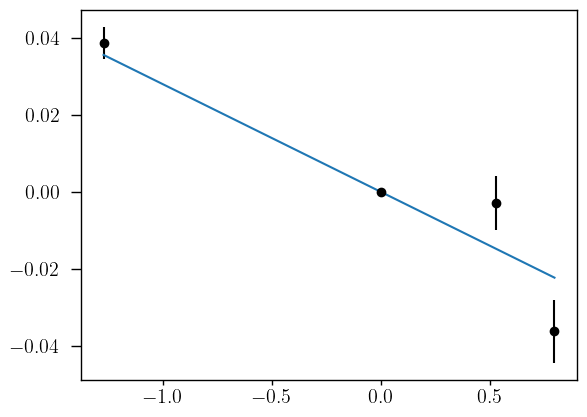

In [183]:
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, x_balmer * (-0.4 * 0.07))

In [184]:
params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.07)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer)) / 0.05

np.random.seed(950)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|██████████████████████████████████████| 2500/2500 [00:16<00:00, 153.18it/s]


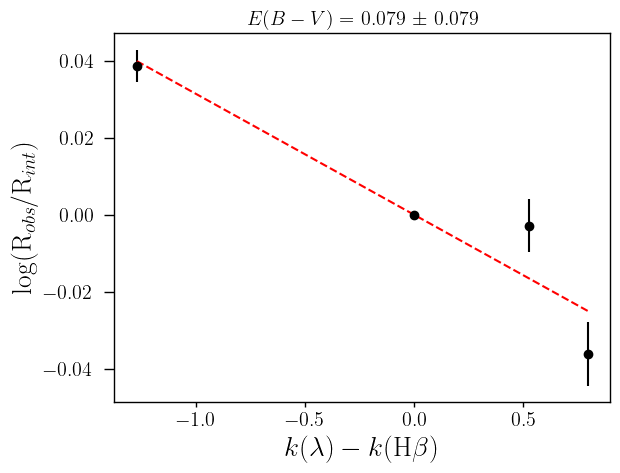

In [185]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'$E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J0136.pdf', bbox_inches='tight')

In [295]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


# Temperatures

In [296]:
oiiia_nar_chain = out_oiii_hei.flatchain.Oiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_brd_chain = out_oiii_hei.flatchain.Oiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_tot_chain = oiiia_nar_chain + oiiia_brd_chain

oiiib_nar_chain = out_oiii_4959.flatchain.Oiiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_brd_chain = out_oiii_4959.flatchain.Oiiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_tot_chain = oiiib_nar_chain + oiiib_brd_chain

oiiic_nar_chain = out_oiiic.flatchain.Oiiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_brd_chain = out_oiiic.flatchain.Oiiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_tot_chain = oiiic_nar_chain + oiiic_brd_chain

siia_nar_chain = out_sii.flatchain.Siia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_brd_chain = out_sii.flatchain.Siia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_tot_chain = siia_nar_chain + siia_brd_chain

siib_nar_chain = out_sii.flatchain.Siib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_brd_chain = out_sii.flatchain.Siib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_tot_chain = siib_nar_chain + siib_brd_chain

oiia_nar_chain = out_oii_7320.flatchain.Oiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_brd_chain = out_oii_7320.flatchain.Oiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_tot_chain = oiia_nar_chain + oiia_brd_chain

oiib_nar_chain = out_oii_7320.flatchain.Oiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_brd_chain = out_oii_7320.flatchain.Oiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_tot_chain = oiib_nar_chain + oiib_brd_chain

oiic_nar_chain = out_oii_3727.flatchain.Oiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_brd_chain = out_oii_3727.flatchain.Oiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_tot_chain = oiic_nar_chain + oiic_brd_chain

oiid_nar_chain = out_oii_3727.flatchain.Oiid_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_brd_chain = out_oii_3727.flatchain.Oiid_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_tot_chain = oiid_nar_chain + oiid_brd_chain

siiia_nar_chain = out_siiia.flatchain.Siiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_brd_chain = out_siiia.flatchain.Siiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))
siiia_tot_chain = siiia_nar_chain + siiia_brd_chain

siiib_nar_chain = out_siiib.flatchain.Siiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_brd_chain = out_siiib.flatchain.Siiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))
siiib_tot_chain = siiib_nar_chain + siiib_brd_chain

siiic_nar_chain = out_oi_siii.flatchain.Siiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_brd_chain = out_oi_siii.flatchain.Siiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_tot_chain = siiic_nar_chain + siiic_brd_chain

niia_nar_chain = out_ha_nii.flatchain.Niia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_brd_chain = out_ha_nii.flatchain.Niia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_tot_chain = niia_nar_chain + niia_brd_chain

niib_nar_chain = out_ha_nii.flatchain.Niia_nar * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_brd_chain = out_ha_nii.flatchain.Niia_brd * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_tot_chain = niib_nar_chain + niib_brd_chain

hd_nar_chain = out_hd.flatchain.Hd_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_brd_chain = out_hd.flatchain.Hd_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_tot_chain = hd_nar_chain + hd_brd_chain

hg_nar_chain = out_hg.flatchain.Hg_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_brd_chain = out_hg.flatchain.Hg_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_tot_chain = hg_nar_chain + hg_brd_chain

hb_nar_chain = out_hb.flatchain.Hb_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_brd_chain = out_hb.flatchain.Hb_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_tot_chain = hb_nar_chain + hb_brd_chain

ha_nar_chain = out_ha_nii.flatchain.Ha_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_brd_chain = out_ha_nii.flatchain.Ha_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_tot_chain = ha_nar_chain + ha_brd_chain

In [297]:
chains_dict = {'[OII]3726_nar': oiid_nar_chain.to_numpy(),
               '[OII]3726_brd': oiid_brd_chain.to_numpy(),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': oiic_nar_chain.to_numpy(),
               '[OII]3729_brd': oiic_brd_chain.to_numpy(),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               'Hd_nar': hd_nar_chain.to_numpy(),
               'Hd_brd': hd_brd_chain.to_numpy(),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': hg_nar_chain.to_numpy(),
               'Hg_brd': hg_brd_chain.to_numpy(),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': oiiic_nar_chain.to_numpy(),
               '[OIII]4363_brd': oiiic_brd_chain.to_numpy(),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': np.nan * np.ones(10000),
               'HeI4471_brd': np.nan * np.ones(10000),
               'HeI4471': np.nan * np.ones(10000),
               
               'HeII4686_nar': np.nan * np.ones(10000),
               'HeII4686_brd': np.nan * np.ones(10000),
               'HeII4686': np.nan * np.ones(10000),
               
               'Hb_nar': hb_nar_chain.to_numpy(),
               'Hb_brd': hb_brd_chain.to_numpy(),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': oiiib_nar_chain.to_numpy(),
               '[OIII]4959_brd': oiiib_brd_chain.to_numpy(),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': oiiia_nar_chain.to_numpy(),
               '[OIII]5007_brd': oiiia_brd_chain.to_numpy(),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': np.nan * np.ones(10000),
               '[NII]5755_brd': np.nan * np.ones(10000),
               '[NII]5755': np.nan * np.ones(10000),
               
               'HeI5875_nar': np.nan * np.ones(10000),
               'HeI5875_brd': np.nan * np.ones(10000),
               'HeI5875': np.nan * np.ones(10000),
               
               '[SIII]6312_nar': siiic_nar_chain.to_numpy(),
               '[SIII]6312_brd': siiic_brd_chain.to_numpy(),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': niib_nar_chain.to_numpy(),
               '[NII]6548_brd': niib_brd_chain.to_numpy(),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': ha_nar_chain.to_numpy(),
               'Ha_brd': ha_brd_chain.to_numpy(),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': niia_nar_chain.to_numpy(),
               '[NII]6584_brd': niia_brd_chain.to_numpy(),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': np.nan * np.ones(10000),
               'HeI6678_brd': np.nan * np.ones(10000),
               'HeI6678': np.nan * np.ones(10000),
               
               '[SII]6716_nar': siib_nar_chain.to_numpy(),
               '[SII]6716_brd': siib_brd_chain.to_numpy(),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': siia_nar_chain.to_numpy(),
               '[SII]6730_brd': siia_brd_chain.to_numpy(),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': np.nan * np.ones(10000),
               'HeI7065_brd': np.nan * np.ones(10000),
               'HeI7065': np.nan * np.ones(10000),
               
               '[OII]7319_nar': oiib_nar_chain.to_numpy(),
               '[OII]7319_brd': oiib_brd_chain.to_numpy(),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': oiia_nar_chain.to_numpy(),
               '[OII]7330_brd': oiia_brd_chain.to_numpy(),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': siiib_nar_chain.to_numpy(),
               '[SIII]9069_brd': siiib_brd_chain.to_numpy(),
               '[SIII]9069': siiib_tot_chain.to_numpy(),
               
               '[SIII]9532_nar': siiia_nar_chain.to_numpy(),
               '[SIII]9532_brd': siiia_brd_chain.to_numpy(),
               '[SIII]9532': siiia_tot_chain.to_numpy()
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J0136.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J0021.csv')

In [298]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': None,
              'HeI4471_err': None,
              'HeII4686': None,
              'HeII4686_err': None,
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5575': None,
              '[NII]5575_err': None,
              'HeI5875': None,
              'HeI5875_err': None,
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': None,
              'HeI6678_err': None,
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': None,
              'HeI7065_err': None,
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': siiib_tot_chain.mean(),
              '[SIII]9069_err': siiib_tot_chain.std(),
              '[SIII]9532': siiia_tot_chain.mean(),
              '[SIII]9532_err': siiia_tot_chain.std()
              
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal

galname = 'J0136'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]

if E_BV < 0:
    E_BV = 0

In [3]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J0136.csv')

In [4]:
t_OIII_nar = TO3(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['[OIII]4363_nar'].to_numpy())
t_OIII_brd = TO3(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['[OIII]4363_brd'].to_numpy())
t_OIII_tot = TO3(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['[OIII]4363'].to_numpy())

O2_H_nar = 10**(double_log_OH(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OIII_nar) - 12)
O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
O2_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['Hb'].to_numpy()    , t_OIII_tot) - 12)

IO2_R_nar = 9.36 * (t_OIII_nar**0.44) * O2_H_nar * chains['Hb_nar'].to_numpy()
IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
IO2_R_tot = 9.36 * (t_OIII_tot**0.44) * O2_H_tot * chains['Hb'].to_numpy()    

den_nar = ne(chains['[SII]6730_nar'].to_numpy(), chains['[SII]6716_nar'].to_numpy(), t_OIII_nar)
den_brd = ne(chains['[SII]6730_brd'].to_numpy(), chains['[SII]6716_brd'].to_numpy(), t_OIII_brd)
den_tot = ne(chains['[SII]6730'].to_numpy()    , chains['[SII]6716'].to_numpy()    , t_OIII_tot)

t_OII_nar = TO2(chains['[OII]7330_nar'].to_numpy(), chains['[OII]7319_nar'].to_numpy(), chains['[OII]3729_nar'].to_numpy(), chains['[OII]3726_nar'].to_numpy(), den_nar, IO2_R_nar)
t_OII_brd = TO2(chains['[OII]7330_brd'].to_numpy(), chains['[OII]7319_brd'].to_numpy(), chains['[OII]3729_brd'].to_numpy(), chains['[OII]3726_brd'].to_numpy(), den_brd, IO2_R_brd)
t_OII_tot = TO2(chains['[OII]7330'].to_numpy()    , chains['[OII]7319'].to_numpy()    , chains['[OII]3729'].to_numpy()    , chains['[OII]3726'].to_numpy()    , den_tot, IO2_R_tot)

# Garnett
t_OII_tot_garnett = ((0.7 * (t_OIII_tot * 10)) + 0.3) / 10

# PM17 DENSITY DEPENDENT
#t_OII_tot_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_tot_lin = (slope_o3o2 * t_OIII_tot) + intercept_o3o2

# Non-linear
#t_OII_tot_nlin = (2.4 / ((t_OIII_tot**-1) + 1.5))

# Polynomial
#t_OII_tot_poly = (-6.6 * t_OIII_tot) + (15.1 * (t_OIII_tot**2)) + (-8.3 * (t_OIII_tot**3)) + (0.69 * (t_OIII_tot**5))

# Square root
#t_OII_tot_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot))

t_SIII_nar = TS3(chains['[SIII]9532_nar'].to_numpy(), chains['[SIII]9069_nar'].to_numpy(), chains['[SIII]6312_nar'].to_numpy())
t_SIII_brd = TS3(chains['[SIII]9532_brd'].to_numpy(), chains['[SIII]9069_brd'].to_numpy(), chains['[SIII]6312_brd'].to_numpy())
t_SIII_tot = TS3(chains['[SIII]9532'].to_numpy()    , chains['[SIII]9069'].to_numpy()    , chains['[SIII]6312'].to_numpy()    )

/home/benjamin/Documents/analogs/magE/functions.py:807: RuntimeWarning: invalid value encountered in log10
  s1 = 6.1868 + (1.2491 / th) - (0.5816 * np.log10(th))
/tmp/ipykernel_328547/1394997360.py:10: RuntimeWarning: invalid value encountered in power
  IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()


(0.0, 1.0, 0.0, 1.0)

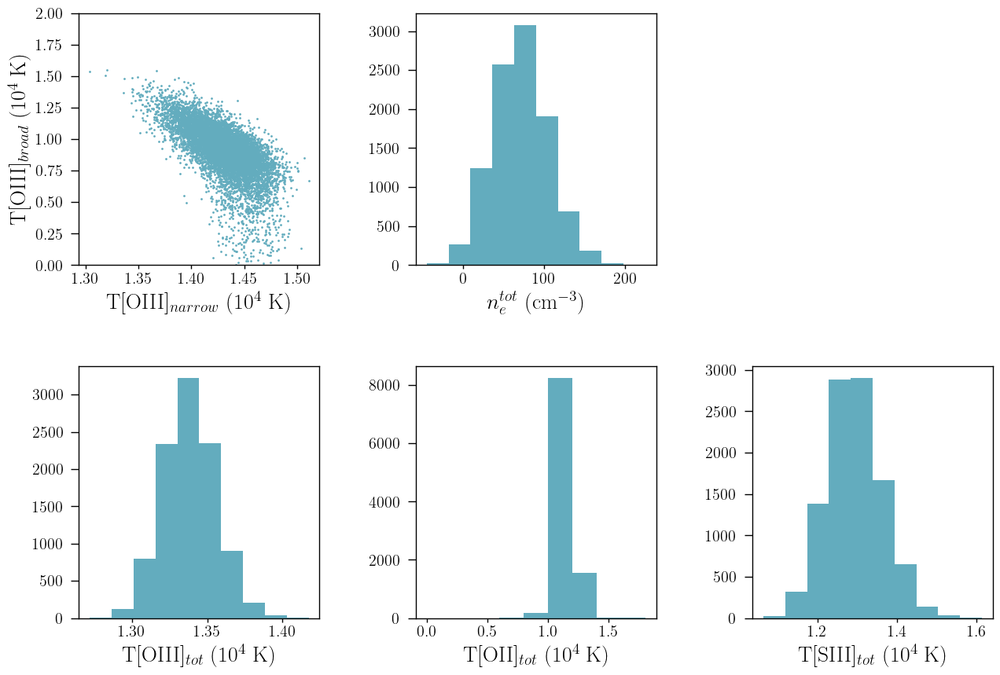

In [5]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')
axs[0, 0].set_ylim(0, 2)

axs[1, 0].hist(t_OIII_tot, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(den_tot, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(t_OII_tot, color=cr[2], bins=np.arange(0, 2, 0.2))
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

axs[1, 2].hist(t_SIII_tot, color=cr[2])
axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 2].axis('off')

In [6]:
t_OIII_nar_mean = np.nanpercentile(t_OIII_nar, 50)
t_OIII_nar_16 = np.nanpercentile(t_OIII_nar, 16)
t_OIII_nar_84 = np.nanpercentile(t_OIII_nar, 84)

t_OIII_brd_mean = np.nanpercentile(t_OIII_brd, 50)
t_OIII_brd_16 = np.nanpercentile(t_OIII_brd, 16)
t_OIII_brd_84 = np.nanpercentile(t_OIII_brd, 84)

t_OIII_tot_mean = np.nanpercentile(t_OIII_tot, 50)
t_OIII_tot_16 = np.nanpercentile(t_OIII_tot, 16)
t_OIII_tot_84 = np.nanpercentile(t_OIII_tot, 84)

# Measured by me
t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Photoionization models
t_OII_garnett = ((0.7 * (t_OIII_tot_mean * 10)) + 0.3) / 10
t_OII_garnett_16 = ((0.7 * (t_OIII_tot_16 * 10)) + 0.3) / 10
t_OII_garnett_84 = ((0.7 * (t_OIII_tot_84 * 10)) + 0.3) / 10

# Using PM
#t_OII_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_mean**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_16 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_16**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_84 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_84**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_lin = (slope_o3o2 * t_OIII_tot_mean) + intercept_o3o2
t_OII_lin_16 = (slope_o3o2 * t_OIII_tot_16) + intercept_o3o2
t_OII_lin_84 = (slope_o3o2 * t_OIII_tot_84) + intercept_o3o2

# Non-linear
#t_OII_nlin = (2.4 / ((t_OIII_tot_mean**-1) + 1.5))
#t_OII_nlin_16 = (2.4 / ((t_OIII_tot_16**-1) + 1.5))
#t_OII_nlin_84 = (2.4 / ((t_OIII_tot_84**-1) + 1.5))

# Polynomial
#t_OII_poly = (-6.6 * t_OIII_tot_mean) + (15.1 * (t_OIII_tot_mean**2)) + (-8.3 * (t_OIII_tot_mean**3)) + (0.69 * (t_OIII_tot_mean**5))
#t_OII_poly_16 = (-6.6 * t_OIII_tot_16) + (15.1 * (t_OIII_tot_16**2)) + (-8.3 * (t_OIII_tot_16**3)) + (0.69 * (t_OIII_tot_16**5))
#t_OII_poly_84 = (-6.6 * t_OIII_tot_84) + (15.1 * (t_OIII_tot_84**2)) + (-8.3 * (t_OIII_tot_84**3)) + (0.69 * (t_OIII_tot_84**5))

# Square-root
#t_OII_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot_mean))
#t_OII_sqrt_16 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_16))
#t_OII_sqrt_84 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_84))

density = np.nanpercentile(den_tot, 50)
density_16 = np.nanpercentile(den_tot, 16)
density_84 = np.nanpercentile(den_tot, 84)

t_SIII = np.nanpercentile(t_SIII_tot, 50)
t_SIII_16 = np.nanpercentile(t_SIII_tot, 16)
t_SIII_84 = np.nanpercentile(t_SIII_tot, 84)

In [303]:
temden_dict = {'galname': galname,
               'tOIII_nar': t_OIII_nar_mean,
               'tOIII_nar_16': t_OIII_nar_16,
               'tOIII_nar_84': t_OIII_nar_84,
               'tOIII_brd': t_OIII_brd_mean,
               'tOIII_brd_16': t_OIII_brd_16,
               'tOIII_brd_84': t_OIII_brd_84,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               #'tOII_PM': t_OII_PM,
               #'tOII_PM_16': t_OII_PM_16,
               #'tOII_PM_84': t_OII_PM_84,
               #'tOII_lin': t_OII_lin,
               #'tOII_lin_16': t_OII_lin_16,
               #'tOII_lin_84': t_OII_lin_84,
               #'tOII_nlin': t_OII_nlin,
               #'tOII_nlin_16': t_OII_nlin_16,
               #'tOII_nlin_84': t_OII_nlin_84,
               #'tOII_poly': t_OII_poly,
               #'tOII_poly_16': t_OII_poly_16,
               #'tOII_poly_84': t_OII_poly_84,
               #'tOII_sqrt': t_OII_sqrt,
               #'tOII_sqrt_16': t_OII_sqrt_16,
               #'tOII_sqrt_84': t_OII_sqrt_84,
               'ne': density,
               'ne_16': density_16,
               'ne_84': density_84,
               'tNII': None,
               'tNII_16': None,
               'tNII_84': None,
               'tSIII': t_SIII,
               'tSIII_16': t_SIII_16,
               'tSIII_84': t_SIII_84,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


In [10]:
temden_dict = {'galname': galname,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               'tOII_lin': t_OII_lin,
               'tOII_lin_16': t_OII_lin_16,
               'tOII_lin_84': t_OII_lin_84
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


# Abundances

### No HeII4686 line detected

In [11]:
# OXYGEN MEASURED

log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_tot = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot)

O2plus_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) #* ICF_Oxygen
log_OH_tot = np.log10(O_H_tot) + 12

/home/benjamin/Documents/analogs/magE/functions.py:800: RuntimeWarning: invalid value encountered in log10
  s1 = 5.887 + (1.641 / tl) - (0.543 * np.log10(tl)) + (1.14e-4 * n)


In [12]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot)

O2plus_H_G92 = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_G92 = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) #* ICF_Oxygen
log_OH_G92 = np.log10(O_H_G92) + 12

In [14]:
# OXYGEN lin

log_O2plus_H_lin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_lin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot)

O2plus_H_lin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_lin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_lin = (O2plus_H_lin + Oplus_H_lin) #* ICF_Oxygen
log_OH_lin = np.log10(O_H_lin) + 12

In [13]:
# OXYGEN PM

#log_O2plus_H_PM = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_PM = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot)

#O2plus_H_PM = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_PM = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

#O_H_PM = (O2plus_H_PM + Oplus_H_PM) #* ICF_Oxygen
#log_OH_PM = np.log10(O_H_PM) + 12

In [15]:
# OXYGEN nlin

#log_O2plus_H_nlin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_nlin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot)

#O2plus_H_nlin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_nlin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

#O_H_nlin = (O2plus_H_nlin + Oplus_H_nlin) #* ICF_Oxygen
#log_OH_nlin = np.log10(O_H_nlin) + 12

In [16]:
# OXYGEN poly

#log_O2plus_H_poly = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_poly = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot)

#O2plus_H_poly = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_poly = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

#O_H_poly = (O2plus_H_poly + Oplus_H_poly) #* ICF_Oxygen
#log_OH_poly = np.log10(O_H_poly) + 12

In [17]:
# OXYGEN sqrt

#log_O2plus_H_sqrt = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_sqrt = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot)

#O2plus_H_sqrt = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_sqrt = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot) - 12)

#ICF_Oxygen = 1 + (y2_plus / y_plus)

#O_H_sqrt = (O2plus_H_sqrt + Oplus_H_sqrt) #* ICF_Oxygen
#log_OH_sqrt = np.log10(O_H_sqrt) + 12

In [15]:
# SULFUR

log_S2plus_H_tot = double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot)
log_Splus_H_tot = single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

S2plus_H_tot = 10**(double_log_S(chains['[SIII]9532'].to_numpy(), chains['[SIII]9069'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot) - 12)
Splus_H_tot = 10**(single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot) - 12)

ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)

S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
log_SH_tot = np.log10(S_H_tot) + 12

/home/benjamin/Documents/analogs/magE/functions.py:843: RuntimeWarning: invalid value encountered in log10
  s1 = 5.463 + (0.941 / tl) - (0.37 * np.log10(tl))


In [16]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'].to_numpy(), chains['[NII]6548'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = np.log10(N_H_tot) + 12

/home/benjamin/Documents/analogs/magE/functions.py:868: RuntimeWarning: invalid value encountered in log10
  s1 = 6.291 + (0.90221 / tl) - (0.5511 * np.log10(tl))


In [17]:
# Nitrogen-to-Oxygen ratio
log_NO_tot = log_NO(chains['[NII]6584'].to_numpy(), chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), t_OII_tot)

/home/benjamin/Documents/analogs/magE/functions.py:879: RuntimeWarning: invalid value encountered in log10
  s1 = 0.493 - (0.025 * tl) - (0.687 / tl) + (0.1621 * np.log10(tl))


Text(0.5, 0, '12 + log(N/O)')

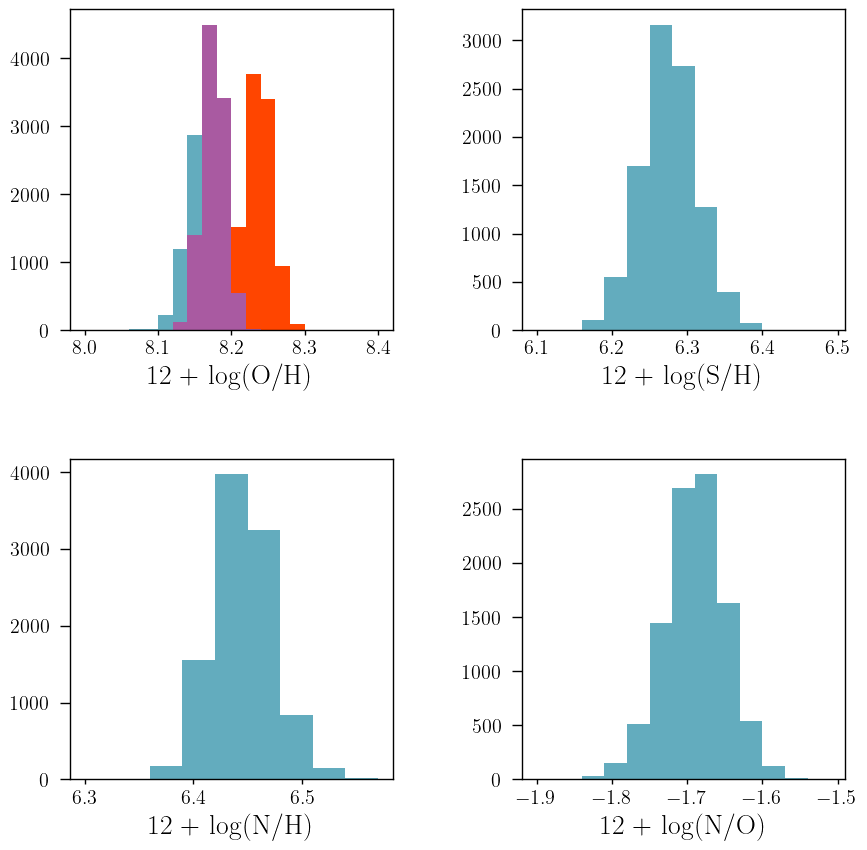

In [18]:
texPlot('on')
fig, axs = plt.subplots(2, 2)
fig.set_size_inches((10, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(log_OH_tot, color=cr[2], bins=np.arange(8.0, 8.4, 0.02))
axs[0, 0].hist(log_OH_G92, color='Orangered', bins=np.arange(8.1, 8.4, 0.02))
#axs[0, 0].hist(log_OH_PM, color='Pink', bins=np.arange(8.0, 8.4, 0.02))
axs[0, 0].hist(log_OH_lin, color=cz[1], bins=np.arange(8.0, 8.4, 0.02))
#axs[0, 0].hist(log_OH_nlin, color='Green', bins=np.arange(8.0, 8.4, 0.02))
#axs[0, 0].hist(log_OH_poly, color='Blue', bins=np.arange(8.0, 8.4, 0.02))
#axs[0, 0].hist(log_OH_sqrt, color='Gray', bins=np.arange(8.0, 8.4, 0.02))

axs[0, 0].set_xlabel(r'12 + log(O/H)')

axs[0, 1].hist(log_SH_tot, color=cr[2], bins=np.arange(6.1, 6.5, 0.03))
axs[0, 1].set_xlabel(r'12 + log(S/H)')

axs[1, 0].hist(log_NH_tot, color=cr[2], bins=np.arange(6.3, 6.6, 0.03))
axs[1, 0].set_xlabel(r'12 + log(N/H)')

axs[1, 1].hist(log_NO_tot, color=cr[2], bins=np.arange(-1.9, -1.5, 0.03))
axs[1, 1].set_xlabel(r'12 + log(N/O)')


In [19]:
#He_tot_mean = np.nanpercentile(y, 50)
#He_tot_16 = np.nanpercentile(y, 16)
#He_tot_84 = np.nanpercentile(y, 84)

log_OH_tot_mean = np.nanpercentile(log_OH_tot, 50)
log_OH_tot_16 = np.nanpercentile(log_OH_tot, 16)
log_OH_tot_84 = np.nanpercentile(log_OH_tot, 84)

log_OH_G92_mean = np.nanpercentile(log_OH_G92, 50)
log_OH_G92_16 = np.nanpercentile(log_OH_G92, 16)
log_OH_G92_84 = np.nanpercentile(log_OH_G92, 84)

#log_OH_PM_mean = np.nanpercentile(log_OH_PM, 50)
#log_OH_PM_16 = np.nanpercentile(log_OH_PM, 16)
#log_OH_PM_84 = np.nanpercentile(log_OH_PM, 84)

log_OH_lin_mean = np.nanpercentile(log_OH_lin, 50)
log_OH_lin_16 = np.nanpercentile(log_OH_lin, 16)
log_OH_lin_84 = np.nanpercentile(log_OH_lin, 84)

#log_OH_nlin_mean = np.nanpercentile(log_OH_nlin, 50)
#log_OH_nlin_16 = np.nanpercentile(log_OH_nlin, 16)
#log_OH_nlin_84 = np.nanpercentile(log_OH_nlin, 84)

#log_OH_poly_mean = np.nanpercentile(log_OH_poly, 50)
#log_OH_poly_16 = np.nanpercentile(log_OH_poly, 16)
#log_OH_poly_84 = np.nanpercentile(log_OH_poly, 84)

#log_OH_sqrt_mean = np.nanpercentile(log_OH_sqrt, 50)
#log_OH_sqrt_16 = np.nanpercentile(log_OH_sqrt, 16)
#log_OH_sqrt_84 = np.nanpercentile(log_OH_sqrt, 84)

log_SH_tot_mean = np.nanpercentile(log_SH_tot, 50)
log_SH_tot_16 = np.nanpercentile(log_SH_tot, 16)
log_SH_tot_84 = np.nanpercentile(log_SH_tot, 84)

log_NH_tot_mean = np.nanpercentile(log_NH_tot, 50)
log_NH_tot_16 = np.nanpercentile(log_NH_tot, 16)
log_NH_tot_84 = np.nanpercentile(log_NH_tot, 84)

log_NO_tot_mean = np.nanpercentile(log_NO_tot, 50)
log_NO_tot_16 = np.nanpercentile(log_NO_tot, 16)
log_NO_tot_84 = np.nanpercentile(log_NO_tot, 84)

In [311]:
abundance_dict = {'galname': galname,
               'He/H': None,
               'He/H_16': None,
               'He/H_84': None,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               #'log_OH_PM': log_OH_PM_mean,
               #'log_OH_PM_16': log_OH_PM_16,
               #'log_OH_PM_84': log_OH_PM_84,
               #'log_OH_lin': log_OH_lin_mean,
               #'log_OH_lin_16': log_OH_lin_16,
               #'log_OH_lin_84': log_OH_lin_84,
               #'log_OH_nlin': log_OH_nlin_mean,
               #'log_OH_nlin_16': log_OH_nlin_16,
               #'log_OH_nlin_84': log_OH_nlin_84,
               #'log_OH_poly': log_OH_poly_mean,
               #'log_OH_poly_16': log_OH_poly_16,
               #'log_OH_poly_84': log_OH_poly_84,
               #'log_OH_sqrt': log_OH_sqrt_mean,
               #'log_OH_sqrt_16': log_OH_sqrt_16,
               #'log_OH_sqrt_84': log_OH_sqrt_84,
               'log_SH': log_SH_tot_mean,
               'log_SH_16': log_SH_tot_16,
               'log_SH_84': log_SH_tot_84,
               'log_NH': log_NH_tot_mean,
               'log_NH_16': log_NH_tot_16,
               'log_NH_84': log_NH_tot_84,
               'log_NO': log_NO_tot_mean,
               'log_NO_16': log_NO_tot_16,
               'log_NO_84': log_NO_tot_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


In [20]:
abundance_dict = {'galname': galname,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               'log_OH_lin': log_OH_lin_mean,
               'log_OH_lin_16': log_OH_lin_16,
               'log_OH_lin_84': log_OH_lin_84
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J0136, adding new data...
Done.


# Test for Starlight

(3200.0, 10000.0)

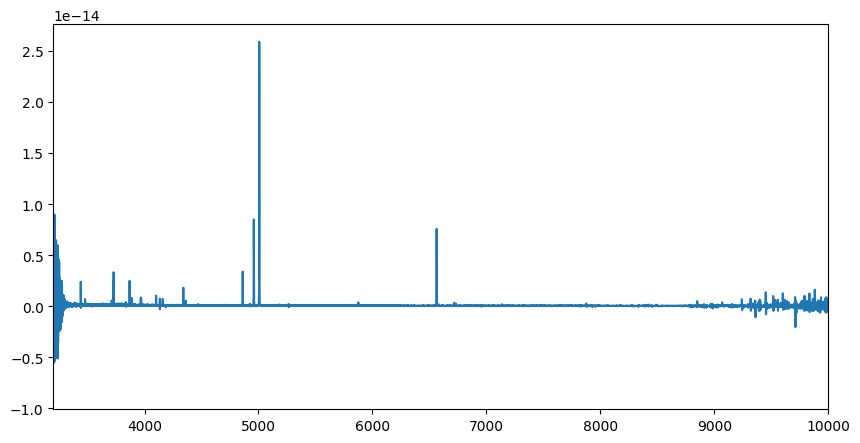

In [18]:
rf_wave = wave / (1 + z_nar_oiii_4959)
plt.figure(figsize=(10, 5))
plt.plot(rf_wave, flux)
plt.xlim(3200, 10000)

In [19]:
import spectres

rf_new_wave = np.arange(3300, 10000, 1)
new_flux, new_err = spectres.spectres(rf_new_wave, rf_wave, flux, err)

mask_flux = (new_flux > 0)

(-1e-17, 2e-16)

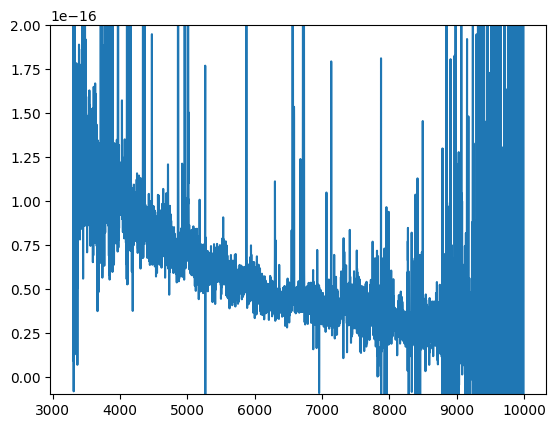

In [22]:
plt.plot(rf_new_wave, new_flux)
plt.ylim(-0.1e-16, 0.2e-15)

In [23]:
mask = False
mask_count = 0
mask_list = []
for line in wave_cat:
    if (wave_cat[line] > 3300) & (wave_cat[line] < 10000):
        sigma_line = (1.6840e-04 * (wave_cat[line] * (1 + z_nar_oiii_4959))) - 0.11482314
        sigma3 = 3 * np.sqrt(((upy.nominal_values(sigma_brd_intrinsic)**2) + (sigma_line**2)))
        lim_sup = wave_cat[line] + sigma3
        lim_inf = wave_cat[line] - sigma3
        mask_list.append([round(lim_inf), round(lim_sup)])
        mask_count += 1
        mask += (rf_new_wave > lim_inf) & (rf_new_wave < lim_sup)

In [24]:
with open('J0136_mask.cxt', 'a', newline='\n') as f:
    f.write(str(mask_count)+'\n')
    for masks in mask_list:
        f.write(str(masks[0])+' '+str(masks[1])+' '+'0\n')

In [25]:
from scipy.signal import medfilt
gpixs = np.where(abs(new_flux[~mask]-medfilt(new_flux[~mask],31))<0.7e-16)[0]

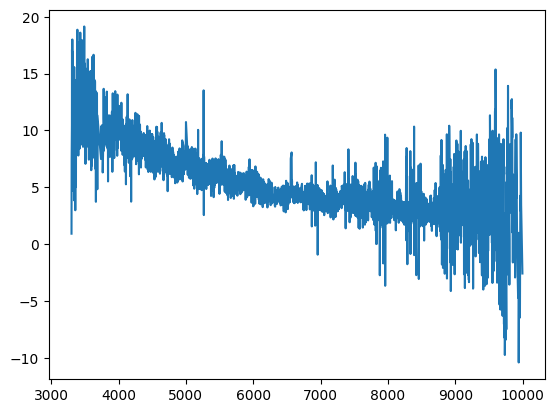

In [26]:
plt.plot(rf_new_wave[~mask][gpixs], new_flux[~mask][gpixs]/1e-17)
#plt.xlim(6500, 7000)
#plt.ylim(1e-16, 3e-16)

In [27]:
from astropy.io import ascii
for i in range(len(rf_new_wave)):
    if i in gpixs:
        flag = 0
    else:
        flag = 99
    spec_str = str(rf_new_wave[i])+' '+str(new_flux[i]/1e-17)+' '+str(new_err[i]/1e-17)+' '+str(flag)+'\n'
    with open('J0136.cxt', 'a', newline='\n') as f:
        f.write(spec_str)

In [28]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

111.22532538686987

# After fitting

In [30]:
with open('/home/benjamin/Documents/STARLIGHTv04/J0136/J0136.cxt.sc4.C99.im.CAL.BS', 'r') as bf:
    # limits of lines to read
    line_lims = [531, 7231]
    # To store lines
    lines = []
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 7231:
            # don't read after line 7 to save time
            break
print(lines)

['3300.00    3.29650   2.23270   -2.000', '3301.00    2.82340   2.22041   -2.000', '3302.00    0.14446   2.21331    0.900', '3303.00    0.69197   2.21106    0.920', '3304.00    1.17814   2.21088    0.959', '3305.00    3.97532   2.21116   -2.000', '3306.00    3.55174   2.21149   -2.000', '3307.00    2.54271   2.21183   -2.000', '3308.00    1.65097   2.21217    1.039', '3309.00    2.69339   2.21252    1.041', '3310.00   -0.13113   2.21286   -2.000', '3311.00    2.55679   2.21319    1.110', '3312.00    0.76381   2.21343    1.092', '3313.00    2.40825   2.21290    1.118', '3314.00    2.83525   2.20895    1.136', '3315.00    0.82992   2.19705    1.210', '3316.00    0.74155   2.17671    1.192', '3317.00    0.83188   2.15637    1.198', '3318.00    2.87033   2.14445   -2.000', '3319.00    3.23530   2.14052   -2.000', '3320.00    2.65883   2.14018    1.273', '3321.00    3.10474   2.14128   -2.000', '3322.00    3.71308   2.14359   -2.000', '3323.00    1.61281   2.14594    1.318', '3324.00    1.3

In [31]:
wl = []
input_flux = []
best_model = []
for element in lines:
    wl.append(float(element.split()[0]))
    input_flux.append(float(element.split()[1]))
    best_model.append(float(element.split()[2]))

(0.0, 5.0)

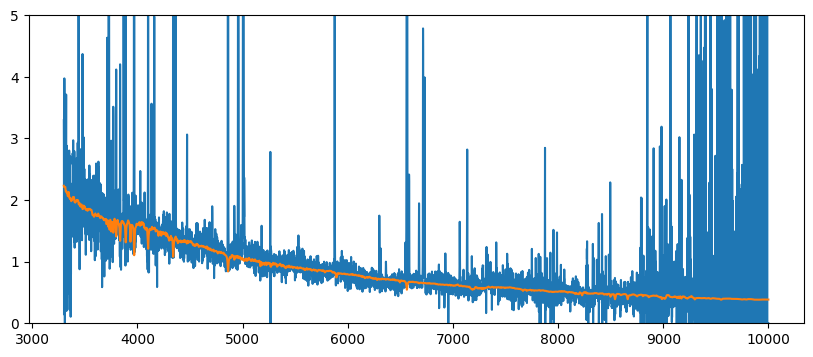

In [32]:
plt.figure(figsize=(10, 4))
plt.plot(wl, input_flux)
plt.plot(wl, best_model)
#plt.xlim(4500, 5000)
plt.ylim(0, 5)

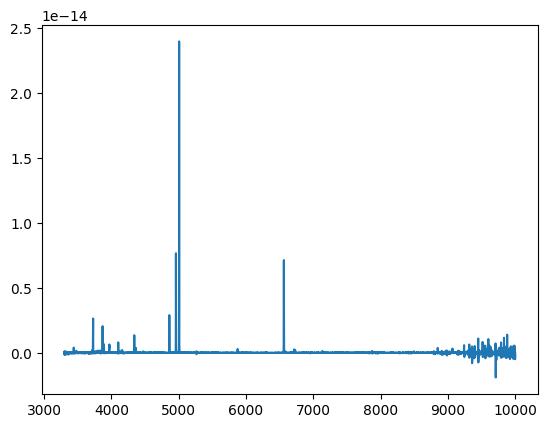

In [33]:
plt.plot(np.array(wl), (np.array(input_flux) - np.array(best_model)) * 6.351274E+00 * 1e-17)

In [35]:
np.log10(1.21893E+04 * 1e-17 * (1/3.826e33) * 4 * np.pi * ((8.3e+26)**2))

8.44059984900764

In [18]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

111.22532538686987

In [19]:
z_nar_oiii_4959

0.059743843974085